In [17]:
from multi_imbalance.datasets import load_datasets
import experiment as ex
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from multi_imbalance.utils.metrics import gmean_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from utils import plot_embeddings
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [18]:
datasets = load_datasets()

In [19]:
ds_name = 'new_yeast'
test_on_all_folds = True
test_all_ds = True

In [20]:
datasets = ex.one_hot_encode_all(datasets)

In [21]:
config = ex.config_calculation_strategy2(datasets)

In [22]:
config['cmc'] = {'nn_config': {'units_1st_layer': 17,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 200}

config['dermatology'] = {'nn_config': {'units_1st_layer': 97,
   'units_2nd_layer': 512,
   'units_3rd_layer': 256,
   'units_latent_layer': 2},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 16,
  'gamma': 0.9,
  'epochs': 100}

config['hayes-roth'] = {'nn_config': {'units_1st_layer': 11,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 150}

config['new_vehicle'] = {'nn_config': {'units_1st_layer': 18,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.90,
 'epochs': 100}

config['new_yeast'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 300,
  'units_3rd_layer': 200,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0004,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 100}

config['balance-scale'] = {'nn_config': {'units_1st_layer': 16,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['cleveland'] = {'nn_config': {'units_1st_layer': 24,
  'units_2nd_layer': 72,
  'units_3rd_layer': 48,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 32,
 'gamma': 0.95,
 'epochs': 100}

config['cleveland_v2'] = {'nn_config': {'units_1st_layer': 23,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 150}

config['glass'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.00001,
 'batch_size': 16,
 'gamma': 0.90,
 'epochs': 70}

config['thyroid-newthyroid'] = {'nn_config': {'units_1st_layer': 5,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 100}

config['new_ecoli'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.85,
 'epochs': 100}

config['new_led7digit'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 8},
 'weighted_triplet_loss': True,
 'lr': 0.0003,
 'batch_size': 16,
 'gamma': 0.85,
 'epochs': 70}

config['new_winequality-red'] = {'nn_config': {'units_1st_layer': 11,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 100}

config['4delikatne-bezover-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

In [23]:
config

{'1czysty-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 16,
   'units_3rd_layer': 8,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 32,
  'gamma': 0.95,
  'epochs': 100},
 '2delikatne-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 16,
   'units_3rd_layer': 8,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 32,
  'gamma': 0.95,
  'epochs': 100},
 '3mocniej-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 16,
   'units_3rd_layer': 8,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 32,
  'gamma': 0.95,
  'epochs': 100},
 '4delikatne-bezover-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 'balance-scale': {'nn_config': {'un

In [24]:
def instantiate_classifiers():
    classifiers = {
            "RF24": RandomForestClassifier(random_state=0, min_samples_leaf=2, min_samples_split=4, class_weight='balanced'),
            "DT": DecisionTreeClassifier(random_state=0, min_samples_split=4, min_samples_leaf=2, class_weight='balanced'),
            "KNN": KNeighborsClassifier(n_neighbors=1)
        } 
    return classifiers

In [25]:
from experiment import dt_name_to_cols_to_encode

cmc


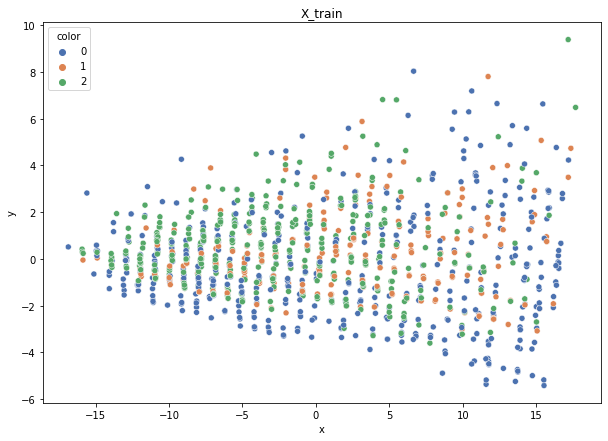

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 2494.50it/s]


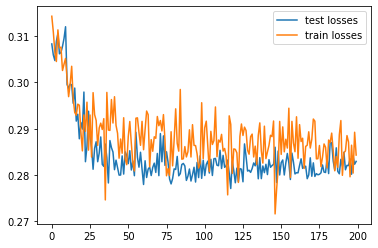

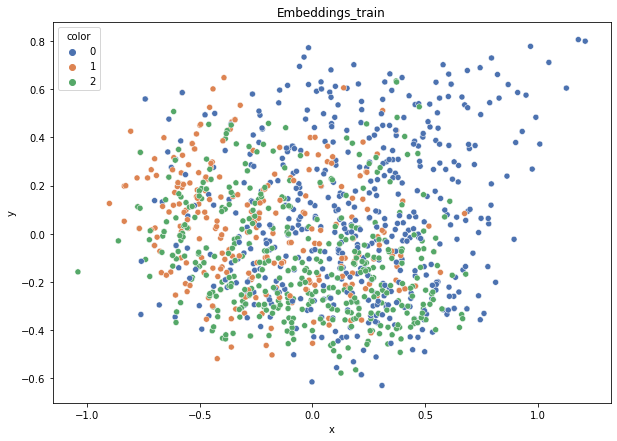

DT-f1-new-features: 0.418
DT-f1-old+new-features: 0.455
DT-f1-old-features: 0.469
DT-gmean-new-features: 0.422
DT-gmean-old+new-features: 0.459
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.426
KNN-f1-old+new-features: 0.45
KNN-f1-old-features: 0.436
KNN-gmean-new-features: 0.427
KNN-gmean-old+new-features: 0.442
KNN-gmean-old-features: 0.428
RF24-f1-new-features: 0.454
RF24-f1-old+new-features: 0.519
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.452
RF24-gmean-old+new-features: 0.507
RF24-gmean-old-features: 0.523


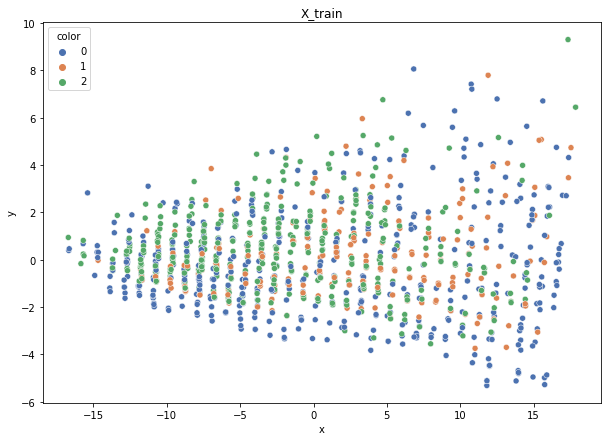

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 2527.57it/s]


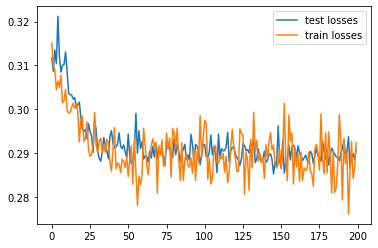

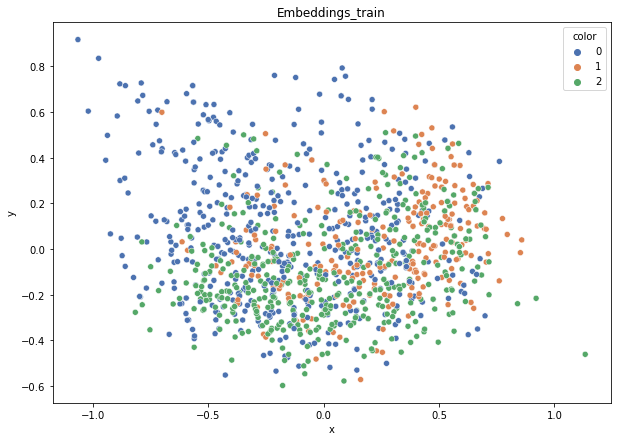

DT-f1-new-features: 0.354
DT-f1-old+new-features: 0.481
DT-f1-old-features: 0.491
DT-gmean-new-features: 0.354
DT-gmean-old+new-features: 0.488
DT-gmean-old-features: 0.503
KNN-f1-new-features: 0.434
KNN-f1-old+new-features: 0.449
KNN-f1-old-features: 0.485
KNN-gmean-new-features: 0.431
KNN-gmean-old+new-features: 0.446
KNN-gmean-old-features: 0.484
RF24-f1-new-features: 0.445
RF24-f1-old+new-features: 0.497
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.44
RF24-gmean-old+new-features: 0.494
RF24-gmean-old-features: 0.519


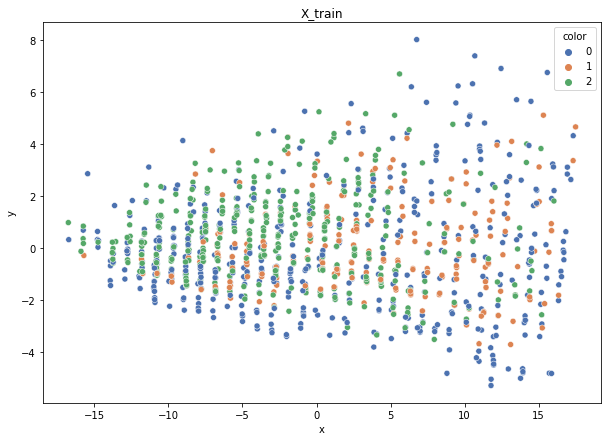

Class cardinalities: Counter({0: 503, 2: 408, 1: 267})
Weights: {0: 0.2429107547813522, 1: 0.45761838822104933, 2: 0.29947085699759846}


100%|██████████| 295/295 [00:00<00:00, 3234.67it/s]


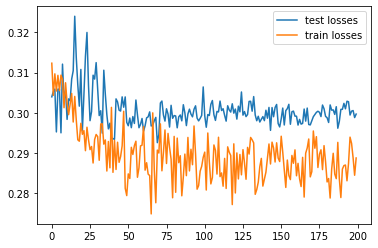

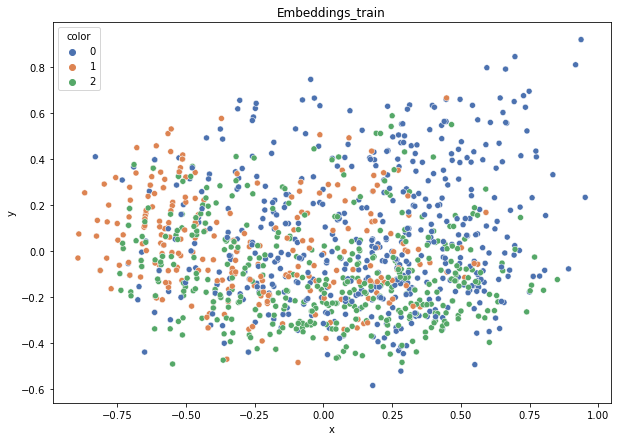

DT-f1-new-features: 0.432
DT-f1-old+new-features: 0.456
DT-f1-old-features: 0.462
DT-gmean-new-features: 0.438
DT-gmean-old+new-features: 0.444
DT-gmean-old-features: 0.46
KNN-f1-new-features: 0.46
KNN-f1-old+new-features: 0.448
KNN-f1-old-features: 0.464
KNN-gmean-new-features: 0.445
KNN-gmean-old+new-features: 0.44
KNN-gmean-old-features: 0.461
RF24-f1-new-features: 0.494
RF24-f1-old+new-features: 0.502
RF24-f1-old-features: 0.52
RF24-gmean-new-features: 0.472
RF24-gmean-old+new-features: 0.484
RF24-gmean-old-features: 0.513


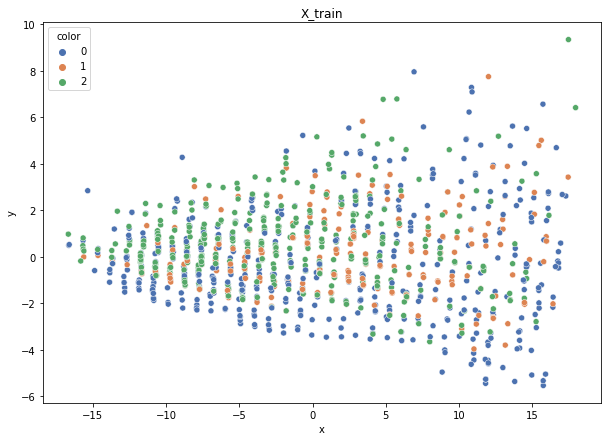

Class cardinalities: Counter({0: 503, 2: 409, 1: 267})
Weights: {0: 0.24308874498865835, 1: 0.4579537031059744, 2: 0.29895755190536716}


100%|██████████| 294/294 [00:00<00:00, 3287.26it/s]


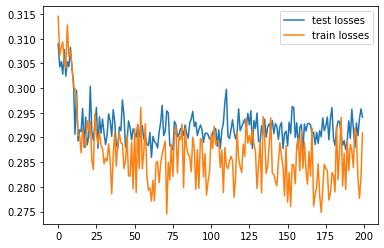

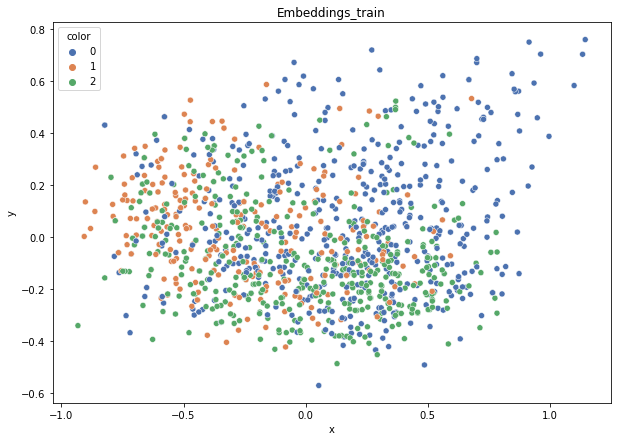

DT-f1-new-features: 0.397
DT-f1-old+new-features: 0.439
DT-f1-old-features: 0.444
DT-gmean-new-features: 0.399
DT-gmean-old+new-features: 0.42
DT-gmean-old-features: 0.442
KNN-f1-new-features: 0.389
KNN-f1-old+new-features: 0.417
KNN-f1-old-features: 0.415
KNN-gmean-new-features: 0.367
KNN-gmean-old+new-features: 0.401
KNN-gmean-old-features: 0.397
RF24-f1-new-features: 0.47
RF24-f1-old+new-features: 0.515
RF24-f1-old-features: 0.506
RF24-gmean-new-features: 0.449
RF24-gmean-old+new-features: 0.493
RF24-gmean-old-features: 0.494


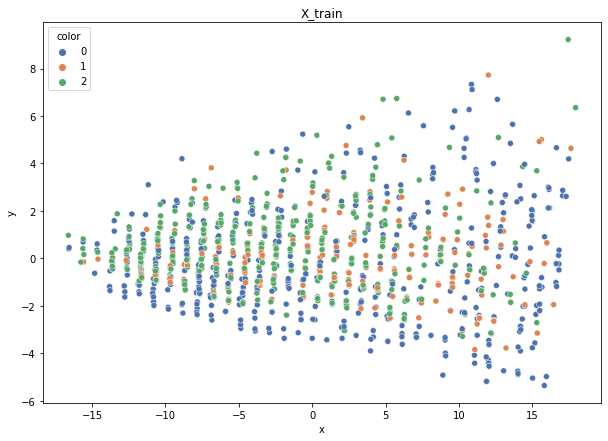

Class cardinalities: Counter({0: 504, 2: 409, 1: 266})
Weights: {0: 0.24230613326681422, 1: 0.4591063577687006, 2: 0.29858750896448505}


100%|██████████| 294/294 [00:00<00:00, 3482.59it/s]


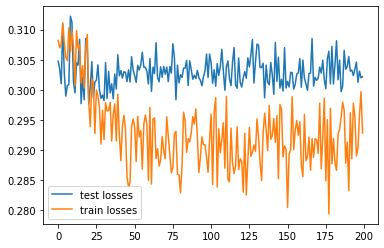

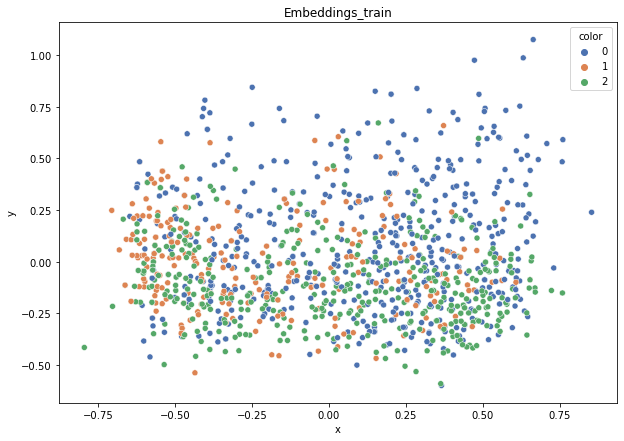

DT-f1-new-features: 0.391
DT-f1-old+new-features: 0.464
DT-f1-old-features: 0.473
DT-gmean-new-features: 0.391
DT-gmean-old+new-features: 0.462
DT-gmean-old-features: 0.483
KNN-f1-new-features: 0.425
KNN-f1-old+new-features: 0.437
KNN-f1-old-features: 0.453
KNN-gmean-new-features: 0.41
KNN-gmean-old+new-features: 0.421
KNN-gmean-old-features: 0.444
RF24-f1-new-features: 0.496
RF24-f1-old+new-features: 0.55
RF24-f1-old-features: 0.522
RF24-gmean-new-features: 0.481
RF24-gmean-old+new-features: 0.547
RF24-gmean-old-features: 0.525
dermatology


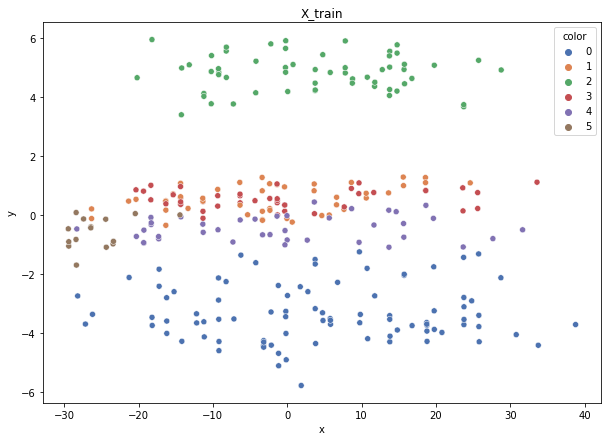

Class cardinalities: Counter({0: 90, 2: 58, 1: 48, 4: 41, 3: 39, 5: 16})
Weights: {1: 0.1288257963857323, 0: 0.0687070914057239, 2: 0.10661445218129569, 4: 0.15082044454915, 3: 0.1585548263209013, 5: 0.38647738915719687}


100%|██████████| 74/74 [00:00<00:00, 3346.36it/s]


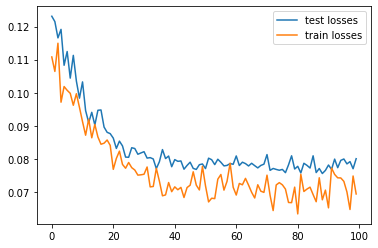

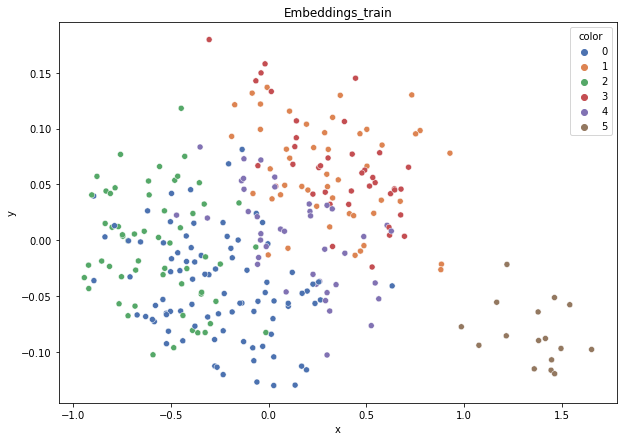

DT-f1-new-features: 0.572
DT-f1-old+new-features: 0.933
DT-f1-old-features: 0.914
DT-gmean-new-features: 0.551
DT-gmean-old+new-features: 0.933
DT-gmean-old-features: 0.911
KNN-f1-new-features: 0.568
KNN-f1-old+new-features: 0.873
KNN-f1-old-features: 0.871
KNN-gmean-new-features: 0.514
KNN-gmean-old+new-features: 0.859
KNN-gmean-old-features: 0.857
RF24-f1-new-features: 0.627
RF24-f1-old+new-features: 0.959
RF24-f1-old-features: 0.959
RF24-gmean-new-features: 0.589
RF24-gmean-old+new-features: 0.957
RF24-gmean-old-features: 0.957


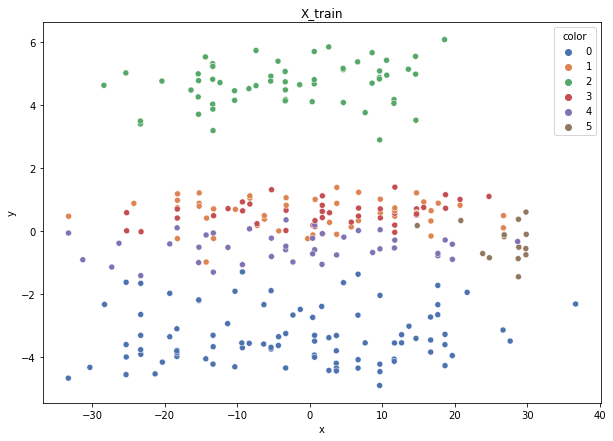

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 41, 3: 40, 5: 16})
Weights: {1: 0.1269355878601628, 2: 0.10723868629565478, 0: 0.06988588545110087, 4: 0.1517035074426336, 3: 0.15549609512869944, 5: 0.3887402378217486}


100%|██████████| 73/73 [00:00<00:00, 3031.26it/s]


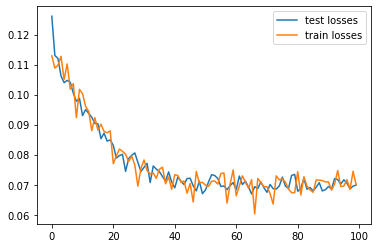

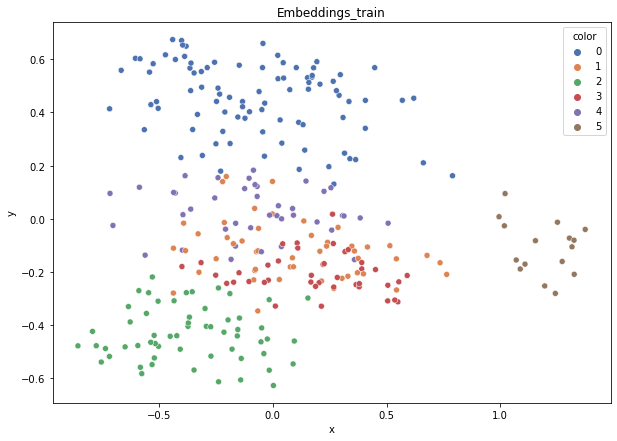

DT-f1-new-features: 0.707
DT-f1-old+new-features: 0.955
DT-f1-old-features: 0.955
DT-gmean-new-features: 0.649
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.955
KNN-f1-new-features: 0.74
KNN-f1-old+new-features: 0.86
KNN-f1-old-features: 0.86
KNN-gmean-new-features: 0.7
KNN-gmean-old+new-features: 0.841
KNN-gmean-old-features: 0.841
RF24-f1-new-features: 0.774
RF24-f1-old+new-features: 0.984
RF24-f1-old-features: 0.984
RF24-gmean-new-features: 0.738
RF24-gmean-old+new-features: 0.986
RF24-gmean-old-features: 0.986


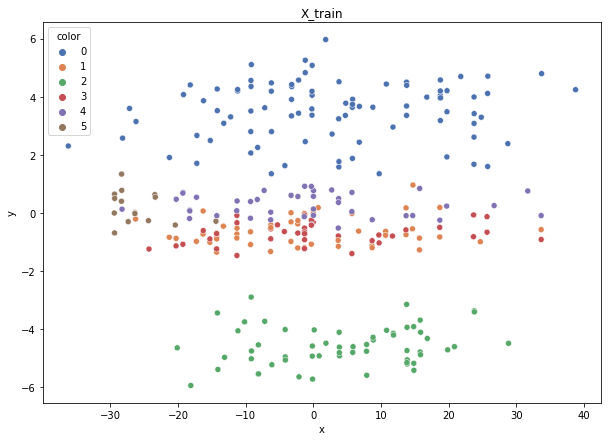

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {0: 0.06985968170695418, 2: 0.10719847710205038, 4: 0.14803599218854577, 3: 0.15942337620304928, 1: 0.1268879933044678, 5: 0.38859447949493264}


100%|██████████| 73/73 [00:00<00:00, 3304.31it/s]


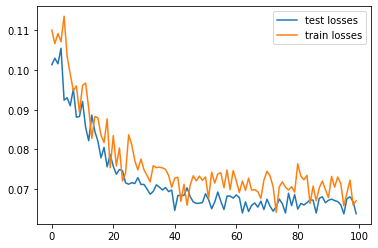

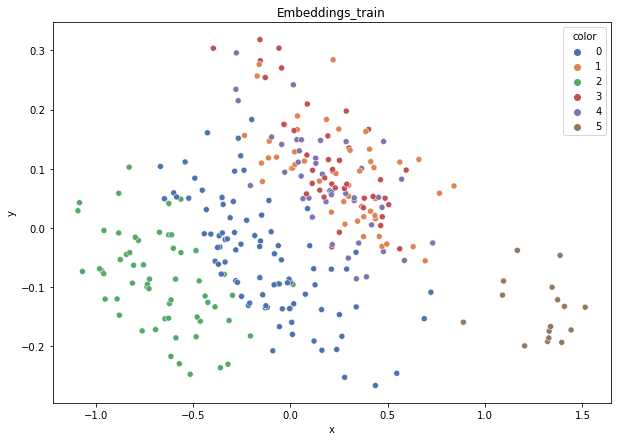

DT-f1-new-features: 0.569
DT-f1-old+new-features: 0.933
DT-f1-old-features: 0.945
DT-gmean-new-features: 0.452
DT-gmean-old+new-features: 0.937
DT-gmean-old-features: 0.953
KNN-f1-new-features: 0.605
KNN-f1-old+new-features: 0.902
KNN-f1-old-features: 0.898
KNN-gmean-new-features: 0.552
KNN-gmean-old+new-features: 0.891
KNN-gmean-old-features: 0.878
RF24-f1-new-features: 0.634
RF24-f1-old+new-features: 0.935
RF24-f1-old-features: 0.909
RF24-gmean-new-features: 0.597
RF24-gmean-old+new-features: 0.918
RF24-gmean-old-features: 0.905


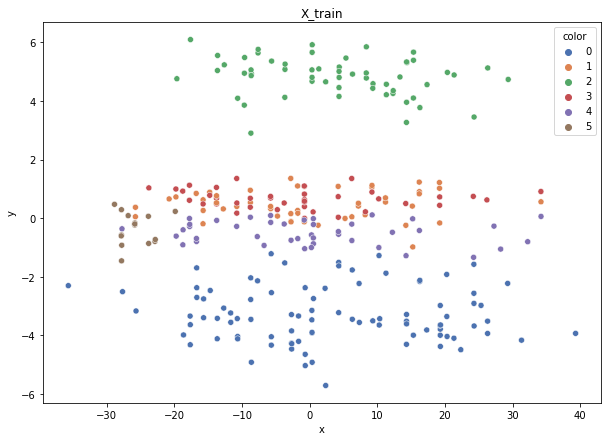

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 4: 0.14787267327537115, 3: 0.15924749429655355, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 3349.61it/s]


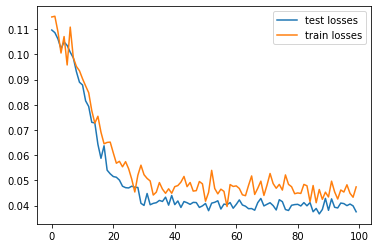

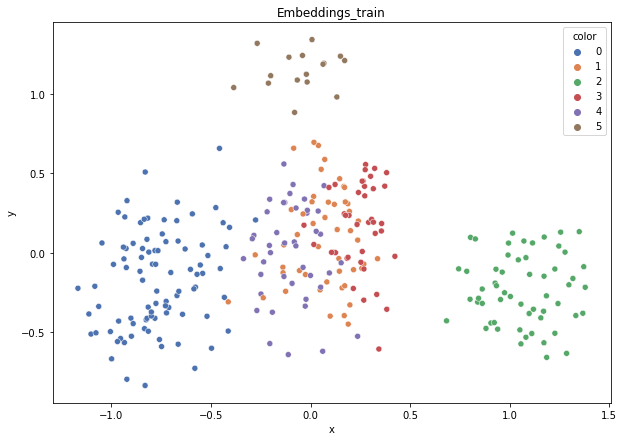

DT-f1-new-features: 0.711
DT-f1-old+new-features: 0.942
DT-f1-old-features: 0.946
DT-gmean-new-features: 0.637
DT-gmean-old+new-features: 0.939
DT-gmean-old-features: 0.945
KNN-f1-new-features: 0.717
KNN-f1-old+new-features: 0.872
KNN-f1-old-features: 0.871
KNN-gmean-new-features: 0.649
KNN-gmean-old+new-features: 0.865
KNN-gmean-old-features: 0.865
RF24-f1-new-features: 0.745
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.699
RF24-gmean-old+new-features: 0.963
RF24-gmean-old-features: 0.963


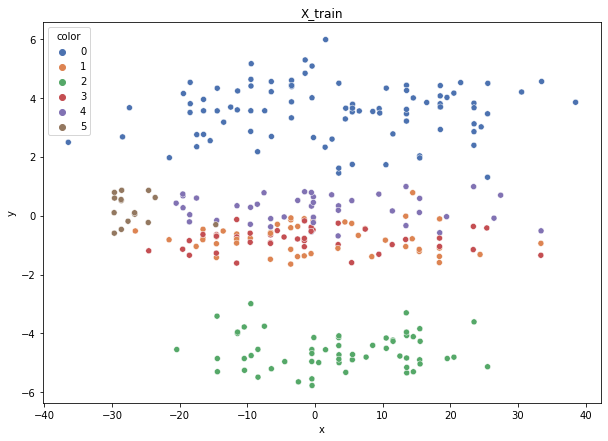

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 3: 0.15924749429655355, 4: 0.14787267327537115, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 3058.60it/s]


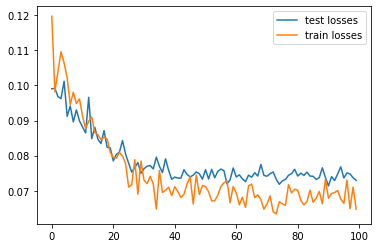

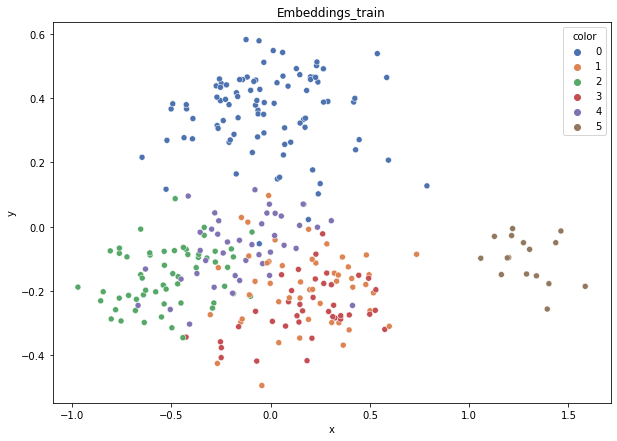

DT-f1-new-features: 0.6
DT-f1-old+new-features: 0.888
DT-f1-old-features: 0.989
DT-gmean-new-features: 0.545
DT-gmean-old+new-features: 0.862
DT-gmean-old-features: 0.992
KNN-f1-new-features: 0.606
KNN-f1-old+new-features: 0.847
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.548
KNN-gmean-old+new-features: 0.852
KNN-gmean-old-features: 0.881
RF24-f1-new-features: 0.63
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 1.0
RF24-gmean-new-features: 0.588
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 1.0
hayes-roth


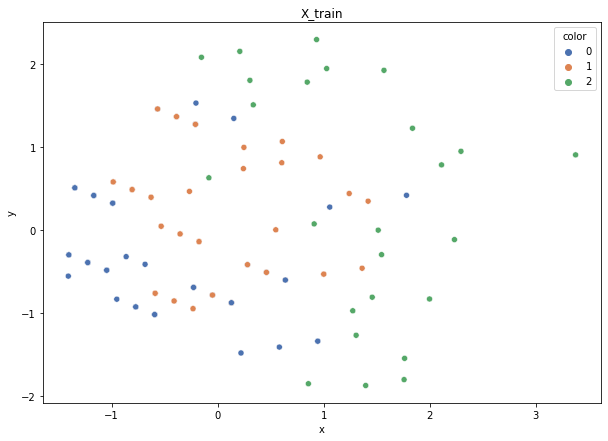

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 3374.93it/s]


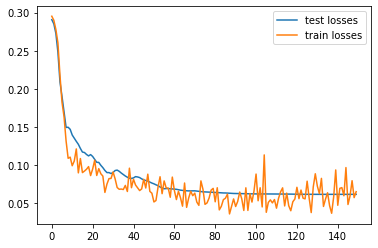

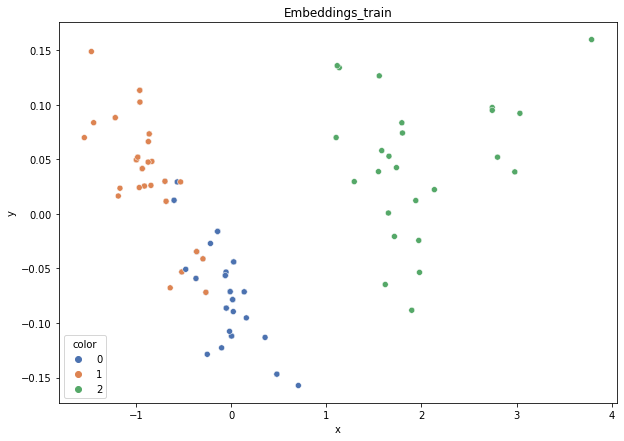

DT-f1-new-features: 0.867
DT-f1-old+new-features: 0.867
DT-f1-old-features: 0.842
DT-gmean-new-features: 0.851
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.828
KNN-f1-new-features: 0.845
KNN-f1-old+new-features: 0.845
KNN-f1-old-features: 0.668
KNN-gmean-new-features: 0.837
KNN-gmean-old+new-features: 0.837
KNN-gmean-old-features: 0.601
RF24-f1-new-features: 0.872
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.838
RF24-gmean-new-features: 0.867
RF24-gmean-old+new-features: 0.892
RF24-gmean-old-features: 0.814


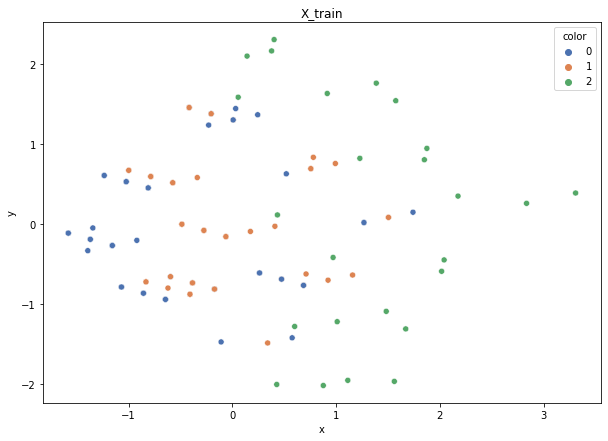

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 3259.85it/s]


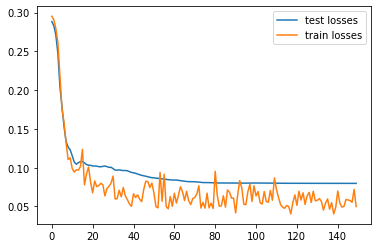

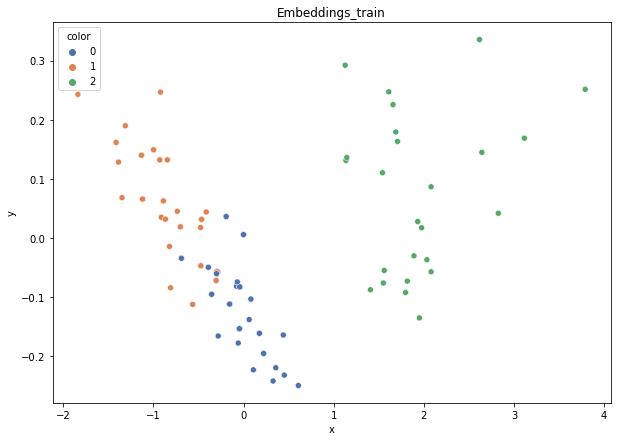

DT-f1-new-features: 0.897
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.872
DT-gmean-new-features: 0.895
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.867
KNN-f1-new-features: 0.948
KNN-f1-old+new-features: 0.831
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.946
KNN-gmean-old+new-features: 0.816
KNN-gmean-old-features: 0.643
RF24-f1-new-features: 0.845
RF24-f1-old+new-features: 0.872
RF24-f1-old-features: 0.846
RF24-gmean-new-features: 0.837
RF24-gmean-old+new-features: 0.867
RF24-gmean-old-features: 0.84


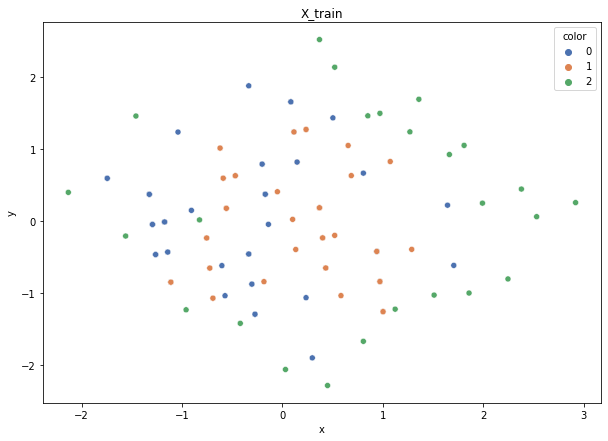

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 3366.38it/s]


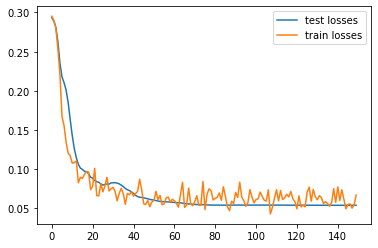

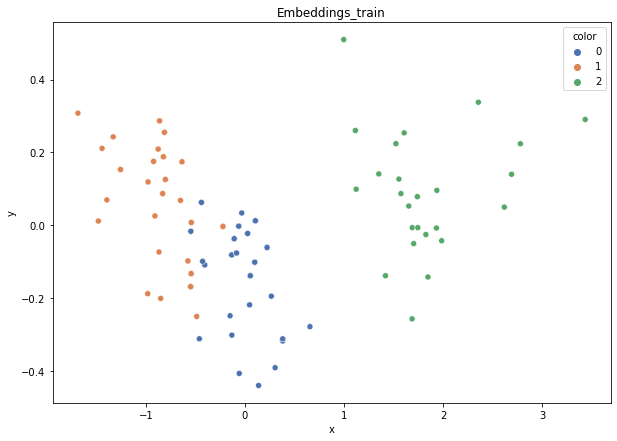

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.923
DT-gmean-new-features: 0.921
DT-gmean-old+new-features: 0.921
DT-gmean-old-features: 0.921
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.948
KNN-f1-old-features: 0.858
KNN-gmean-new-features: 0.921
KNN-gmean-old+new-features: 0.946
KNN-gmean-old-features: 0.826
RF24-f1-new-features: 0.948
RF24-f1-old+new-features: 0.948
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.946
RF24-gmean-old+new-features: 0.946
RF24-gmean-old-features: 0.921


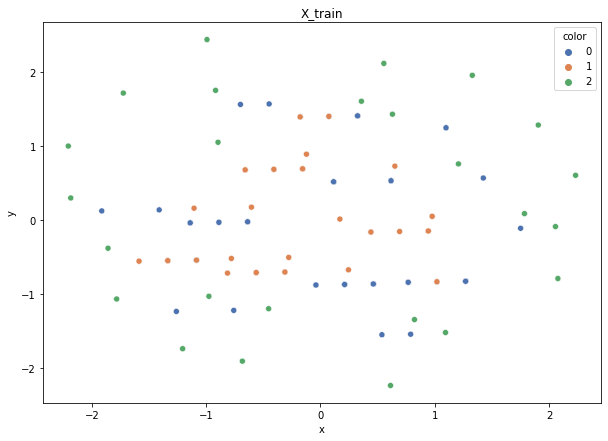

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {1: 0.24870862827625786, 2: 0.507365601683566, 0: 0.243925770040176}


100%|██████████| 32/32 [00:00<00:00, 2386.56it/s]


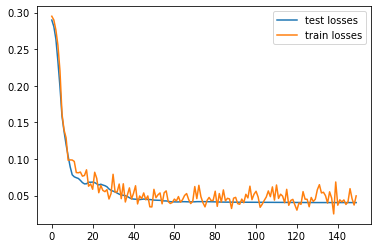

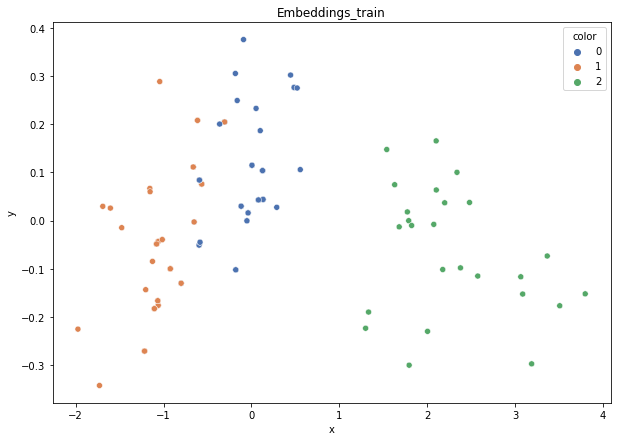

DT-f1-new-features: 0.761
DT-f1-old+new-features: 0.765
DT-f1-old-features: 0.897
DT-gmean-new-features: 0.733
DT-gmean-old+new-features: 0.763
DT-gmean-old-features: 0.892
KNN-f1-new-features: 0.857
KNN-f1-old+new-features: 0.872
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.842
KNN-gmean-old+new-features: 0.867
KNN-gmean-old-features: 0.757
RF24-f1-new-features: 0.806
RF24-f1-old+new-features: 0.806
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.79
RF24-gmean-old+new-features: 0.79
RF24-gmean-old-features: 0.921


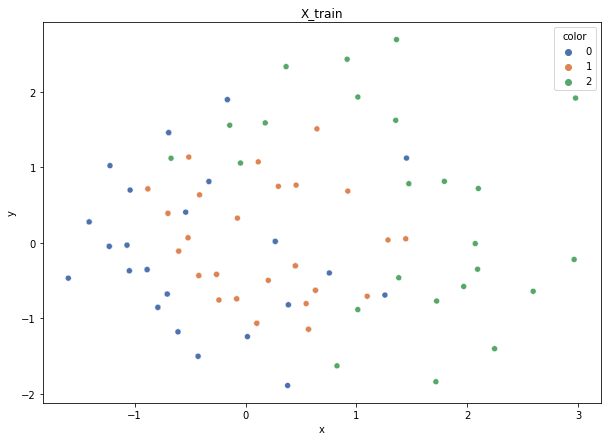

Class cardinalities: Counter({0: 52, 1: 52, 2: 24})
Weights: {0: 0.24000000000000005, 2: 0.52, 1: 0.24000000000000005}


100%|██████████| 32/32 [00:00<00:00, 3286.83it/s]


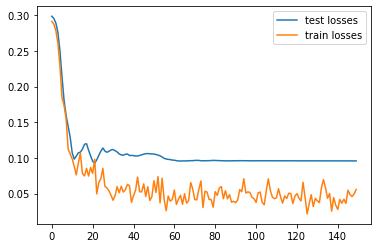

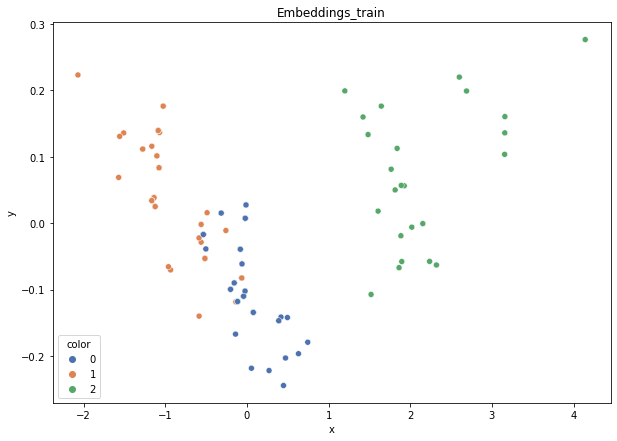

DT-f1-new-features: 0.752
DT-f1-old+new-features: 0.74
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.734
DT-gmean-old+new-features: 0.716
DT-gmean-old-features: 0.684
KNN-f1-new-features: 0.74
KNN-f1-old+new-features: 0.778
KNN-f1-old-features: 0.535
KNN-gmean-new-features: 0.718
KNN-gmean-old+new-features: 0.763
KNN-gmean-old-features: 0.487
RF24-f1-new-features: 0.761
RF24-f1-old+new-features: 0.774
RF24-f1-old-features: 0.733
RF24-gmean-new-features: 0.727
RF24-gmean-old+new-features: 0.751
RF24-gmean-old-features: 0.711
new_vehicle


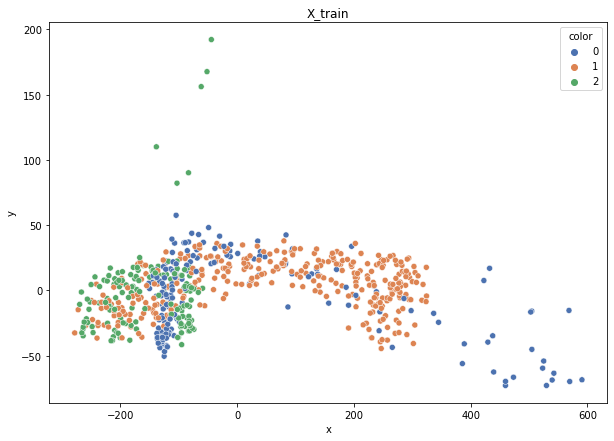

Class cardinalities: Counter({1: 343, 0: 174, 2: 159})
Weights: {2: 0.42063643091235864, 1: 0.19498889946083095, 0: 0.38437466962681044}


100%|██████████| 170/170 [00:00<00:00, 3207.62it/s]


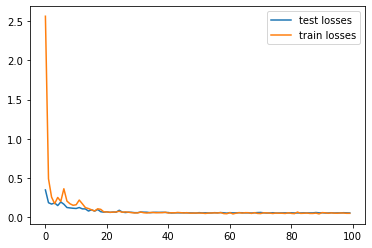

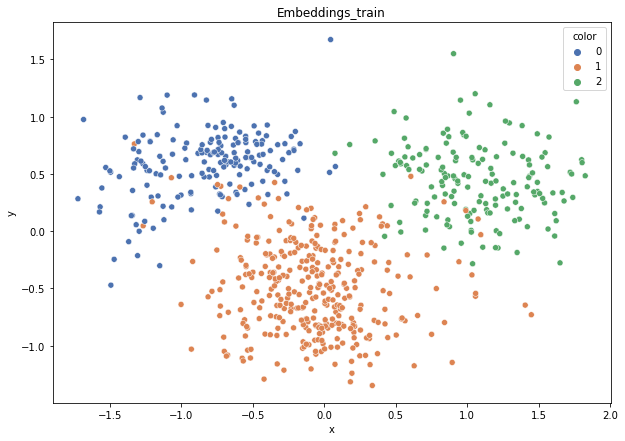

DT-f1-new-features: 0.883
DT-f1-old+new-features: 0.884
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.89
DT-gmean-old+new-features: 0.886
DT-gmean-old-features: 0.908
KNN-f1-new-features: 0.907
KNN-f1-old+new-features: 0.858
KNN-f1-old-features: 0.858
KNN-gmean-new-features: 0.905
KNN-gmean-old+new-features: 0.861
KNN-gmean-old-features: 0.861
RF24-f1-new-features: 0.902
RF24-f1-old+new-features: 0.916
RF24-f1-old-features: 0.922
RF24-gmean-new-features: 0.903
RF24-gmean-old+new-features: 0.916
RF24-gmean-old-features: 0.932


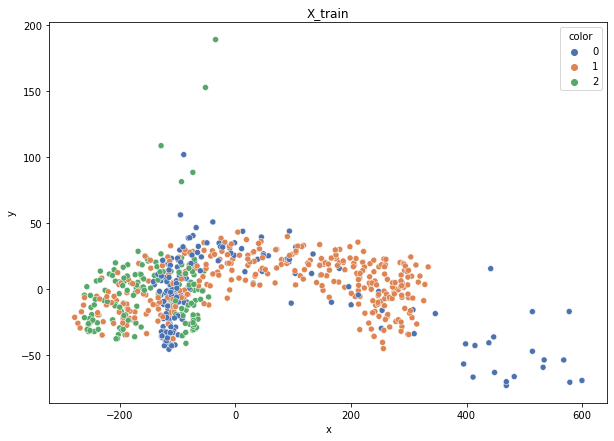

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 3175.34it/s]


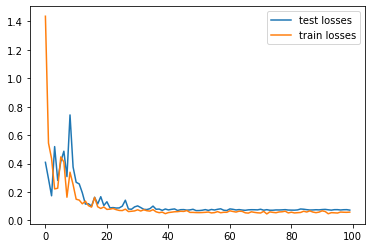

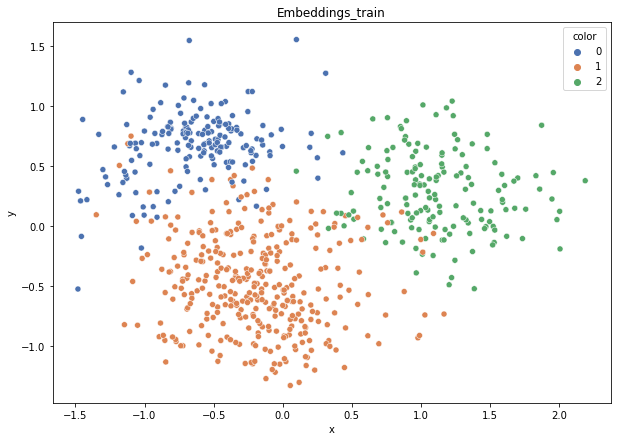

DT-f1-new-features: 0.927
DT-f1-old+new-features: 0.932
DT-f1-old-features: 0.906
DT-gmean-new-features: 0.937
DT-gmean-old+new-features: 0.948
DT-gmean-old-features: 0.904
KNN-f1-new-features: 0.939
KNN-f1-old+new-features: 0.859
KNN-f1-old-features: 0.859
KNN-gmean-new-features: 0.944
KNN-gmean-old+new-features: 0.861
KNN-gmean-old-features: 0.861
RF24-f1-new-features: 0.945
RF24-f1-old+new-features: 0.958
RF24-f1-old-features: 0.964
RF24-gmean-new-features: 0.952
RF24-gmean-old+new-features: 0.968
RF24-gmean-old-features: 0.972


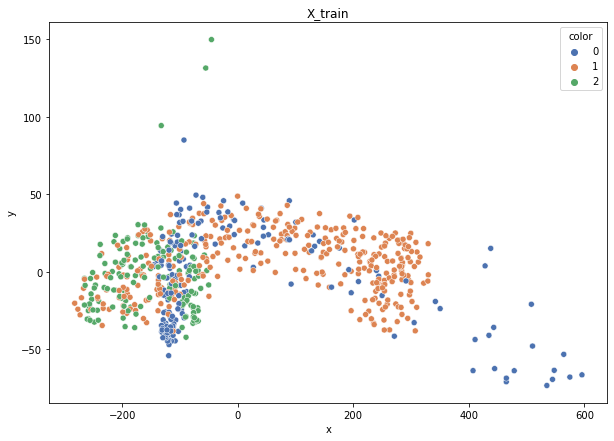

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 3217.02it/s]


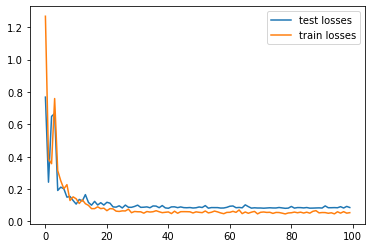

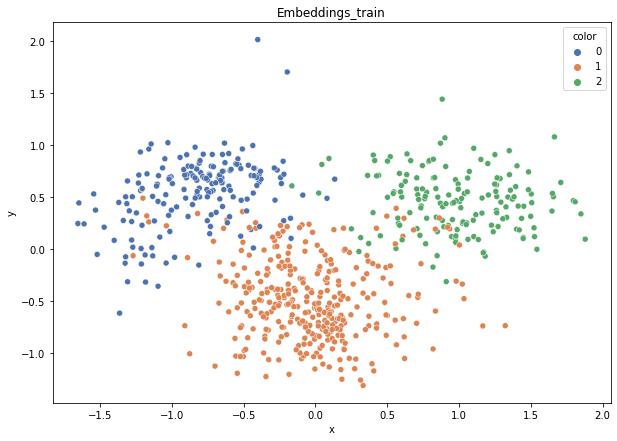

DT-f1-new-features: 0.929
DT-f1-old+new-features: 0.929
DT-f1-old-features: 0.89
DT-gmean-new-features: 0.937
DT-gmean-old+new-features: 0.933
DT-gmean-old-features: 0.895
KNN-f1-new-features: 0.92
KNN-f1-old+new-features: 0.864
KNN-f1-old-features: 0.864
KNN-gmean-new-features: 0.915
KNN-gmean-old+new-features: 0.874
KNN-gmean-old-features: 0.874
RF24-f1-new-features: 0.965
RF24-f1-old+new-features: 0.982
RF24-f1-old-features: 0.952
RF24-gmean-new-features: 0.968
RF24-gmean-old+new-features: 0.988
RF24-gmean-old-features: 0.955


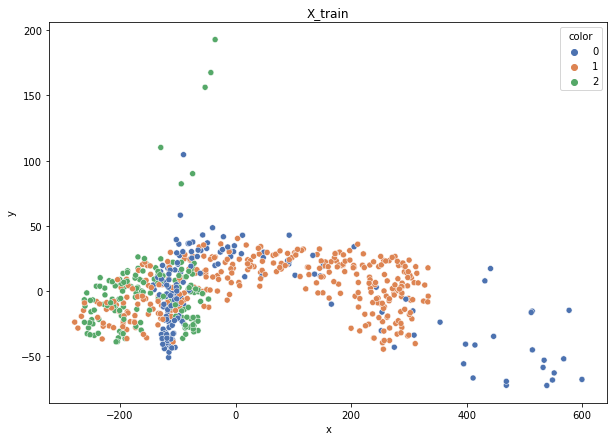

Class cardinalities: Counter({1: 344, 0: 174, 2: 159})
Weights: {2: 0.42087499472640594, 0: 0.3845926675948192, 1: 0.19453233767877484}


100%|██████████| 169/169 [00:00<00:00, 3283.45it/s]


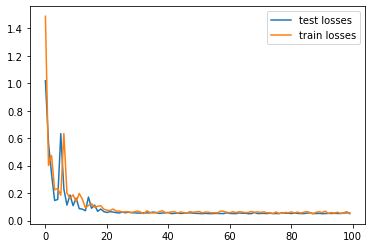

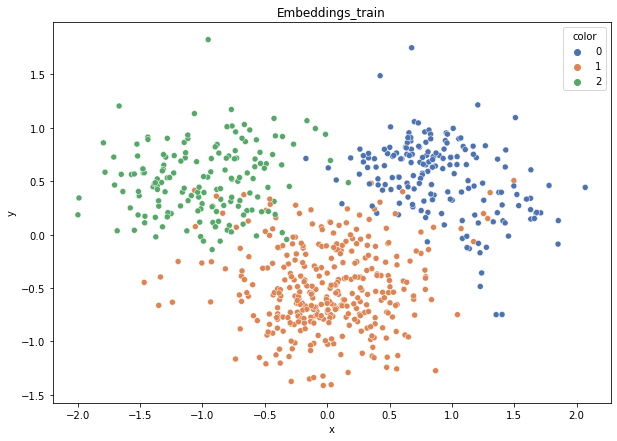

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.953
DT-f1-old-features: 0.915
DT-gmean-new-features: 0.922
DT-gmean-old+new-features: 0.96
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.97
KNN-f1-old+new-features: 0.879
KNN-f1-old-features: 0.879
KNN-gmean-new-features: 0.972
KNN-gmean-old+new-features: 0.877
KNN-gmean-old-features: 0.877
RF24-f1-new-features: 0.965
RF24-f1-old+new-features: 0.97
RF24-f1-old-features: 0.976
RF24-gmean-new-features: 0.973
RF24-gmean-old+new-features: 0.977
RF24-gmean-old-features: 0.977


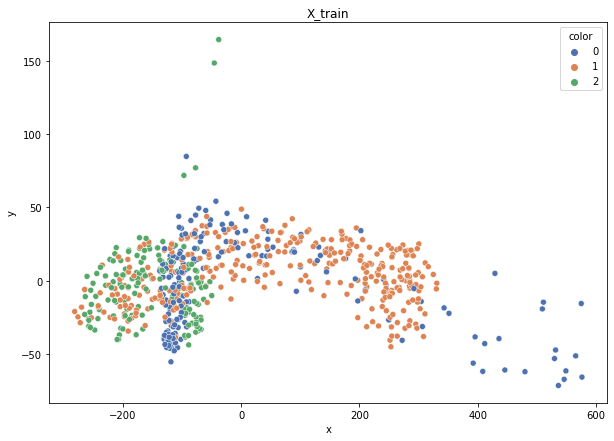

Class cardinalities: Counter({1: 343, 0: 174, 2: 160})
Weights: {2: 0.4191092821730032, 1: 0.19550287215067205, 0: 0.3853878456763248}


100%|██████████| 169/169 [00:00<00:00, 3298.61it/s]


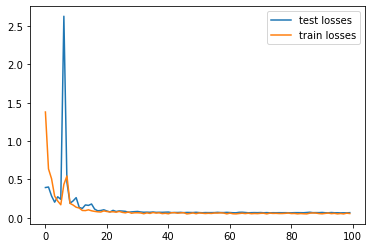

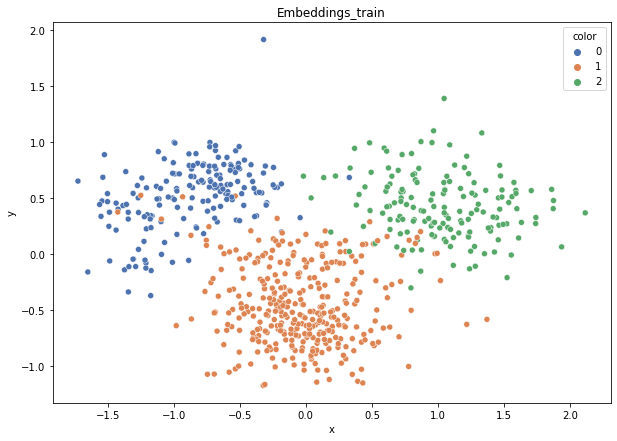

DT-f1-new-features: 0.931
DT-f1-old+new-features: 0.947
DT-f1-old-features: 0.877
DT-gmean-new-features: 0.932
DT-gmean-old+new-features: 0.953
DT-gmean-old-features: 0.87
KNN-f1-new-features: 0.932
KNN-f1-old+new-features: 0.91
KNN-f1-old-features: 0.91
KNN-gmean-new-features: 0.937
KNN-gmean-old+new-features: 0.913
KNN-gmean-old-features: 0.913
RF24-f1-new-features: 0.936
RF24-f1-old+new-features: 0.977
RF24-f1-old-features: 0.98
RF24-gmean-new-features: 0.941
RF24-gmean-old+new-features: 0.972
RF24-gmean-old-features: 0.981
new_yeast


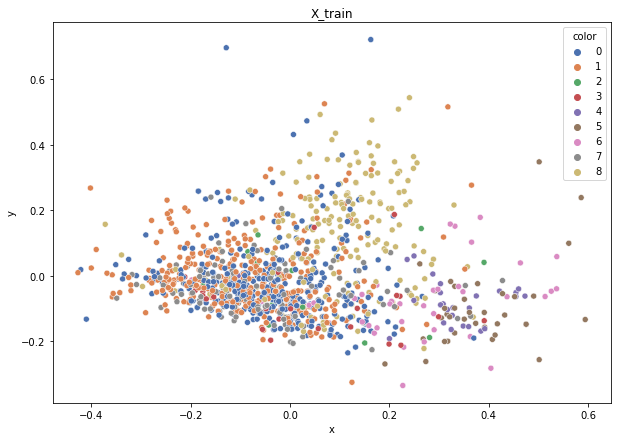

Class cardinalities: Counter({0: 370, 1: 343, 8: 195, 7: 135, 6: 40, 5: 36, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024325906642526016, 0: 0.012820410257547495, 1: 0.013829597070823827, 5: 0.1317653276470159, 4: 0.16941256411759187, 6: 0.11858879488231433, 3: 0.19764799147052386, 7: 0.03513742070587091, 2: 0.2964719872057858}


100%|██████████| 297/297 [00:00<00:00, 3399.37it/s]


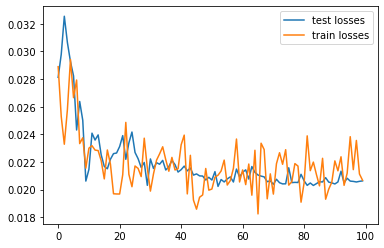

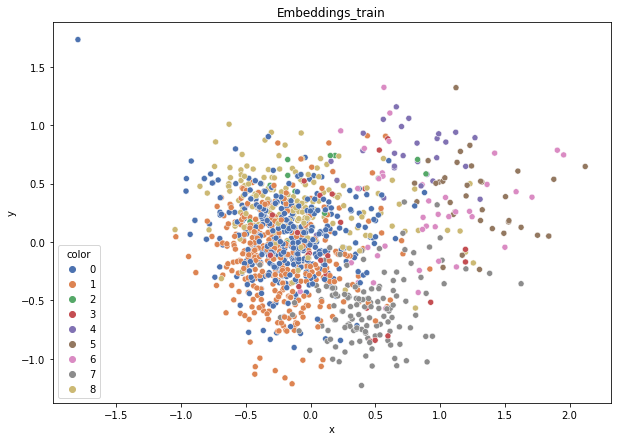

DT-f1-new-features: 0.447
DT-f1-old+new-features: 0.421
DT-f1-old-features: 0.495
DT-gmean-new-features: 0.423
DT-gmean-old+new-features: 0.421
DT-gmean-old-features: 0.272
KNN-f1-new-features: 0.405
KNN-f1-old+new-features: 0.485
KNN-f1-old-features: 0.511
KNN-gmean-new-features: 0.225
KNN-gmean-old+new-features: 0.263
KNN-gmean-old-features: 0.284
RF24-f1-new-features: 0.475
RF24-f1-old+new-features: 0.546
RF24-f1-old-features: 0.566
RF24-gmean-new-features: 0.244
RF24-gmean-old+new-features: 0.301
RF24-gmean-old-features: 0.313


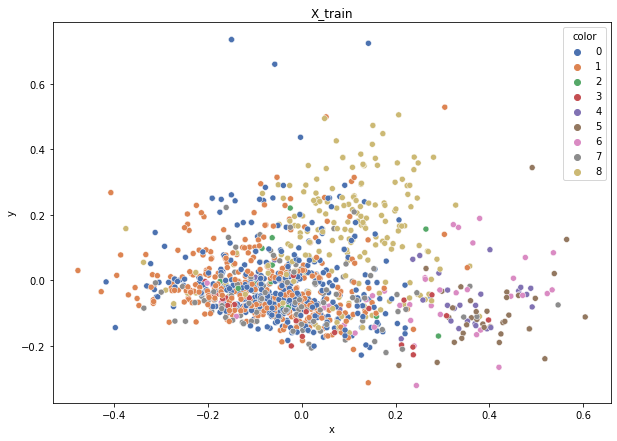

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {1: 0.013814401543936261, 8: 0.02429917810035968, 0: 0.012771805200997676, 5: 0.13538113513057534, 6: 0.11556926169683263, 7: 0.035360744250523414, 3: 0.1974308220654224, 4: 0.16922641891321918, 2: 0.2961462330981336}


100%|██████████| 297/297 [00:00<00:00, 3207.25it/s]


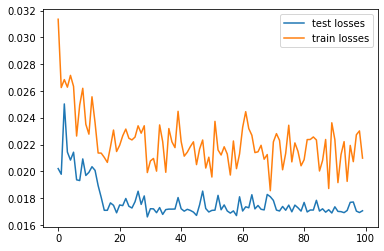

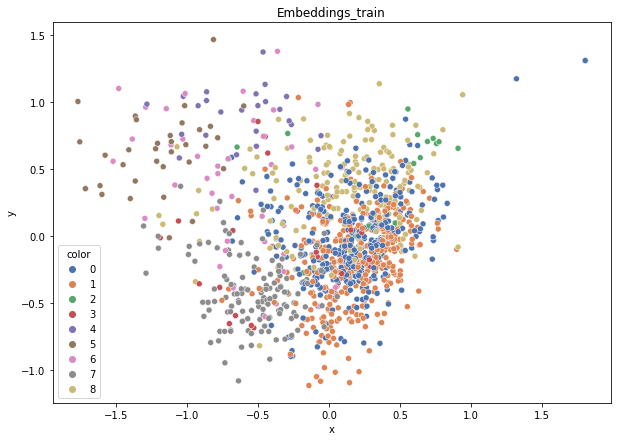

DT-f1-new-features: 0.418
DT-f1-old+new-features: 0.45
DT-f1-old-features: 0.453
DT-gmean-new-features: 0.416
DT-gmean-old+new-features: 0.255
DT-gmean-old-features: 0.26
KNN-f1-new-features: 0.447
KNN-f1-old+new-features: 0.53
KNN-f1-old-features: 0.546
KNN-gmean-new-features: 0.431
KNN-gmean-old+new-features: 0.286
KNN-gmean-old-features: 0.29
RF24-f1-new-features: 0.454
RF24-f1-old+new-features: 0.616
RF24-f1-old-features: 0.611
RF24-gmean-new-features: 0.254
RF24-gmean-old+new-features: 0.334
RF24-gmean-old-features: 0.331


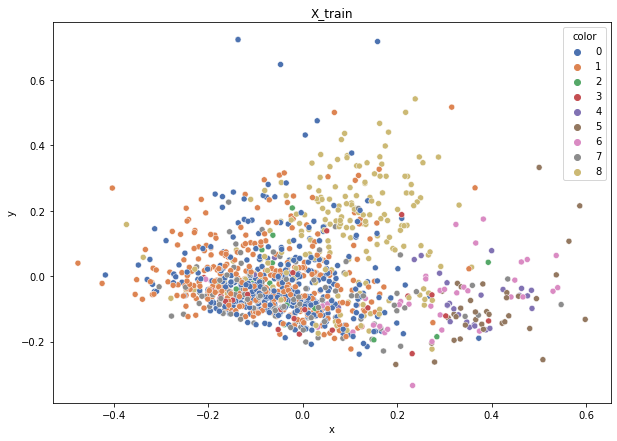

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299178100359677, 1: 0.01381440154393626, 0: 0.012771805200997674, 5: 0.13538113513057534, 4: 0.16922641891321916, 6: 0.11556926169683261, 7: 0.03536074425052341, 3: 0.19743082206542237, 2: 0.29614623309813354}


100%|██████████| 297/297 [00:00<00:00, 3465.88it/s]


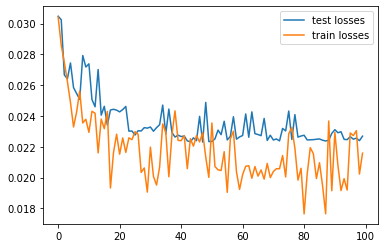

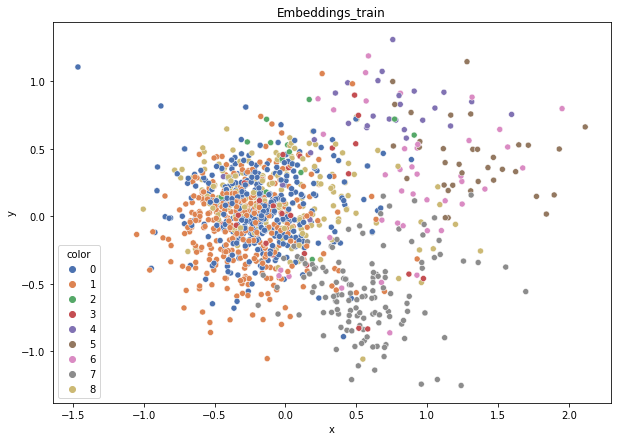

DT-f1-new-features: 0.348
DT-f1-old+new-features: 0.426
DT-f1-old-features: 0.408
DT-gmean-new-features: 0.21
DT-gmean-old+new-features: 0.42
DT-gmean-old-features: 0.408
KNN-f1-new-features: 0.364
KNN-f1-old+new-features: 0.474
KNN-f1-old-features: 0.447
KNN-gmean-new-features: 0.212
KNN-gmean-old+new-features: 0.264
KNN-gmean-old-features: 0.25
RF24-f1-new-features: 0.429
RF24-f1-old+new-features: 0.498
RF24-f1-old-features: 0.544
RF24-gmean-new-features: 0.239
RF24-gmean-old+new-features: 0.261
RF24-gmean-old-features: 0.477


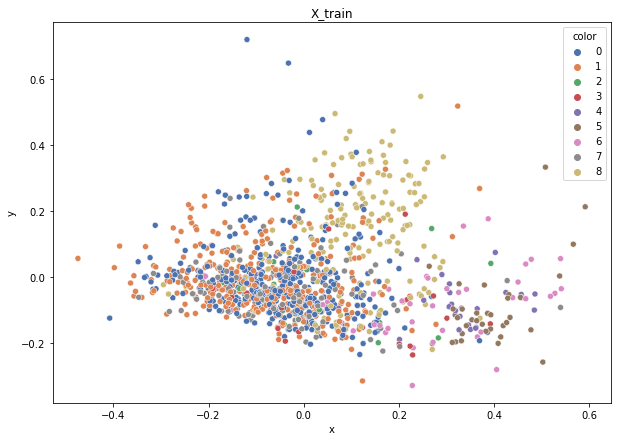

Class cardinalities: Counter({0: 370, 1: 344, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299315142460837, 1: 0.013774321083662392, 0: 0.012806395818323955, 5: 0.13538189865085323, 4: 0.16922737331356652, 6: 0.11556991348243568, 7: 0.03536094367746166, 3: 0.1974319355324943, 2: 0.29614790329874147}


100%|██████████| 297/297 [00:00<00:00, 3256.16it/s]


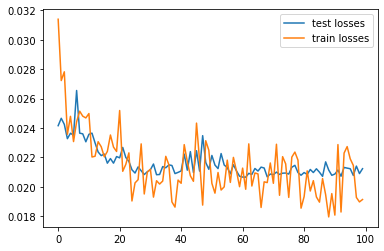

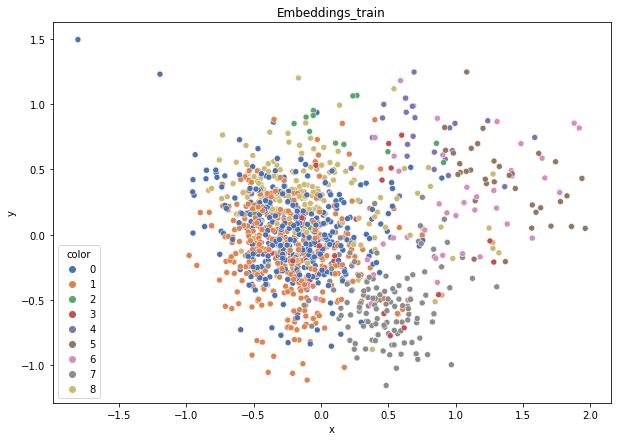

DT-f1-new-features: 0.458
DT-f1-old+new-features: 0.441
DT-f1-old-features: 0.439
DT-gmean-new-features: 0.258
DT-gmean-old+new-features: 0.254
DT-gmean-old-features: 0.248
KNN-f1-new-features: 0.432
KNN-f1-old+new-features: 0.471
KNN-f1-old-features: 0.464
KNN-gmean-new-features: 0.369
KNN-gmean-old+new-features: 0.425
KNN-gmean-old-features: 0.41
RF24-f1-new-features: 0.519
RF24-f1-old+new-features: 0.528
RF24-f1-old-features: 0.531
RF24-gmean-new-features: 0.274
RF24-gmean-old+new-features: 0.274
RF24-gmean-old-features: 0.277


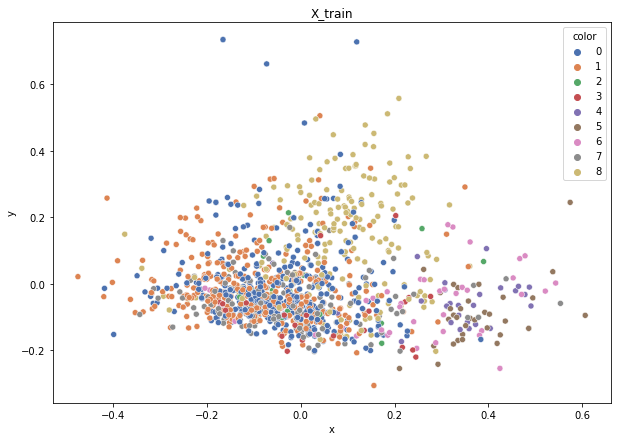

Class cardinalities: Counter({0: 370, 1: 343, 8: 196, 7: 135, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.02418370057482606, 1: 0.013819257471329179, 0: 0.012810825169367322, 5: 0.13542872321902596, 4: 0.16928590402378244, 6: 0.11560988567477826, 7: 0.035111150464191915, 3: 0.1975002213610795, 2: 0.29625033204161927}


100%|██████████| 296/296 [00:00<00:00, 3505.32it/s]


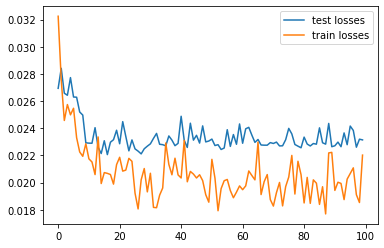

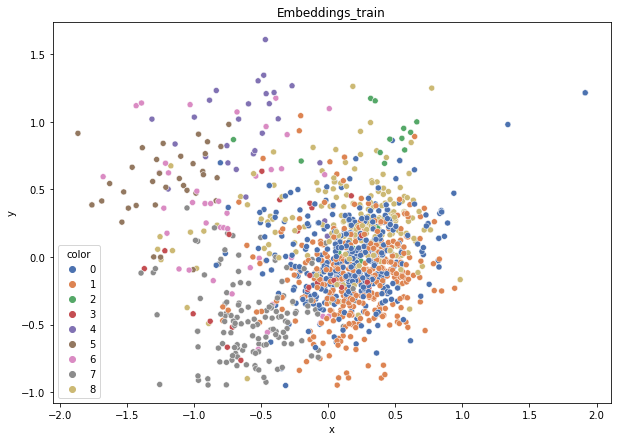

DT-f1-new-features: 0.363
DT-f1-old+new-features: 0.413
DT-f1-old-features: 0.425
DT-gmean-new-features: 0.213
DT-gmean-old+new-features: 0.231
DT-gmean-old-features: 0.237
KNN-f1-new-features: 0.347
KNN-f1-old+new-features: 0.379
KNN-f1-old-features: 0.49
KNN-gmean-new-features: 0.327
KNN-gmean-old+new-features: 0.325
KNN-gmean-old-features: 0.432
RF24-f1-new-features: 0.429
RF24-f1-old+new-features: 0.541
RF24-f1-old-features: 0.561
RF24-gmean-new-features: 0.226
RF24-gmean-old+new-features: 0.285
RF24-gmean-old-features: 0.293
1czysty-cut


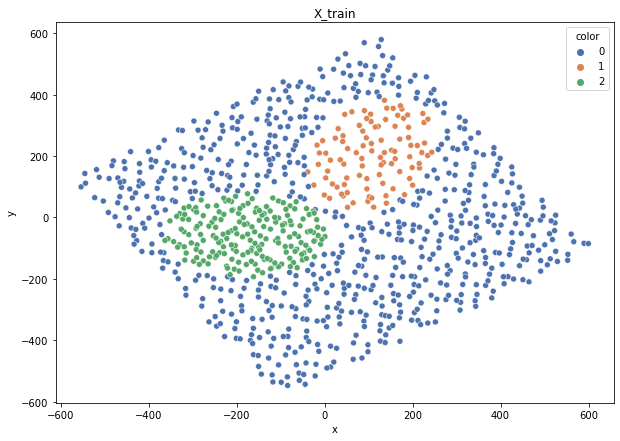

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3336.72it/s]


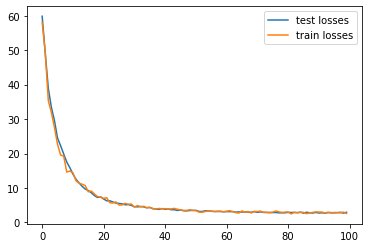

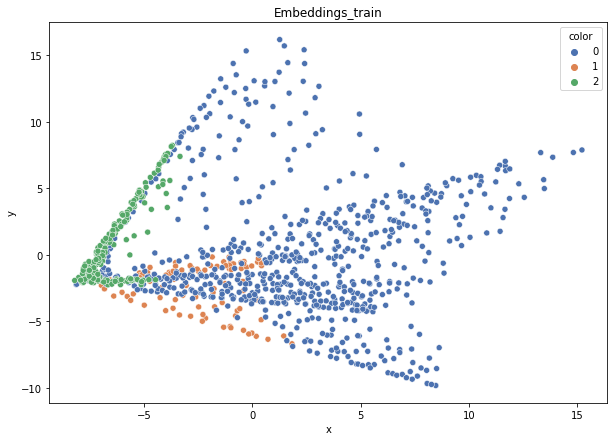

DT-f1-new-features: 0.9
DT-f1-old+new-features: 0.914
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.911
DT-gmean-old+new-features: 0.905
DT-gmean-old-features: 0.889
KNN-f1-new-features: 0.946
KNN-f1-old+new-features: 0.937
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.96
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
RF24-f1-new-features: 0.921
RF24-f1-old+new-features: 0.924
RF24-f1-old-features: 0.934
RF24-gmean-new-features: 0.93
RF24-gmean-old+new-features: 0.914
RF24-gmean-old-features: 0.939


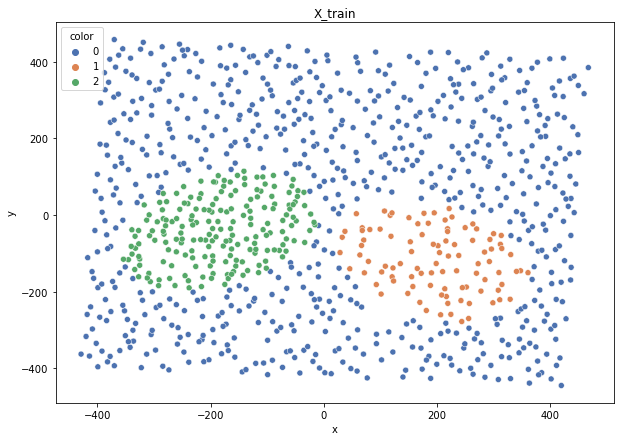

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3476.90it/s]


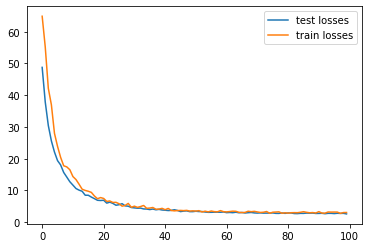

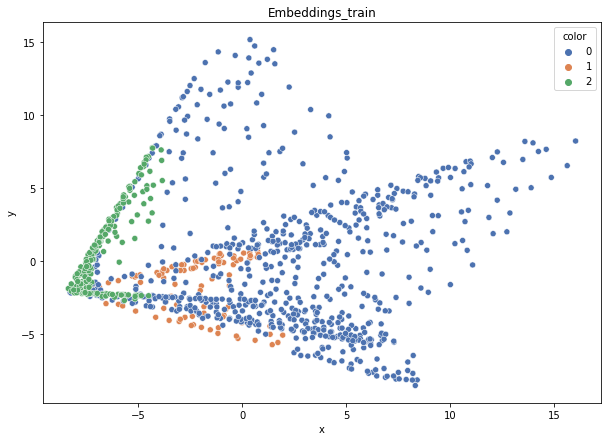

DT-f1-new-features: 0.926
DT-f1-old+new-features: 0.962
DT-f1-old-features: 0.929
DT-gmean-new-features: 0.923
DT-gmean-old+new-features: 0.951
DT-gmean-old-features: 0.928
KNN-f1-new-features: 0.925
KNN-f1-old+new-features: 0.945
KNN-f1-old-features: 0.945
KNN-gmean-new-features: 0.921
KNN-gmean-old+new-features: 0.934
KNN-gmean-old-features: 0.934
RF24-f1-new-features: 0.935
RF24-f1-old+new-features: 0.953
RF24-f1-old-features: 0.901
RF24-gmean-new-features: 0.913
RF24-gmean-old+new-features: 0.931
RF24-gmean-old-features: 0.906


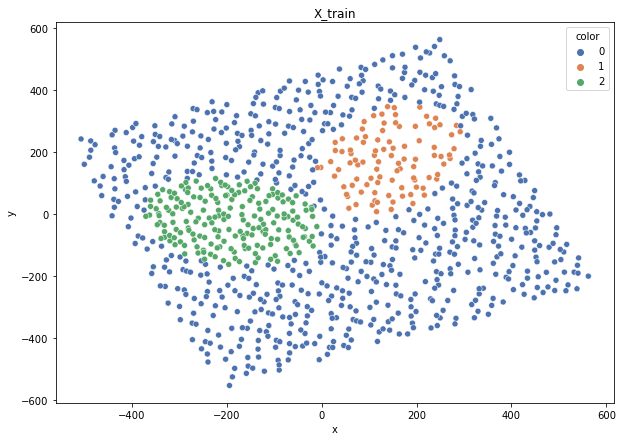

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3505.99it/s]


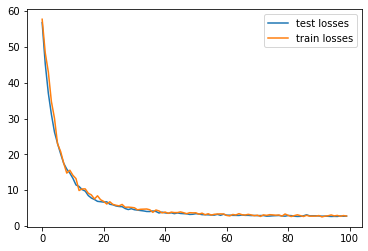

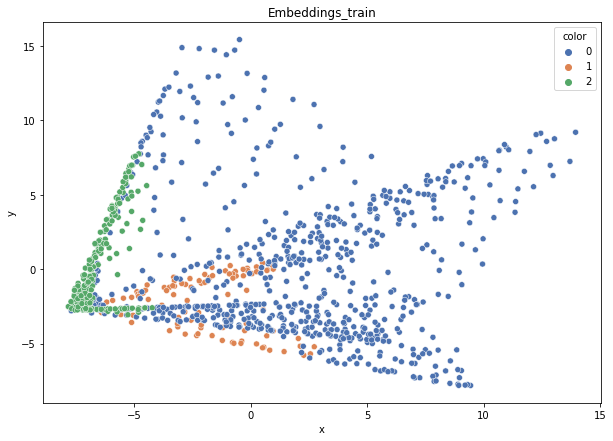

DT-f1-new-features: 0.939
DT-f1-old+new-features: 0.958
DT-f1-old-features: 0.942
DT-gmean-new-features: 0.956
DT-gmean-old+new-features: 0.951
DT-gmean-old-features: 0.934
KNN-f1-new-features: 0.971
KNN-f1-old+new-features: 0.953
KNN-f1-old-features: 0.953
KNN-gmean-new-features: 0.973
KNN-gmean-old+new-features: 0.931
KNN-gmean-old-features: 0.931
RF24-f1-new-features: 0.976
RF24-f1-old+new-features: 0.963
RF24-f1-old-features: 0.951
RF24-gmean-new-features: 0.992
RF24-gmean-old+new-features: 0.953
RF24-gmean-old-features: 0.949


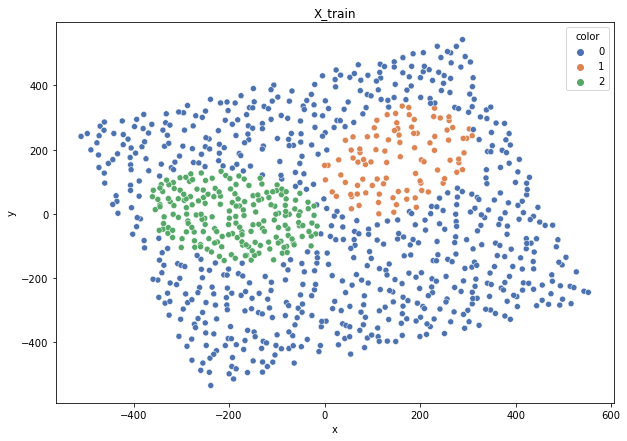

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3533.99it/s]


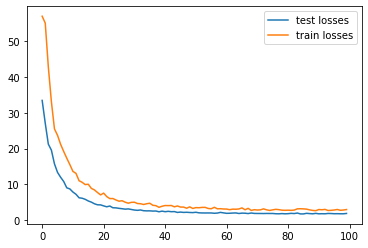

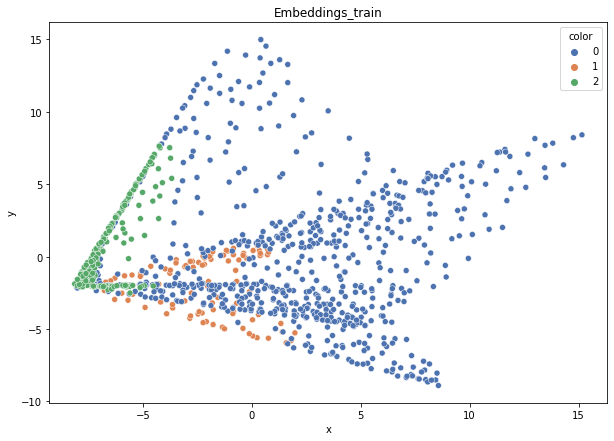

DT-f1-new-features: 0.915
DT-f1-old+new-features: 0.948
DT-f1-old-features: 0.932
DT-gmean-new-features: 0.947
DT-gmean-old+new-features: 0.972
DT-gmean-old-features: 0.959
KNN-f1-new-features: 0.947
KNN-f1-old+new-features: 0.939
KNN-f1-old-features: 0.939
KNN-gmean-new-features: 0.975
KNN-gmean-old+new-features: 0.971
KNN-gmean-old-features: 0.971
RF24-f1-new-features: 0.946
RF24-f1-old+new-features: 0.953
RF24-f1-old-features: 0.937
RF24-gmean-new-features: 0.982
RF24-gmean-old+new-features: 0.979
RF24-gmean-old-features: 0.963


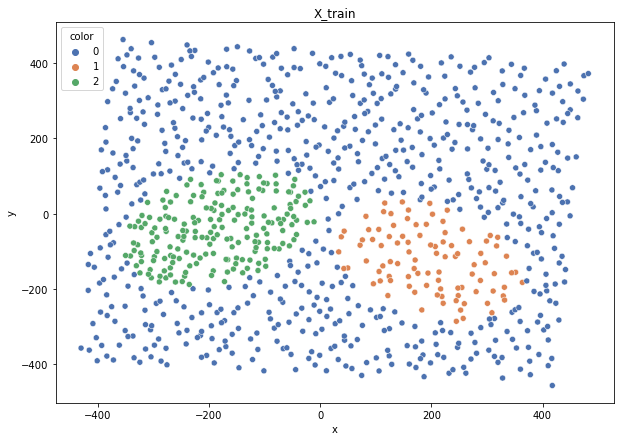

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3350.45it/s]


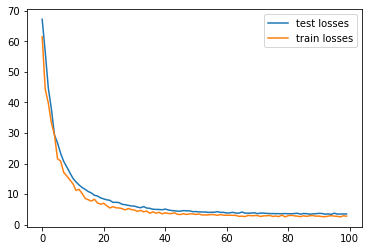

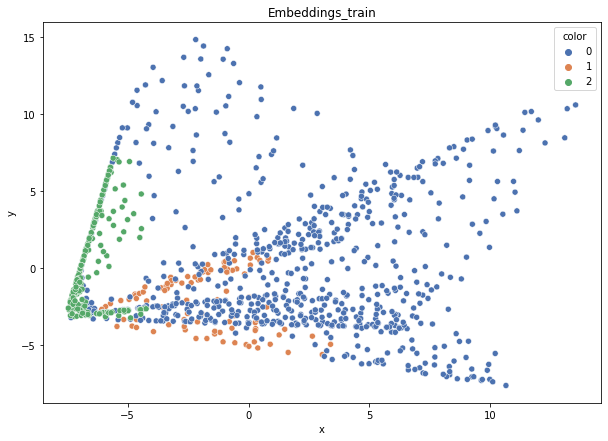

DT-f1-new-features: 0.932
DT-f1-old+new-features: 0.954
DT-f1-old-features: 0.973
DT-gmean-new-features: 0.923
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.973
KNN-f1-new-features: 0.957
KNN-f1-old+new-features: 0.958
KNN-f1-old-features: 0.958
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 0.955
KNN-gmean-old-features: 0.955
RF24-f1-new-features: 0.953
RF24-f1-old+new-features: 0.966
RF24-f1-old-features: 0.948
RF24-gmean-new-features: 0.942
RF24-gmean-old+new-features: 0.959
RF24-gmean-old-features: 0.936
2delikatne-cut


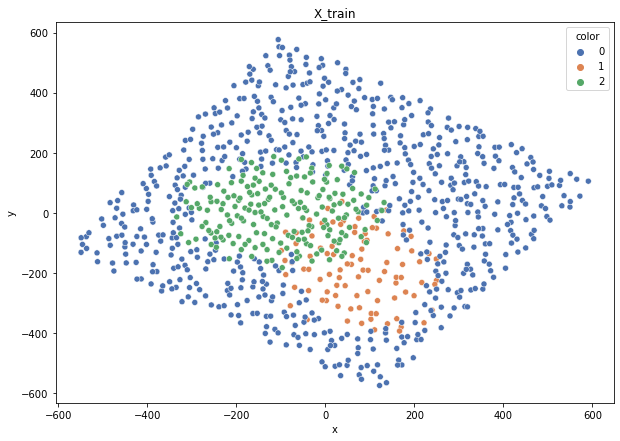

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3563.98it/s]


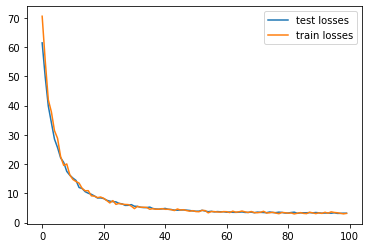

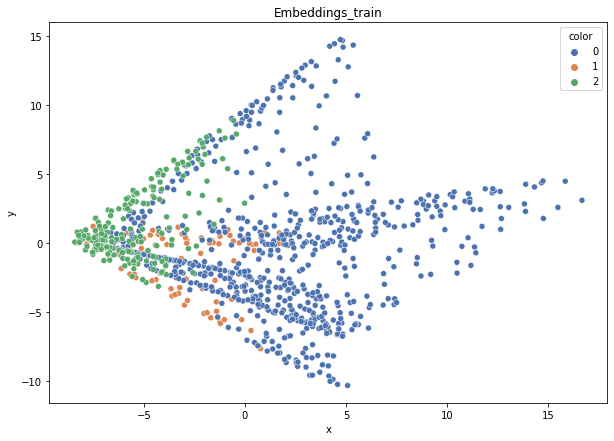

DT-f1-new-features: 0.714
DT-f1-old+new-features: 0.681
DT-f1-old-features: 0.69
DT-gmean-new-features: 0.725
DT-gmean-old+new-features: 0.646
DT-gmean-old-features: 0.674
KNN-f1-new-features: 0.691
KNN-f1-old+new-features: 0.693
KNN-f1-old-features: 0.693
KNN-gmean-new-features: 0.671
KNN-gmean-old+new-features: 0.674
KNN-gmean-old-features: 0.674
RF24-f1-new-features: 0.766
RF24-f1-old+new-features: 0.756
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.728
RF24-gmean-old+new-features: 0.727
RF24-gmean-old-features: 0.76


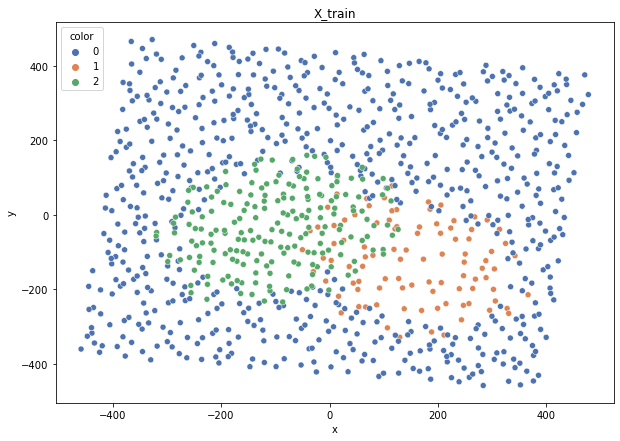

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3521.84it/s]


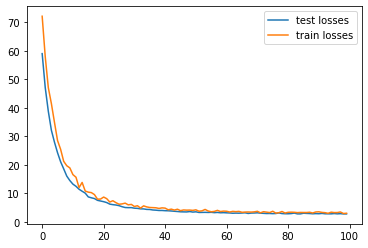

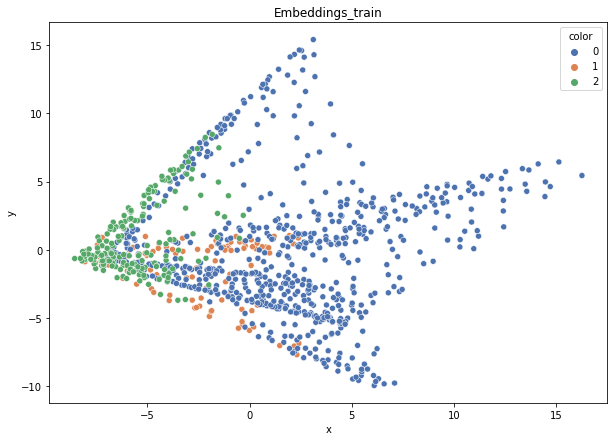

DT-f1-new-features: 0.763
DT-f1-old+new-features: 0.757
DT-f1-old-features: 0.763
DT-gmean-new-features: 0.776
DT-gmean-old+new-features: 0.772
DT-gmean-old-features: 0.787
KNN-f1-new-features: 0.73
KNN-f1-old+new-features: 0.742
KNN-f1-old-features: 0.742
KNN-gmean-new-features: 0.73
KNN-gmean-old+new-features: 0.727
KNN-gmean-old-features: 0.727
RF24-f1-new-features: 0.789
RF24-f1-old+new-features: 0.811
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.785
RF24-gmean-old+new-features: 0.82
RF24-gmean-old-features: 0.776


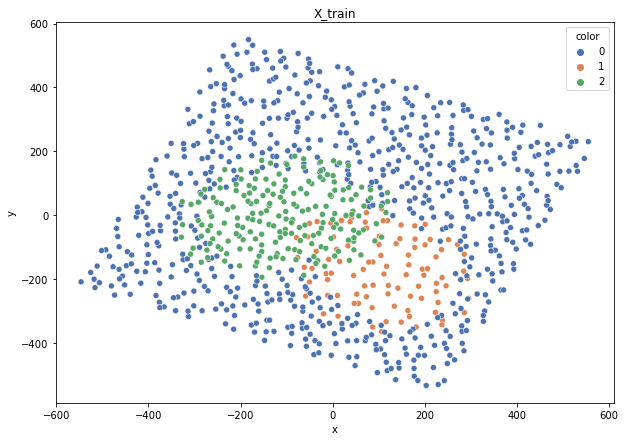

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3391.53it/s]


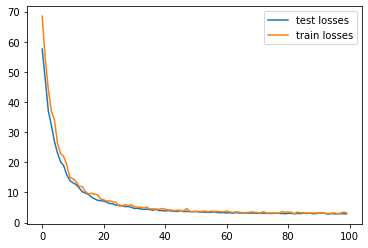

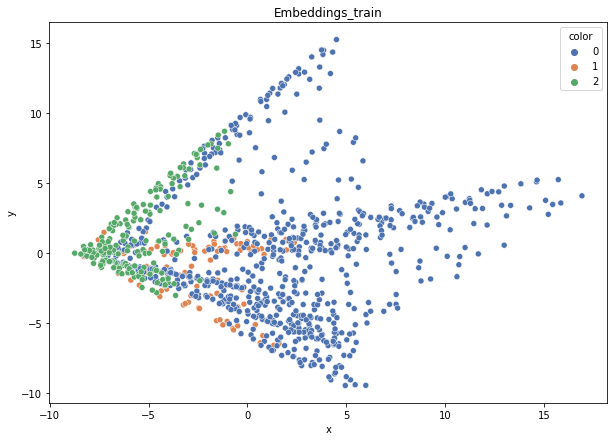

DT-f1-new-features: 0.711
DT-f1-old+new-features: 0.742
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.691
DT-gmean-old+new-features: 0.746
DT-gmean-old-features: 0.727
KNN-f1-new-features: 0.709
KNN-f1-old+new-features: 0.666
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.684
KNN-gmean-old+new-features: 0.636
KNN-gmean-old-features: 0.636
RF24-f1-new-features: 0.73
RF24-f1-old+new-features: 0.761
RF24-f1-old-features: 0.757
RF24-gmean-new-features: 0.705
RF24-gmean-old+new-features: 0.741
RF24-gmean-old-features: 0.754


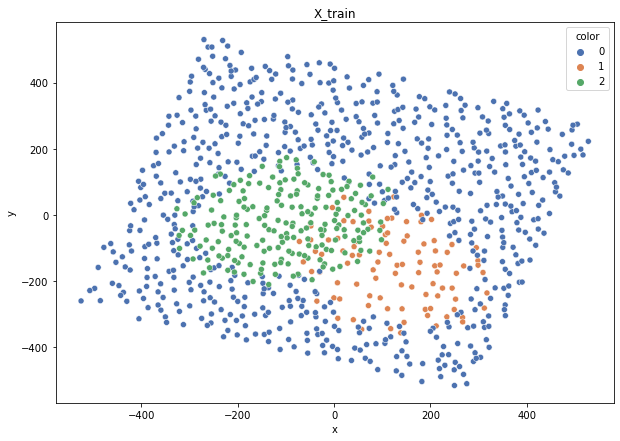

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3417.06it/s]


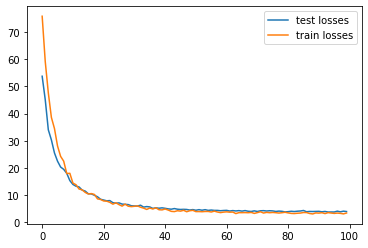

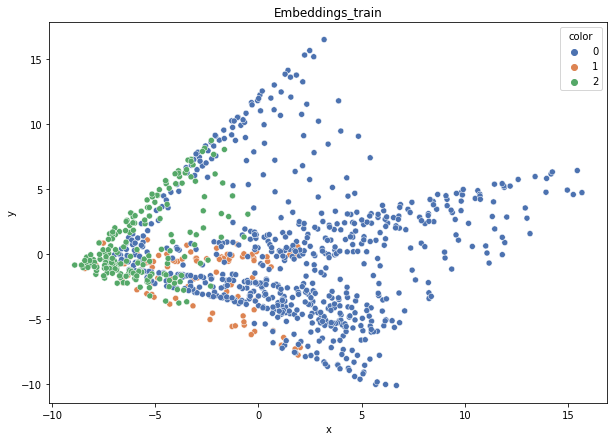

DT-f1-new-features: 0.715
DT-f1-old+new-features: 0.752
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.731
DT-gmean-old+new-features: 0.771
DT-gmean-old-features: 0.724
KNN-f1-new-features: 0.715
KNN-f1-old+new-features: 0.73
KNN-f1-old-features: 0.73
KNN-gmean-new-features: 0.716
KNN-gmean-old+new-features: 0.735
KNN-gmean-old-features: 0.735
RF24-f1-new-features: 0.734
RF24-f1-old+new-features: 0.744
RF24-f1-old-features: 0.714
RF24-gmean-new-features: 0.746
RF24-gmean-old+new-features: 0.752
RF24-gmean-old-features: 0.712


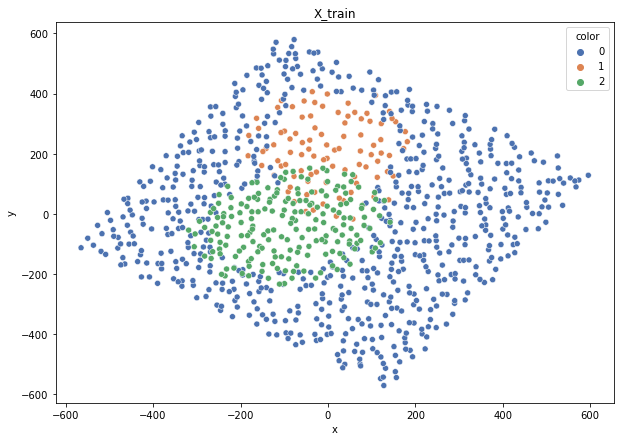

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3557.76it/s]


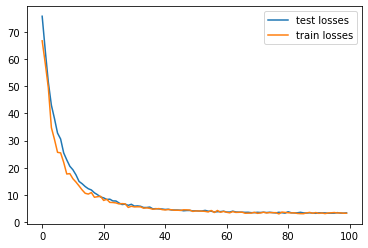

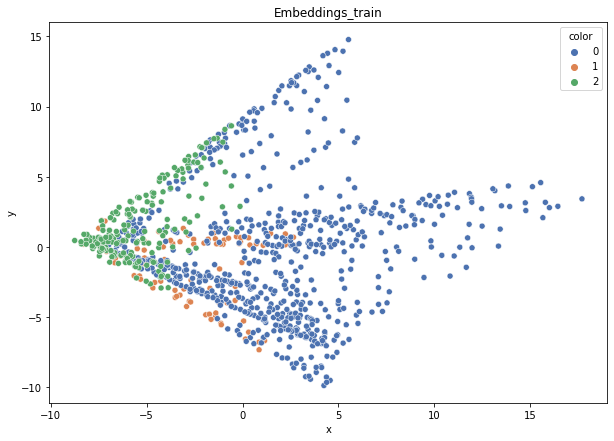

DT-f1-new-features: 0.703
DT-f1-old+new-features: 0.725
DT-f1-old-features: 0.744
DT-gmean-new-features: 0.699
DT-gmean-old+new-features: 0.736
DT-gmean-old-features: 0.774
KNN-f1-new-features: 0.692
KNN-f1-old+new-features: 0.669
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.67
KNN-gmean-old+new-features: 0.62
KNN-gmean-old-features: 0.62
RF24-f1-new-features: 0.802
RF24-f1-old+new-features: 0.792
RF24-f1-old-features: 0.785
RF24-gmean-new-features: 0.791
RF24-gmean-old+new-features: 0.764
RF24-gmean-old-features: 0.783
3mocniej-cut


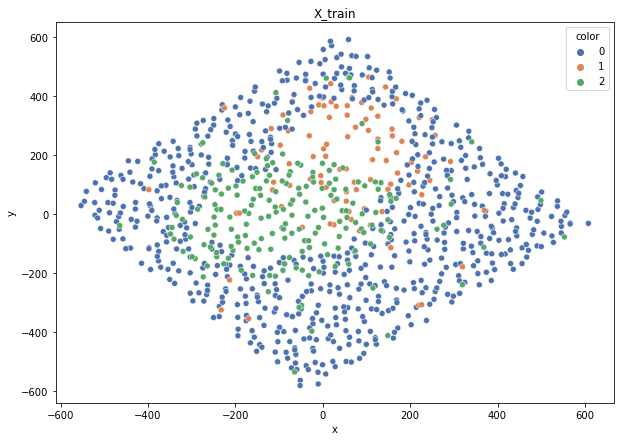

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3342.85it/s]


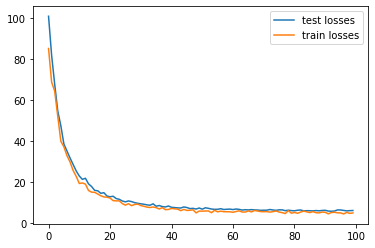

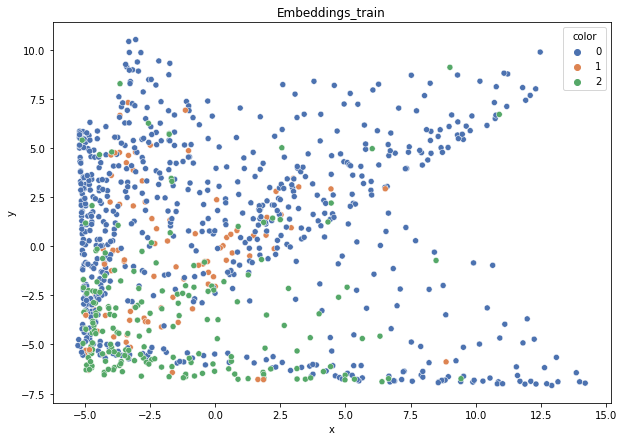

DT-f1-new-features: 0.514
DT-f1-old+new-features: 0.501
DT-f1-old-features: 0.522
DT-gmean-new-features: 0.506
DT-gmean-old+new-features: 0.506
DT-gmean-old-features: 0.524
KNN-f1-new-features: 0.513
KNN-f1-old+new-features: 0.537
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.471
KNN-gmean-old+new-features: 0.502
KNN-gmean-old-features: 0.502
RF24-f1-new-features: 0.581
RF24-f1-old+new-features: 0.558
RF24-f1-old-features: 0.545
RF24-gmean-new-features: 0.515
RF24-gmean-old+new-features: 0.486
RF24-gmean-old-features: 0.493


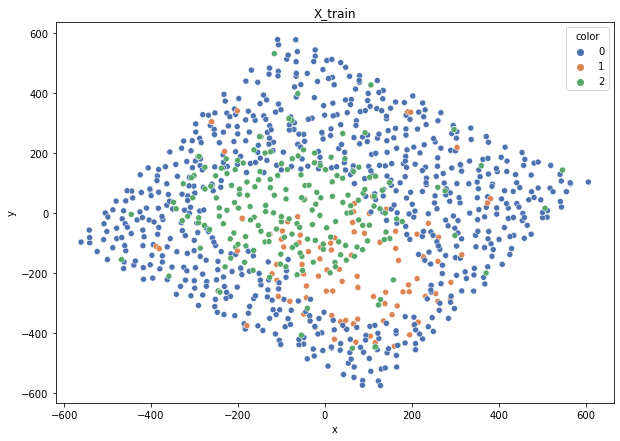

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3373.90it/s]


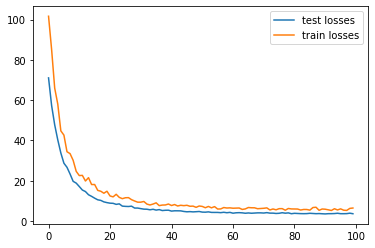

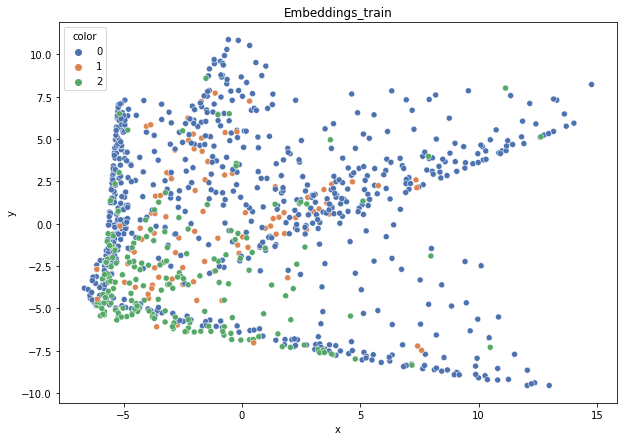

DT-f1-new-features: 0.574
DT-f1-old+new-features: 0.578
DT-f1-old-features: 0.531
DT-gmean-new-features: 0.596
DT-gmean-old+new-features: 0.613
DT-gmean-old-features: 0.547
KNN-f1-new-features: 0.593
KNN-f1-old+new-features: 0.533
KNN-f1-old-features: 0.533
KNN-gmean-new-features: 0.532
KNN-gmean-old+new-features: 0.478
KNN-gmean-old-features: 0.478
RF24-f1-new-features: 0.657
RF24-f1-old+new-features: 0.651
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.611
RF24-gmean-old+new-features: 0.629
RF24-gmean-old-features: 0.551


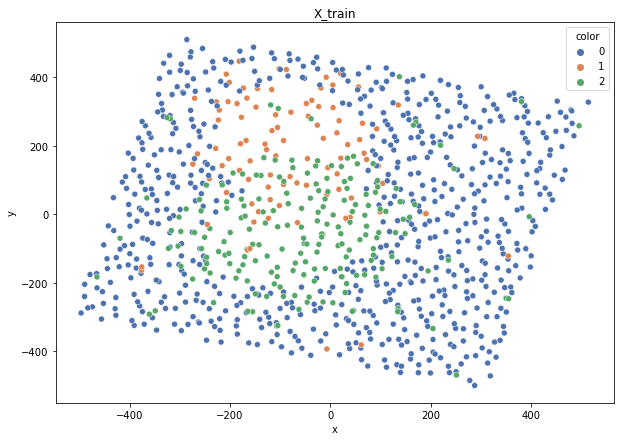

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3432.23it/s]


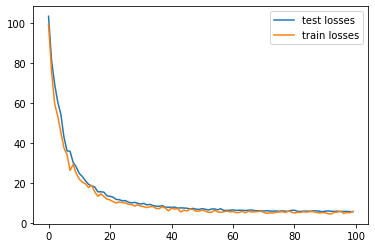

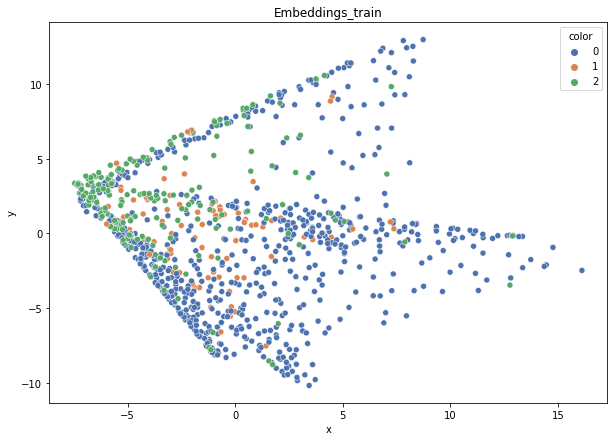

DT-f1-new-features: 0.432
DT-f1-old+new-features: 0.47
DT-f1-old-features: 0.442
DT-gmean-new-features: 0.362
DT-gmean-old+new-features: 0.463
DT-gmean-old-features: 0.43
KNN-f1-new-features: 0.448
KNN-f1-old+new-features: 0.438
KNN-f1-old-features: 0.438
KNN-gmean-new-features: 0.412
KNN-gmean-old+new-features: 0.373
KNN-gmean-old-features: 0.373
RF24-f1-new-features: 0.509
RF24-f1-old+new-features: 0.479
RF24-f1-old-features: 0.481
RF24-gmean-new-features: 0.437
RF24-gmean-old+new-features: 0.388
RF24-gmean-old-features: 0.396


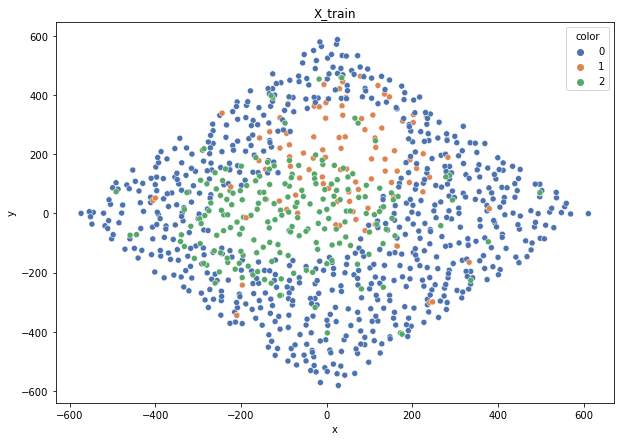

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3476.34it/s]


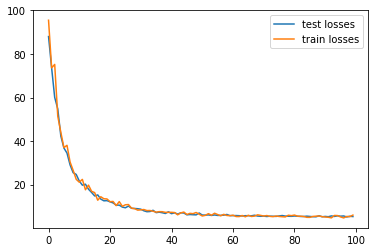

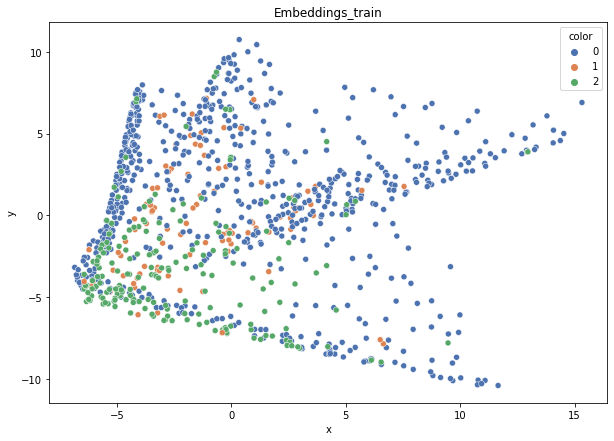

DT-f1-new-features: 0.485
DT-f1-old+new-features: 0.539
DT-f1-old-features: 0.477
DT-gmean-new-features: 0.459
DT-gmean-old+new-features: 0.525
DT-gmean-old-features: 0.473
KNN-f1-new-features: 0.529
KNN-f1-old+new-features: 0.51
KNN-f1-old-features: 0.51
KNN-gmean-new-features: 0.475
KNN-gmean-old+new-features: 0.464
KNN-gmean-old-features: 0.464
RF24-f1-new-features: 0.559
RF24-f1-old+new-features: 0.57
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.499
RF24-gmean-old+new-features: 0.532
RF24-gmean-old-features: 0.584


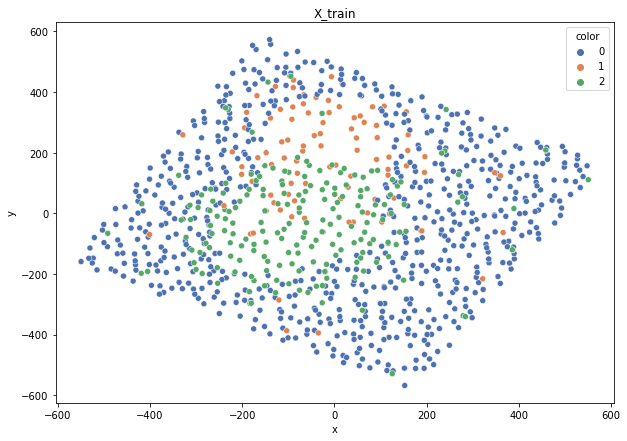

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3444.55it/s]


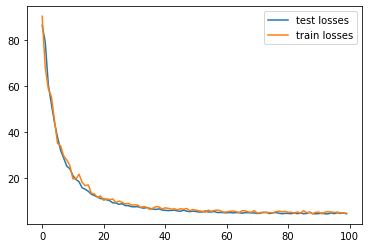

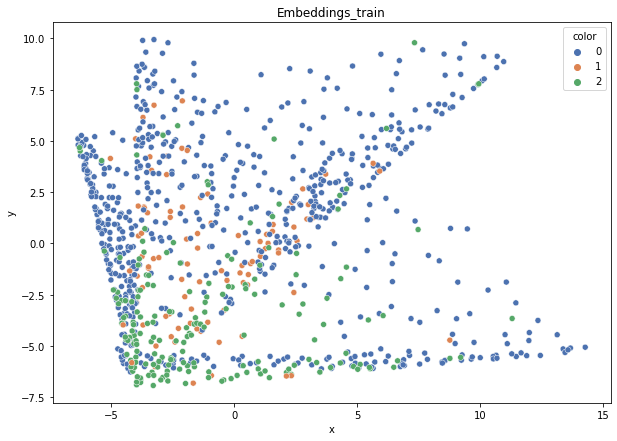

DT-f1-new-features: 0.521
DT-f1-old+new-features: 0.545
DT-f1-old-features: 0.552
DT-gmean-new-features: 0.519
DT-gmean-old+new-features: 0.568
DT-gmean-old-features: 0.536
KNN-f1-new-features: 0.507
KNN-f1-old+new-features: 0.519
KNN-f1-old-features: 0.519
KNN-gmean-new-features: 0.464
KNN-gmean-old+new-features: 0.469
KNN-gmean-old-features: 0.469
RF24-f1-new-features: 0.562
RF24-f1-old+new-features: 0.561
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.483
RF24-gmean-old+new-features: 0.461
RF24-gmean-old-features: 0.574
4delikatne-bezover-cut


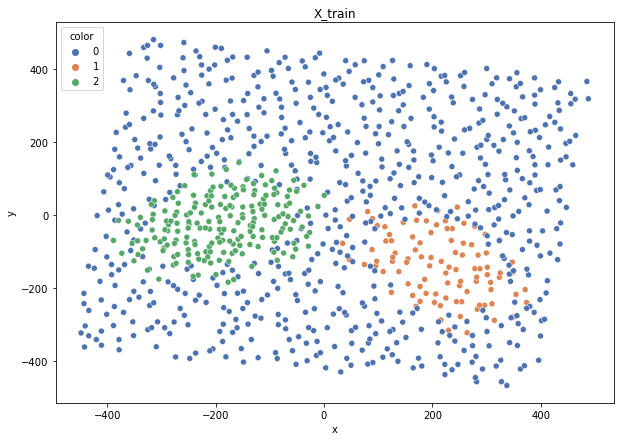

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3535.84it/s]


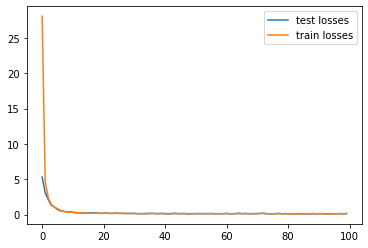

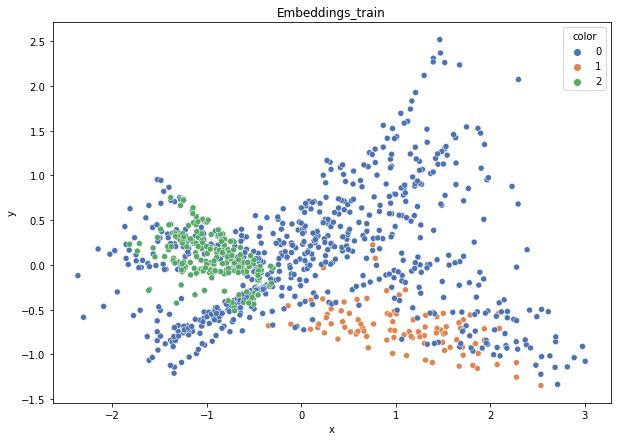

DT-f1-new-features: 0.766
DT-f1-old+new-features: 0.814
DT-f1-old-features: 0.809
DT-gmean-new-features: 0.776
DT-gmean-old+new-features: 0.811
DT-gmean-old-features: 0.814
KNN-f1-new-features: 0.766
KNN-f1-old+new-features: 0.777
KNN-f1-old-features: 0.777
KNN-gmean-new-features: 0.748
KNN-gmean-old+new-features: 0.753
KNN-gmean-old-features: 0.753
RF24-f1-new-features: 0.801
RF24-f1-old+new-features: 0.819
RF24-f1-old-features: 0.811
RF24-gmean-new-features: 0.799
RF24-gmean-old+new-features: 0.805
RF24-gmean-old-features: 0.811


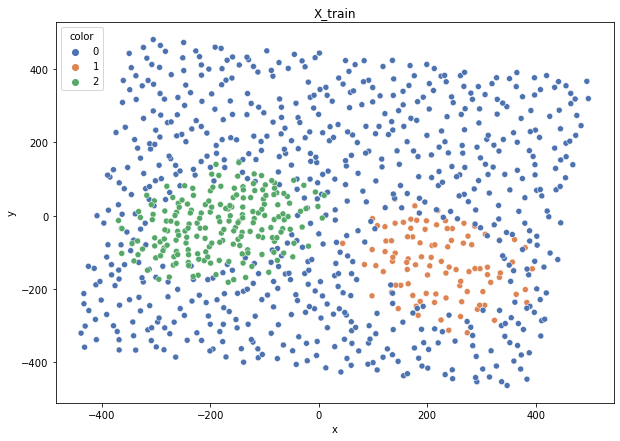

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3439.88it/s]


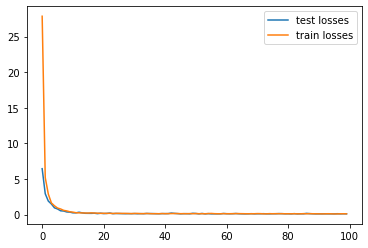

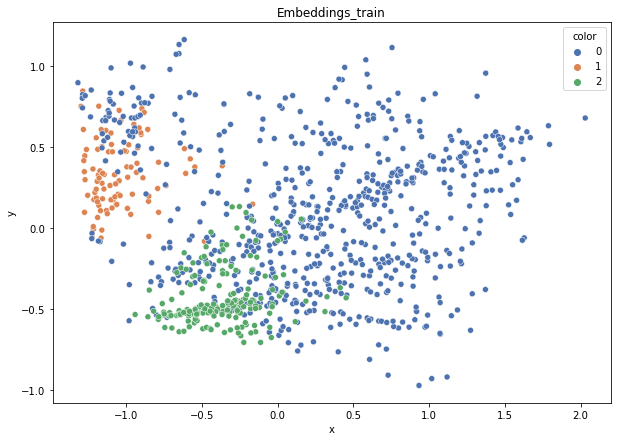

DT-f1-new-features: 0.705
DT-f1-old+new-features: 0.759
DT-f1-old-features: 0.761
DT-gmean-new-features: 0.724
DT-gmean-old+new-features: 0.759
DT-gmean-old-features: 0.769
KNN-f1-new-features: 0.667
KNN-f1-old+new-features: 0.767
KNN-f1-old-features: 0.767
KNN-gmean-new-features: 0.645
KNN-gmean-old+new-features: 0.782
KNN-gmean-old-features: 0.782
RF24-f1-new-features: 0.747
RF24-f1-old+new-features: 0.813
RF24-f1-old-features: 0.826
RF24-gmean-new-features: 0.762
RF24-gmean-old+new-features: 0.82
RF24-gmean-old-features: 0.845


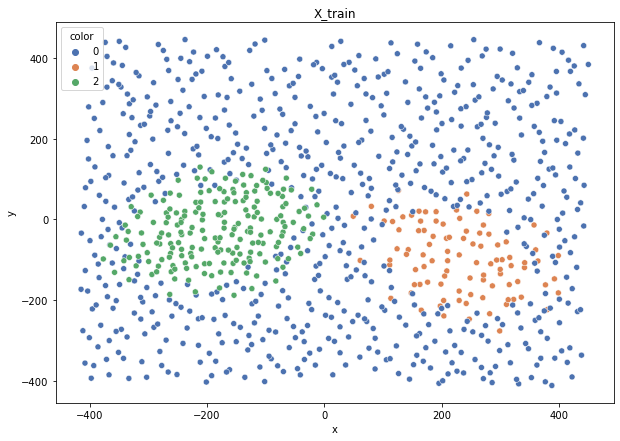

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3534.18it/s]


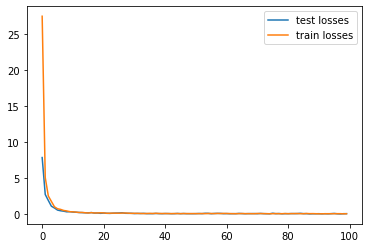

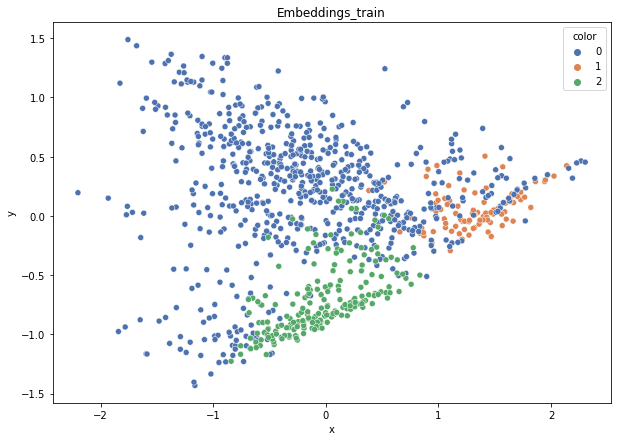

DT-f1-new-features: 0.761
DT-f1-old+new-features: 0.805
DT-f1-old-features: 0.785
DT-gmean-new-features: 0.771
DT-gmean-old+new-features: 0.825
DT-gmean-old-features: 0.785
KNN-f1-new-features: 0.778
KNN-f1-old+new-features: 0.77
KNN-f1-old-features: 0.77
KNN-gmean-new-features: 0.759
KNN-gmean-old+new-features: 0.746
KNN-gmean-old-features: 0.746
RF24-f1-new-features: 0.791
RF24-f1-old+new-features: 0.843
RF24-f1-old-features: 0.801
RF24-gmean-new-features: 0.786
RF24-gmean-old+new-features: 0.837
RF24-gmean-old-features: 0.78


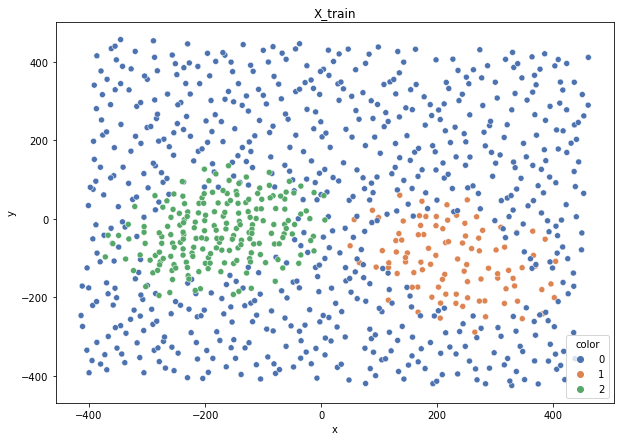

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3386.88it/s]


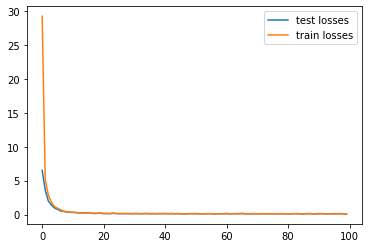

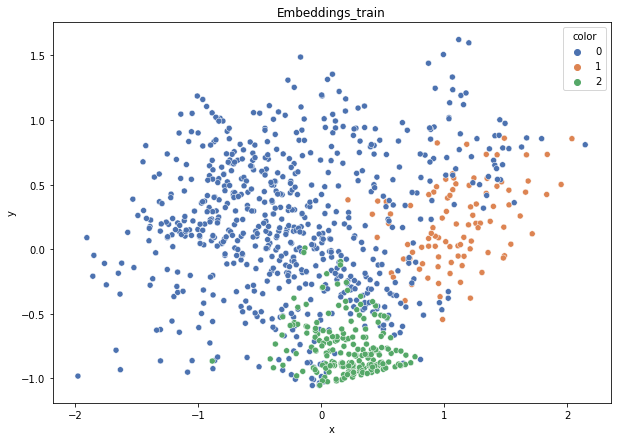

DT-f1-new-features: 0.723
DT-f1-old+new-features: 0.763
DT-f1-old-features: 0.805
DT-gmean-new-features: 0.745
DT-gmean-old+new-features: 0.789
DT-gmean-old-features: 0.831
KNN-f1-new-features: 0.744
KNN-f1-old+new-features: 0.747
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.749
KNN-gmean-old+new-features: 0.749
KNN-gmean-old-features: 0.749
RF24-f1-new-features: 0.771
RF24-f1-old+new-features: 0.812
RF24-f1-old-features: 0.827
RF24-gmean-new-features: 0.802
RF24-gmean-old+new-features: 0.828
RF24-gmean-old-features: 0.871


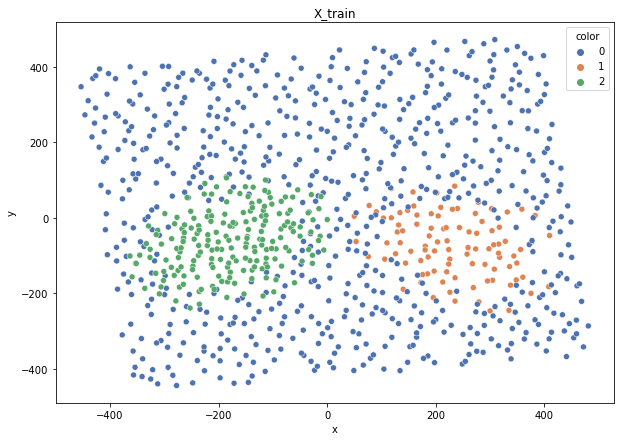

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3431.18it/s]


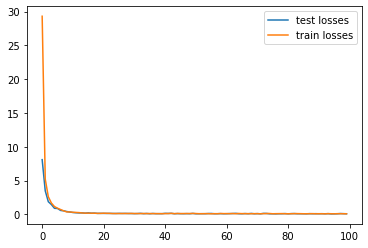

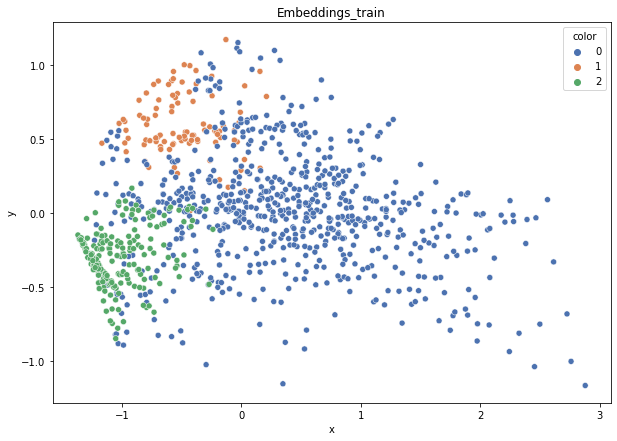

DT-f1-new-features: 0.78
DT-f1-old+new-features: 0.772
DT-f1-old-features: 0.821
DT-gmean-new-features: 0.792
DT-gmean-old+new-features: 0.778
DT-gmean-old-features: 0.866
KNN-f1-new-features: 0.824
KNN-f1-old+new-features: 0.786
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.832
KNN-gmean-old+new-features: 0.788
KNN-gmean-old-features: 0.788
RF24-f1-new-features: 0.808
RF24-f1-old+new-features: 0.821
RF24-f1-old-features: 0.836
RF24-gmean-new-features: 0.816
RF24-gmean-old+new-features: 0.838
RF24-gmean-old-features: 0.87
balance-scale


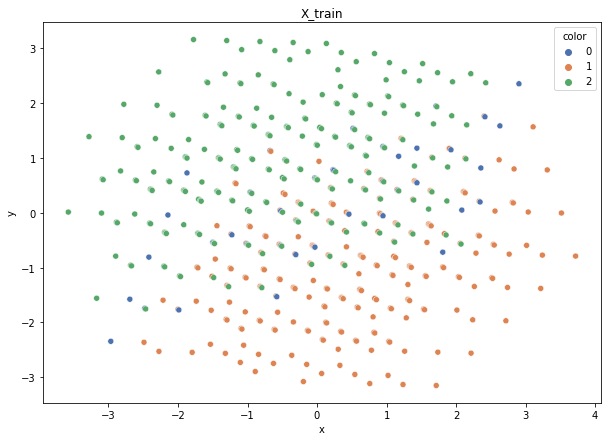

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 3298.55it/s]


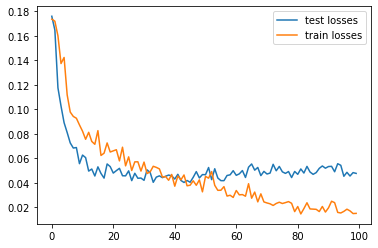

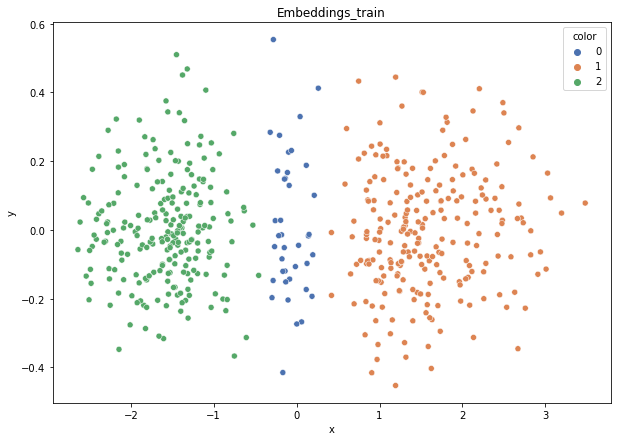

DT-f1-new-features: 0.824
DT-f1-old+new-features: 0.824
DT-f1-old-features: 0.568
DT-gmean-new-features: 0.896
DT-gmean-old+new-features: 0.896
DT-gmean-old-features: 0.088
KNN-f1-new-features: 0.796
KNN-f1-old+new-features: 0.663
KNN-f1-old-features: 0.577
KNN-gmean-new-features: 0.857
KNN-gmean-old+new-features: 0.543
KNN-gmean-old-features: 0.091
RF24-f1-new-features: 0.824
RF24-f1-old+new-features: 0.814
RF24-f1-old-features: 0.588
RF24-gmean-new-features: 0.896
RF24-gmean-old+new-features: 0.891
RF24-gmean-old-features: 0.092


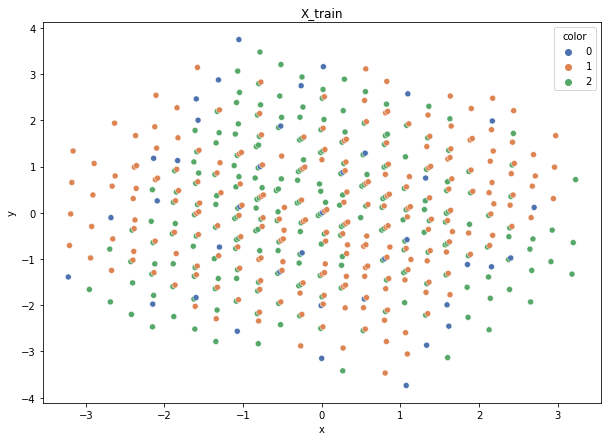

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 3414.71it/s]


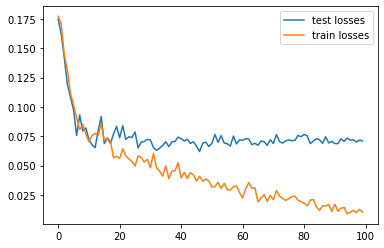

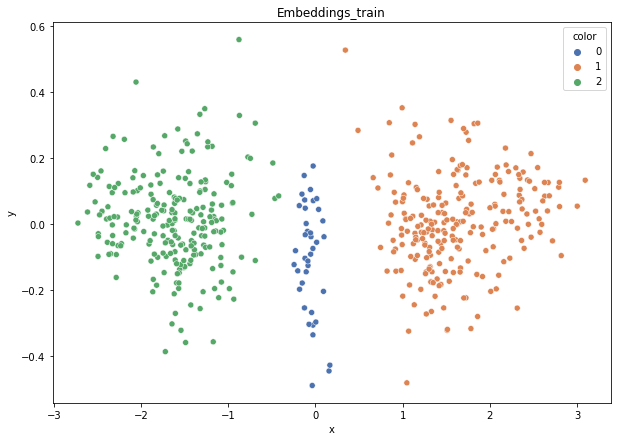

DT-f1-new-features: 0.793
DT-f1-old+new-features: 0.793
DT-f1-old-features: 0.638
DT-gmean-new-features: 0.857
DT-gmean-old+new-features: 0.857
DT-gmean-old-features: 0.585
KNN-f1-new-features: 0.782
KNN-f1-old+new-features: 0.621
KNN-f1-old-features: 0.558
KNN-gmean-new-features: 0.825
KNN-gmean-old+new-features: 0.426
KNN-gmean-old-features: 0.089
RF24-f1-new-features: 0.784
RF24-f1-old+new-features: 0.773
RF24-f1-old-features: 0.595
RF24-gmean-new-features: 0.851
RF24-gmean-old+new-features: 0.819
RF24-gmean-old-features: 0.093


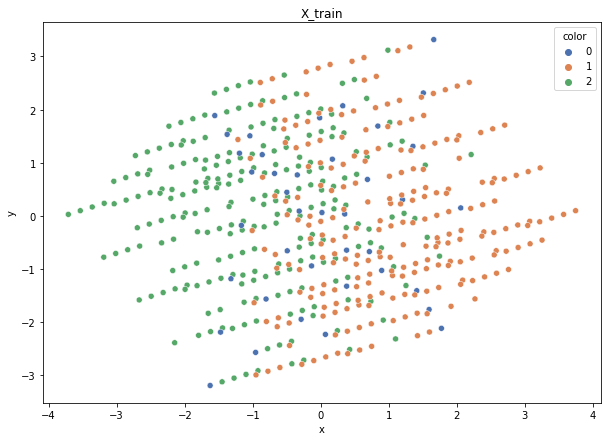

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {2: 0.12614436991098174, 1: 0.1266928236932034, 0: 0.7471628063958148}


100%|██████████| 125/125 [00:00<00:00, 3350.62it/s]


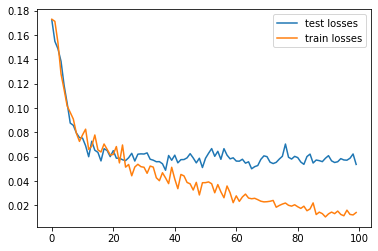

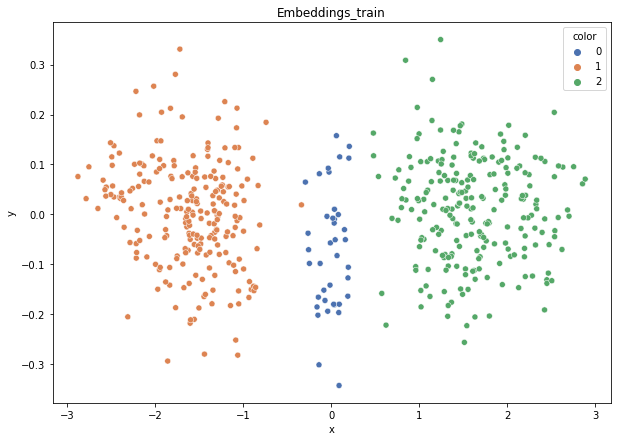

DT-f1-new-features: 0.829
DT-f1-old+new-features: 0.829
DT-f1-old-features: 0.655
DT-gmean-new-features: 0.923
DT-gmean-old+new-features: 0.923
DT-gmean-old-features: 0.597
KNN-f1-new-features: 0.84
KNN-f1-old+new-features: 0.666
KNN-f1-old-features: 0.574
KNN-gmean-new-features: 0.909
KNN-gmean-old+new-features: 0.606
KNN-gmean-old-features: 0.091
RF24-f1-new-features: 0.838
RF24-f1-old+new-features: 0.838
RF24-f1-old-features: 0.6
RF24-gmean-new-features: 0.929
RF24-gmean-old+new-features: 0.929
RF24-gmean-old-features: 0.093


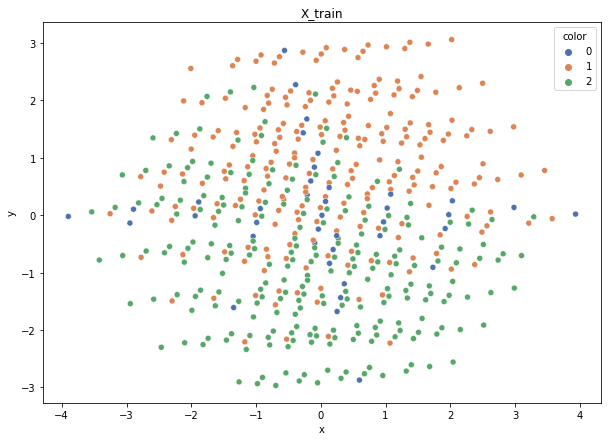

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.12614436991098174, 1: 0.1266928236932034}


100%|██████████| 125/125 [00:00<00:00, 3362.03it/s]


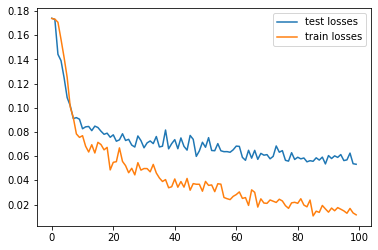

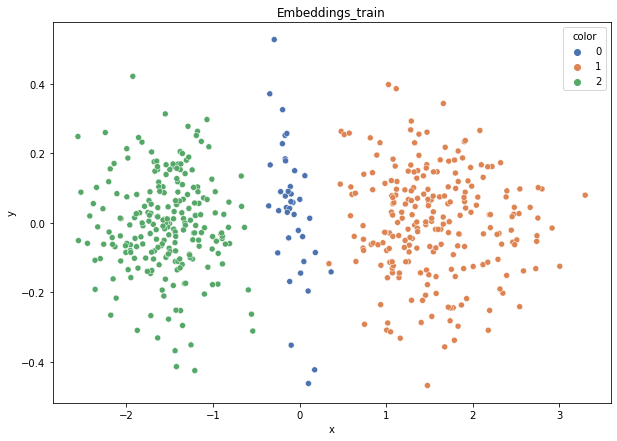

DT-f1-new-features: 0.838
DT-f1-old+new-features: 0.838
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.929
DT-gmean-old+new-features: 0.929
DT-gmean-old-features: 0.397
KNN-f1-new-features: 0.858
KNN-f1-old+new-features: 0.685
KNN-f1-old-features: 0.558
KNN-gmean-new-features: 0.94
KNN-gmean-old+new-features: 0.554
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.858
RF24-f1-old+new-features: 0.858
RF24-f1-old-features: 0.603
RF24-gmean-new-features: 0.941
RF24-gmean-old+new-features: 0.941
RF24-gmean-old-features: 0.094


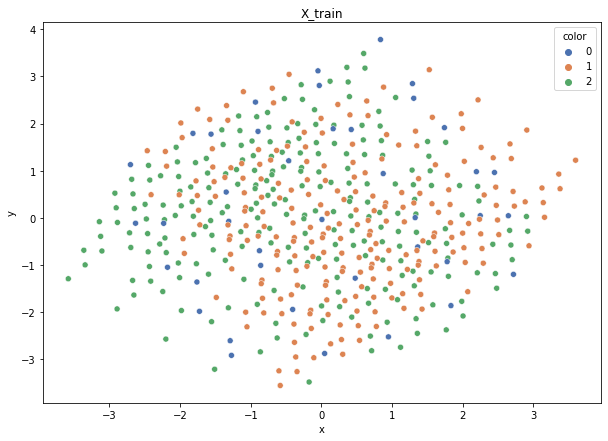

Class cardinalities: Counter({2: 230, 1: 230, 0: 40})
Weights: {0: 0.7419354838709677, 2: 0.12903225806451613, 1: 0.12903225806451613}


100%|██████████| 125/125 [00:00<00:00, 3301.67it/s]


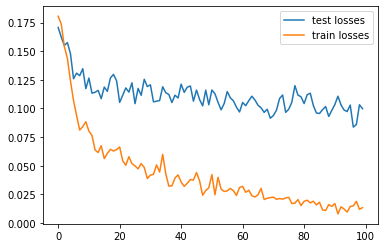

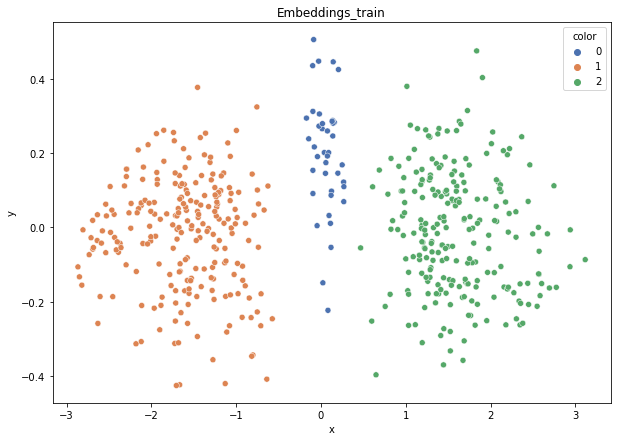

DT-f1-new-features: 0.785
DT-f1-old+new-features: 0.733
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.85
DT-gmean-old+new-features: 0.755
DT-gmean-old-features: 0.415
KNN-f1-new-features: 0.764
KNN-f1-old+new-features: 0.577
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.807
KNN-gmean-old+new-features: 0.09
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.764
RF24-f1-old+new-features: 0.755
RF24-f1-old-features: 0.587
RF24-gmean-new-features: 0.807
RF24-gmean-old+new-features: 0.802
RF24-gmean-old-features: 0.091
cleveland


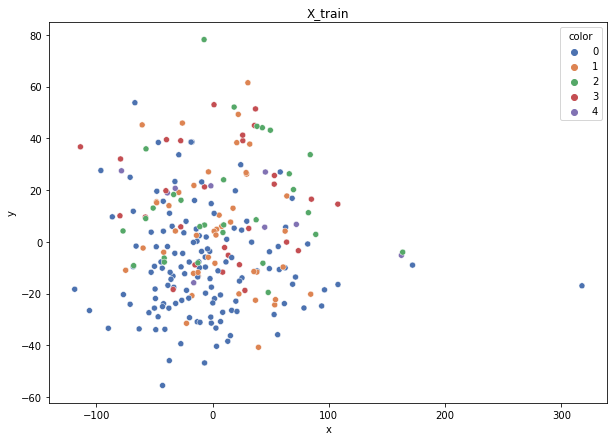

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3311.41it/s]


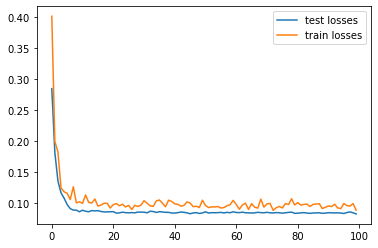

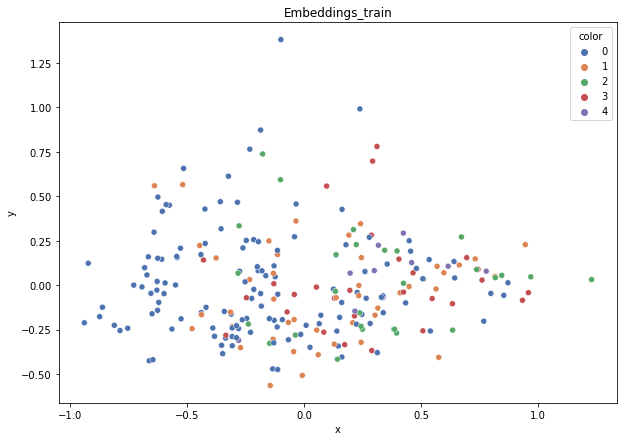

DT-f1-new-features: 0.268
DT-f1-old+new-features: 0.349
DT-f1-old-features: 0.267
DT-gmean-new-features: 0.106
DT-gmean-old+new-features: 0.343
DT-gmean-old-features: 0.098
KNN-f1-new-features: 0.304
KNN-f1-old+new-features: 0.23
KNN-f1-old-features: 0.23
KNN-gmean-new-features: 0.239
KNN-gmean-old+new-features: 0.086
KNN-gmean-old-features: 0.086
RF24-f1-new-features: 0.3
RF24-f1-old+new-features: 0.33
RF24-f1-old-features: 0.316
RF24-gmean-new-features: 0.112
RF24-gmean-old+new-features: 0.1
RF24-gmean-old-features: 0.092


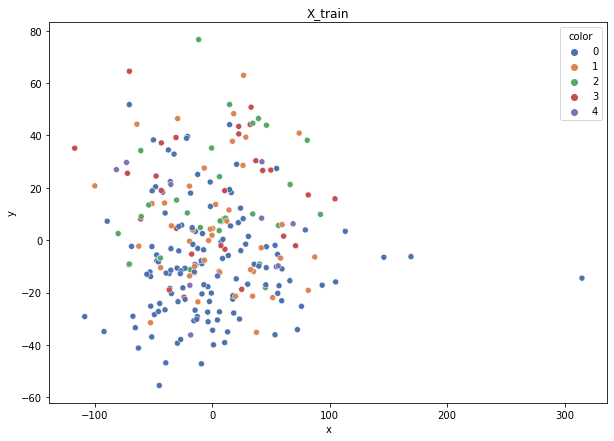

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3357.51it/s]


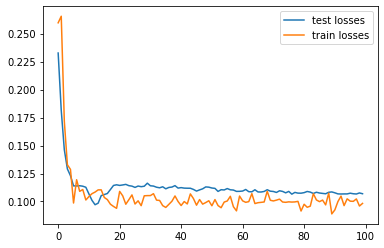

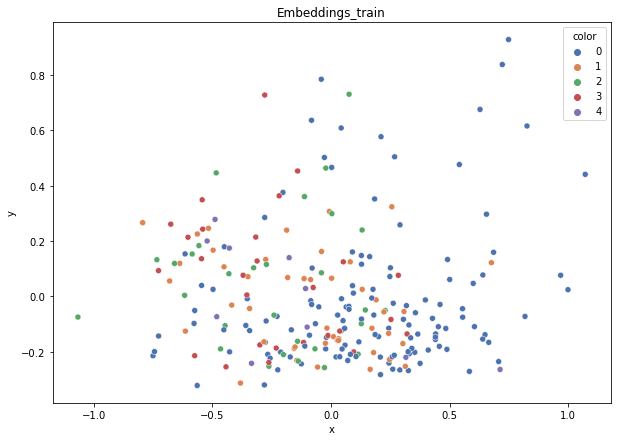

DT-f1-new-features: 0.239
DT-f1-old+new-features: 0.335
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.088
DT-gmean-old+new-features: 0.126
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.337
KNN-f1-old+new-features: 0.22
KNN-f1-old-features: 0.22
KNN-gmean-new-features: 0.122
KNN-gmean-old+new-features: 0.074
KNN-gmean-old-features: 0.074
RF24-f1-new-features: 0.269
RF24-f1-old+new-features: 0.257
RF24-f1-old-features: 0.305
RF24-gmean-new-features: 0.093
RF24-gmean-old+new-features: 0.033
RF24-gmean-old-features: 0.093


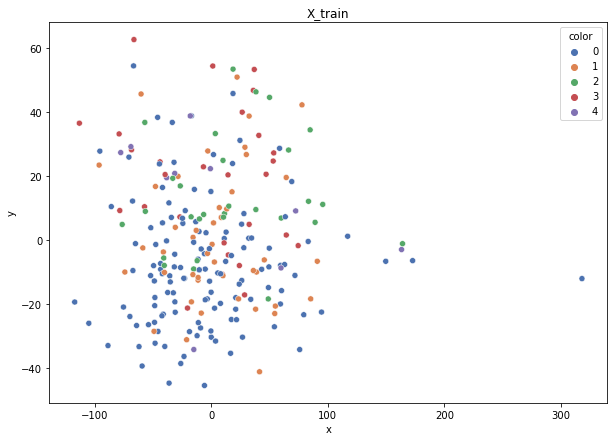

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 3: 0.17807468492085946, 1: 0.11332025404054694, 2: 0.1719341785442781, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3431.31it/s]


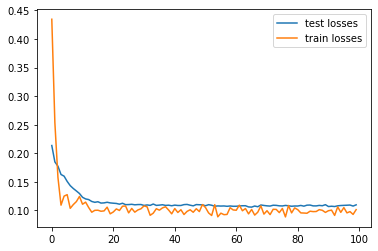

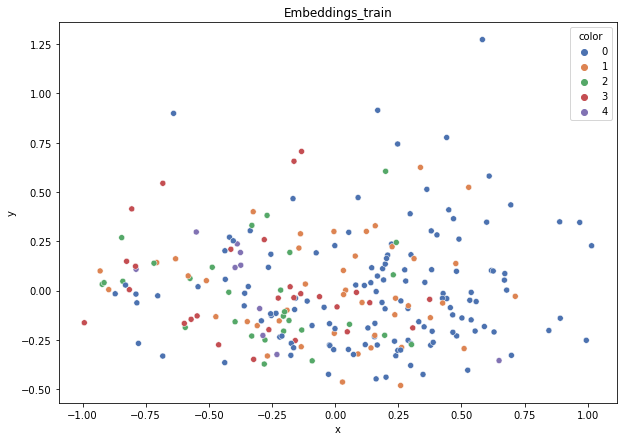

DT-f1-new-features: 0.268
DT-f1-old+new-features: 0.244
DT-f1-old-features: 0.39
DT-gmean-new-features: 0.275
DT-gmean-old+new-features: 0.077
DT-gmean-old-features: 0.138
KNN-f1-new-features: 0.214
KNN-f1-old+new-features: 0.264
KNN-f1-old-features: 0.264
KNN-gmean-new-features: 0.073
KNN-gmean-old+new-features: 0.088
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.301
RF24-f1-old+new-features: 0.376
RF24-f1-old-features: 0.315
RF24-gmean-new-features: 0.044
RF24-gmean-old+new-features: 0.126
RF24-gmean-old-features: 0.1


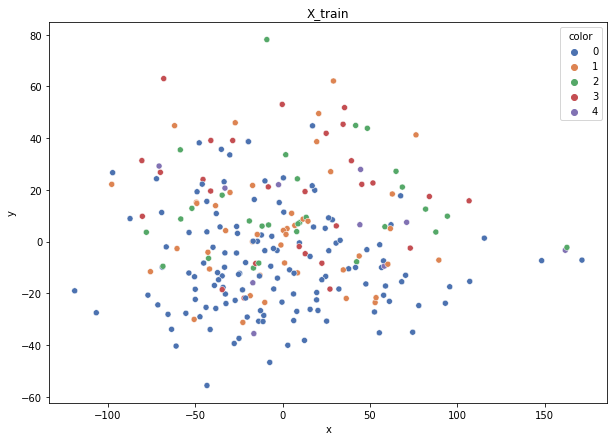

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 11})
Weights: {0: 0.03986894846317969, 2: 0.18009766374746689, 1: 0.11870073292446681, 3: 0.18652972316701927, 4: 0.47480293169786725}


100%|██████████| 60/60 [00:00<00:00, 3424.67it/s]


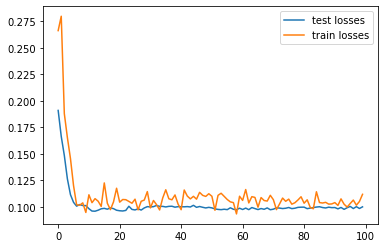

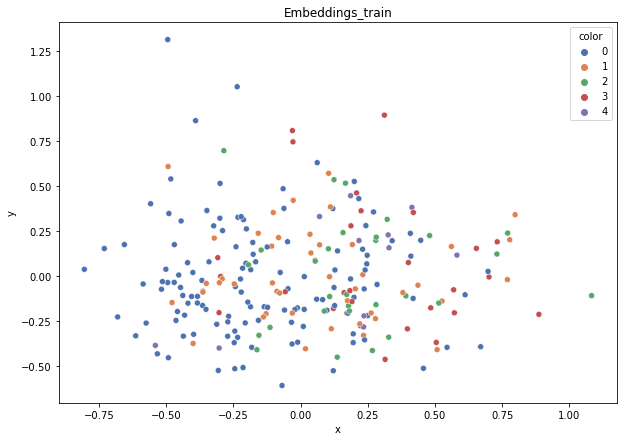

DT-f1-new-features: 0.204
DT-f1-old+new-features: 0.293
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.034
DT-gmean-old+new-features: 0.1
DT-gmean-old-features: 0.112
KNN-f1-new-features: 0.345
KNN-f1-old+new-features: 0.275
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.11
KNN-gmean-old+new-features: 0.23
KNN-gmean-old-features: 0.23
RF24-f1-new-features: 0.24
RF24-f1-old+new-features: 0.322
RF24-f1-old-features: 0.304
RF24-gmean-new-features: 0.077
RF24-gmean-old+new-features: 0.092
RF24-gmean-old-features: 0.098


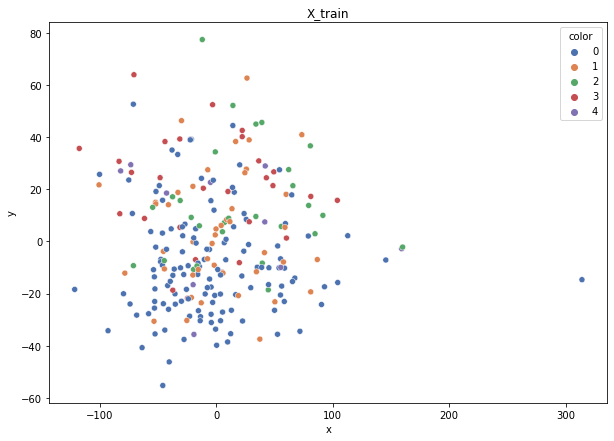

Class cardinalities: Counter({0: 132, 1: 44, 2: 28, 3: 28, 4: 11})
Weights: {2: 0.18539325842696627, 1: 0.11797752808988764, 0: 0.03932584269662921, 3: 0.18539325842696627, 4: 0.47191011235955055}


100%|██████████| 60/60 [00:00<00:00, 3440.16it/s]


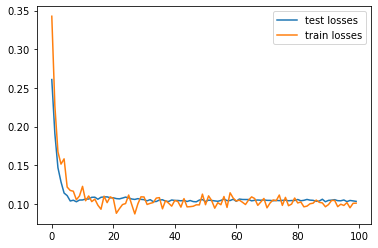

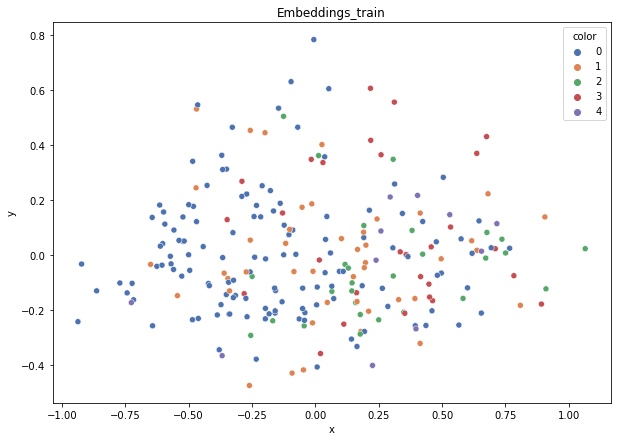

DT-f1-new-features: 0.284
DT-f1-old+new-features: 0.285
DT-f1-old-features: 0.227
DT-gmean-new-features: 0.254
DT-gmean-old+new-features: 0.117
DT-gmean-old-features: 0.03
KNN-f1-new-features: 0.189
KNN-f1-old+new-features: 0.212
KNN-f1-old-features: 0.212
KNN-gmean-new-features: 0.027
KNN-gmean-old+new-features: 0.032
KNN-gmean-old-features: 0.032
RF24-f1-new-features: 0.265
RF24-f1-old+new-features: 0.406
RF24-f1-old-features: 0.411
RF24-gmean-new-features: 0.095
RF24-gmean-old+new-features: 0.316
RF24-gmean-old-features: 0.13
cleveland_v2


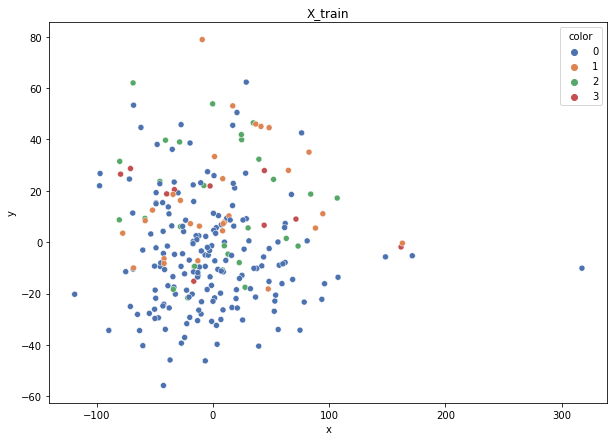

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3429.15it/s]


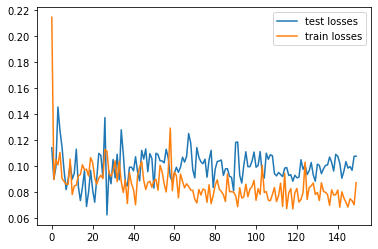

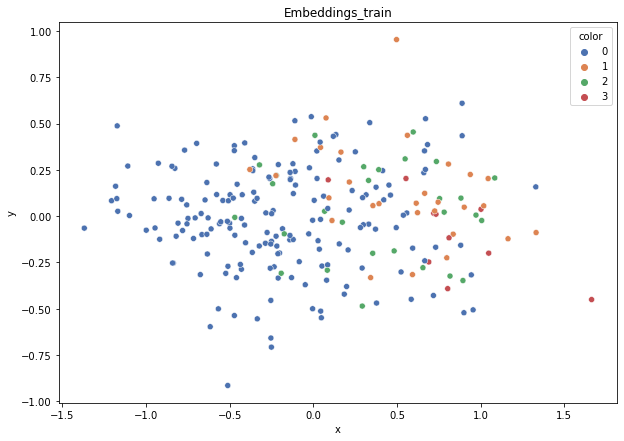

DT-f1-new-features: 0.355
DT-f1-old+new-features: 0.352
DT-f1-old-features: 0.358
DT-gmean-new-features: 0.092
DT-gmean-old+new-features: 0.103
DT-gmean-old-features: 0.099
KNN-f1-new-features: 0.228
KNN-f1-old+new-features: 0.24
KNN-f1-old-features: 0.24
KNN-gmean-new-features: 0.018
KNN-gmean-old+new-features: 0.019
KNN-gmean-old-features: 0.019
RF24-f1-new-features: 0.255
RF24-f1-old+new-features: 0.35
RF24-f1-old-features: 0.462
RF24-gmean-new-features: 0.019
RF24-gmean-old+new-features: 0.078
RF24-gmean-old-features: 0.121


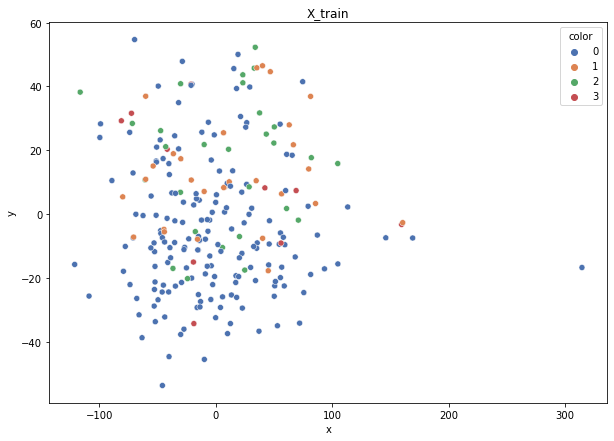

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3367.90it/s]


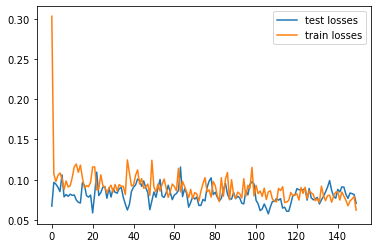

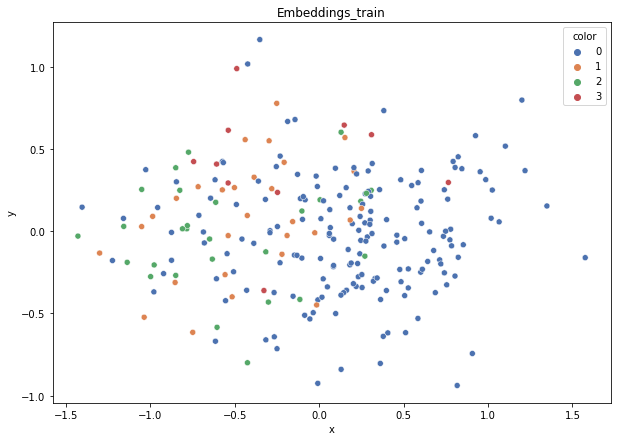

DT-f1-new-features: 0.321
DT-f1-old+new-features: 0.282
DT-f1-old-features: 0.484
DT-gmean-new-features: 0.086
DT-gmean-old+new-features: 0.083
DT-gmean-old-features: 0.546
KNN-f1-new-features: 0.356
KNN-f1-old+new-features: 0.306
KNN-f1-old-features: 0.306
KNN-gmean-new-features: 0.09
KNN-gmean-old+new-features: 0.074
KNN-gmean-old-features: 0.074
RF24-f1-new-features: 0.386
RF24-f1-old+new-features: 0.384
RF24-f1-old-features: 0.346
RF24-gmean-new-features: 0.101
RF24-gmean-old+new-features: 0.101
RF24-gmean-old-features: 0.085


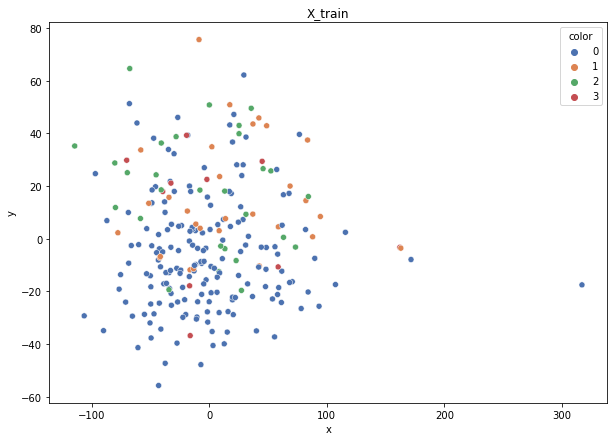

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3437.63it/s]


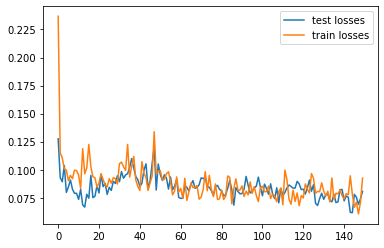

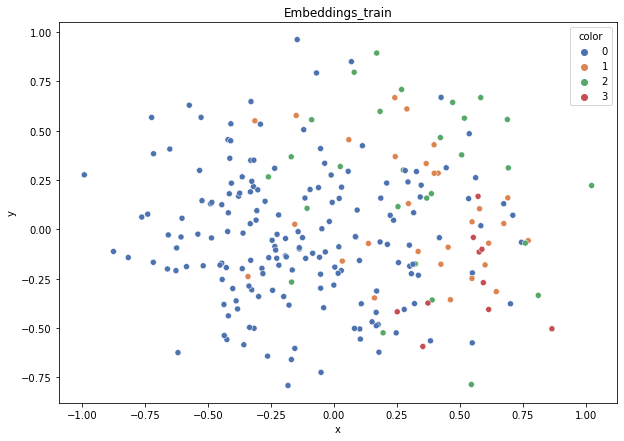

DT-f1-new-features: 0.404
DT-f1-old+new-features: 0.357
DT-f1-old-features: 0.294
DT-gmean-new-features: 0.378
DT-gmean-old+new-features: 0.095
DT-gmean-old-features: 0.075
KNN-f1-new-features: 0.281
KNN-f1-old+new-features: 0.389
KNN-f1-old-features: 0.389
KNN-gmean-new-features: 0.065
KNN-gmean-old+new-features: 0.103
KNN-gmean-old-features: 0.103
RF24-f1-new-features: 0.405
RF24-f1-old+new-features: 0.356
RF24-f1-old-features: 0.26
RF24-gmean-new-features: 0.331
RF24-gmean-old+new-features: 0.079
RF24-gmean-old-features: 0.019


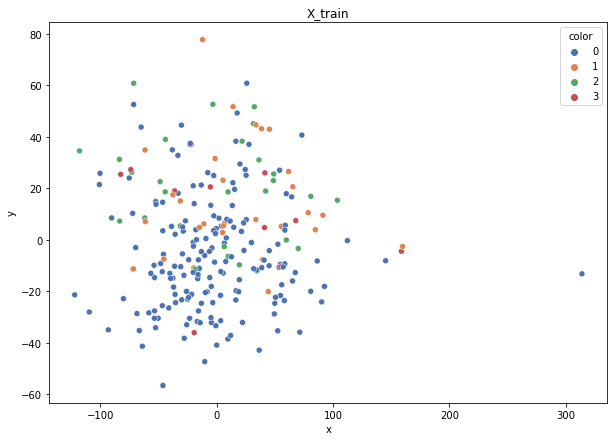

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 11})
Weights: {1: 0.20670586024536255, 0: 0.03425411398351722, 2: 0.21408821239698264, 3: 0.5449518133741377}


100%|██████████| 60/60 [00:00<00:00, 3299.61it/s]


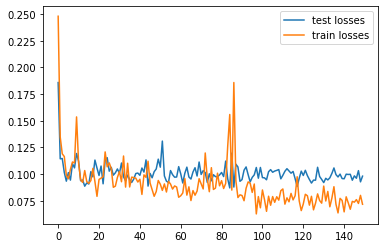

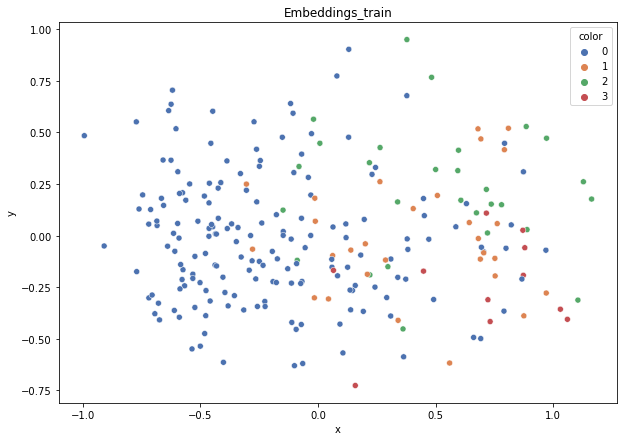

DT-f1-new-features: 0.309
DT-f1-old+new-features: 0.337
DT-f1-old-features: 0.238
DT-gmean-new-features: 0.076
DT-gmean-old+new-features: 0.09
DT-gmean-old-features: 0.018
KNN-f1-new-features: 0.366
KNN-f1-old+new-features: 0.316
KNN-f1-old-features: 0.316
KNN-gmean-new-features: 0.09
KNN-gmean-old+new-features: 0.076
KNN-gmean-old-features: 0.076
RF24-f1-new-features: 0.295
RF24-f1-old+new-features: 0.329
RF24-f1-old-features: 0.432
RF24-gmean-new-features: 0.065
RF24-gmean-old+new-features: 0.067
RF24-gmean-old-features: 0.104


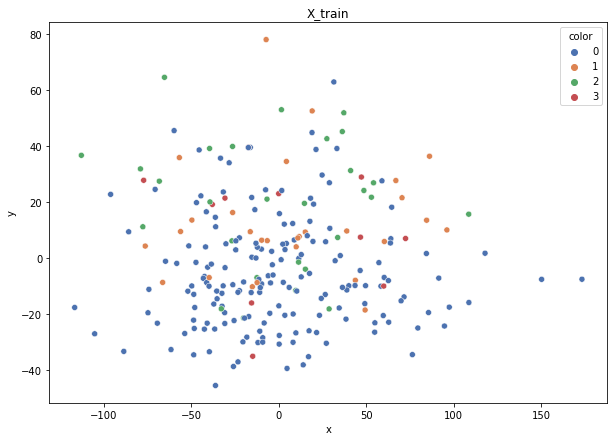

Class cardinalities: Counter({0: 176, 1: 28, 2: 28, 3: 11})
Weights: {0: 0.03381642512077295, 1: 0.21256038647342995, 2: 0.21256038647342995, 3: 0.5410628019323672}


100%|██████████| 60/60 [00:00<00:00, 3308.64it/s]


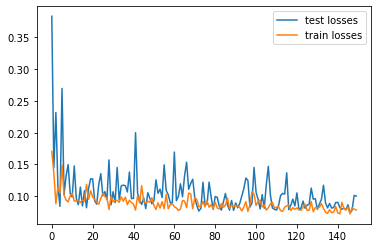

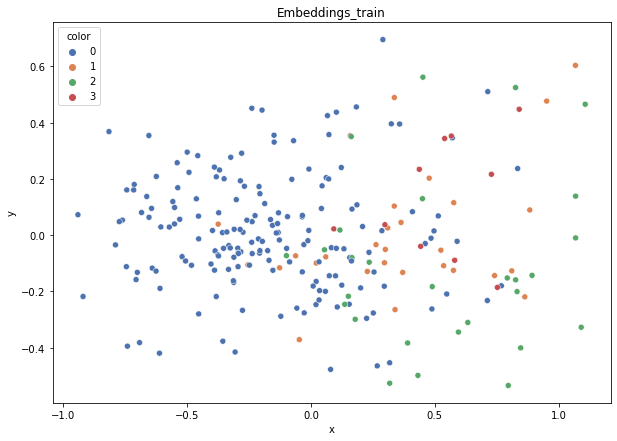

DT-f1-new-features: 0.394
DT-f1-old+new-features: 0.299
DT-f1-old-features: 0.335
DT-gmean-new-features: 0.381
DT-gmean-old+new-features: 0.078
DT-gmean-old-features: 0.092
KNN-f1-new-features: 0.31
KNN-f1-old+new-features: 0.323
KNN-f1-old-features: 0.323
KNN-gmean-new-features: 0.079
KNN-gmean-old+new-features: 0.087
KNN-gmean-old-features: 0.087
RF24-f1-new-features: 0.427
RF24-f1-old+new-features: 0.456
RF24-f1-old-features: 0.29
RF24-gmean-new-features: 0.387
RF24-gmean-old+new-features: 0.39
RF24-gmean-old-features: 0.022
glass


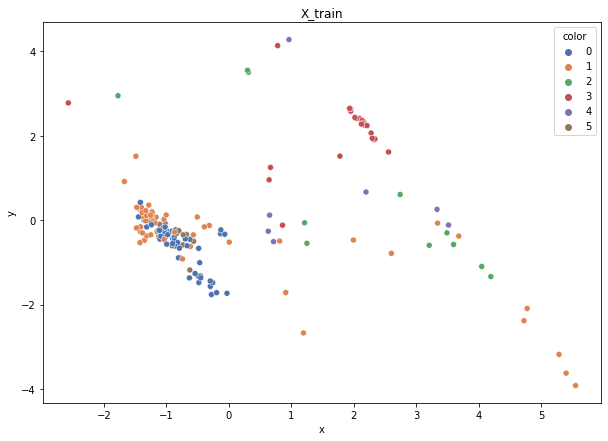

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 13, 2: 11, 4: 7})
Weights: {0: 0.04597401674853029, 1: 0.042205654719962245, 3: 0.1119367364312042, 5: 0.1980419183013613, 2: 0.2340495398106997, 4: 0.36779213398824234}


100%|██████████| 43/43 [00:00<00:00, 3197.78it/s]


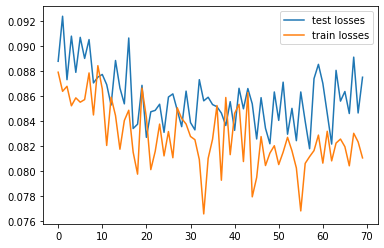

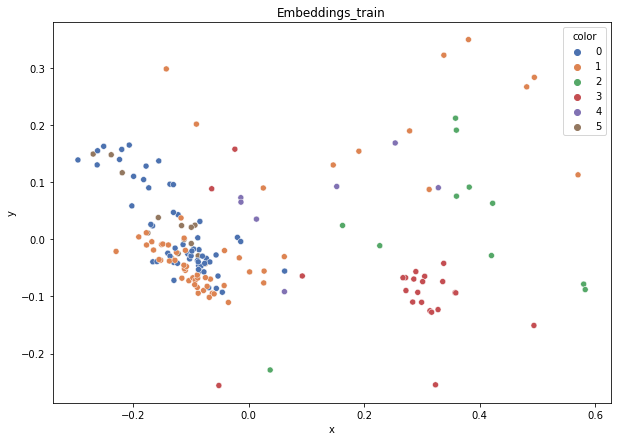

DT-f1-new-features: 0.507
DT-f1-old+new-features: 0.44
DT-f1-old-features: 0.709
DT-gmean-new-features: 0.217
DT-gmean-old+new-features: 0.17
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.814
KNN-f1-old+new-features: 0.718
KNN-f1-old-features: 0.718
KNN-gmean-new-features: 0.733
KNN-gmean-old+new-features: 0.698
KNN-gmean-old-features: 0.698
RF24-f1-new-features: 0.645
RF24-f1-old+new-features: 0.716
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.27
RF24-gmean-old+new-features: 0.673
RF24-gmean-old-features: 0.731


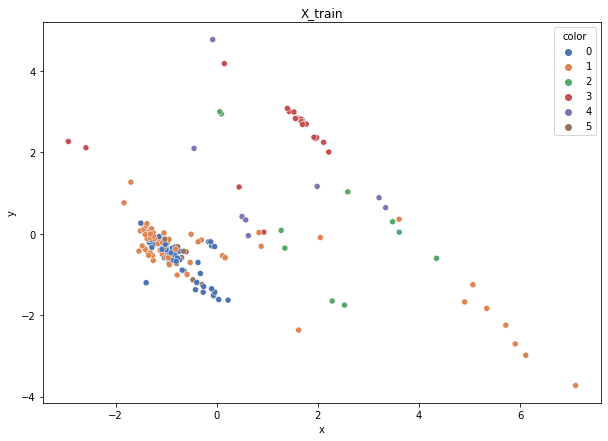

Class cardinalities: Counter({1: 60, 0: 56, 3: 24, 5: 13, 2: 10, 4: 8})
Weights: {5: 0.2034390893678857, 4: 0.33058852022281426, 1: 0.0440784693630419, 0: 0.047226931460402036, 3: 0.11019617340760475, 2: 0.2644708161782514}


100%|██████████| 43/43 [00:00<00:00, 3386.00it/s]


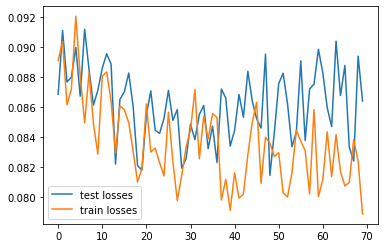

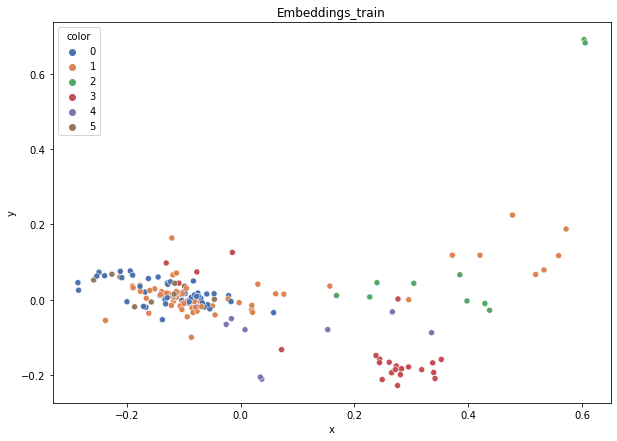

DT-f1-new-features: 0.552
DT-f1-old+new-features: 0.4
DT-f1-old-features: 0.53
DT-gmean-new-features: 0.258
DT-gmean-old+new-features: 0.072
DT-gmean-old-features: 0.232
KNN-f1-new-features: 0.584
KNN-f1-old+new-features: 0.69
KNN-f1-old-features: 0.69
KNN-gmean-new-features: 0.245
KNN-gmean-old+new-features: 0.733
KNN-gmean-old-features: 0.733
RF24-f1-new-features: 0.678
RF24-f1-old+new-features: 0.69
RF24-f1-old-features: 0.652
RF24-gmean-new-features: 0.7
RF24-gmean-old+new-features: 0.681
RF24-gmean-old-features: 0.279


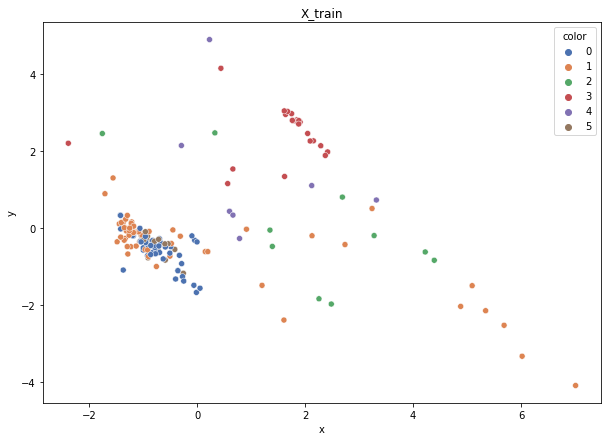

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 3278.53it/s]


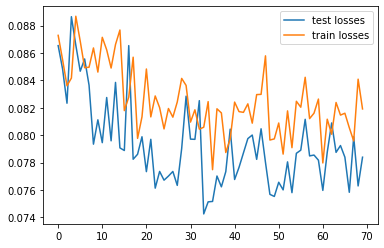

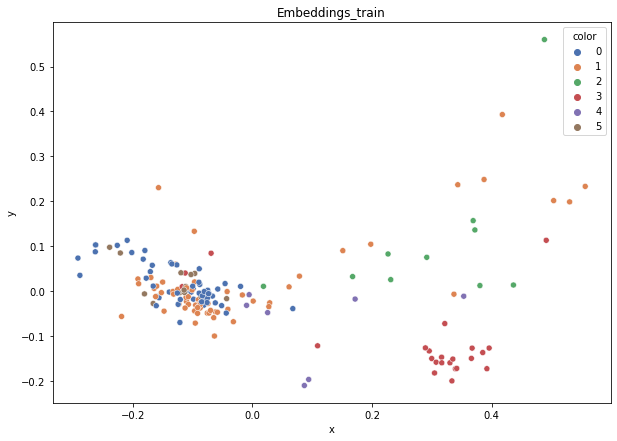

DT-f1-new-features: 0.583
DT-f1-old+new-features: 0.624
DT-f1-old-features: 0.607
DT-gmean-new-features: 0.574
DT-gmean-old+new-features: 0.257
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.674
KNN-f1-old+new-features: 0.654
KNN-f1-old-features: 0.654
KNN-gmean-new-features: 0.257
KNN-gmean-old+new-features: 0.249
KNN-gmean-old-features: 0.249
RF24-f1-new-features: 0.581
RF24-f1-old+new-features: 0.669
RF24-f1-old-features: 0.731
RF24-gmean-new-features: 0.229
RF24-gmean-old+new-features: 0.265
RF24-gmean-old-features: 0.281


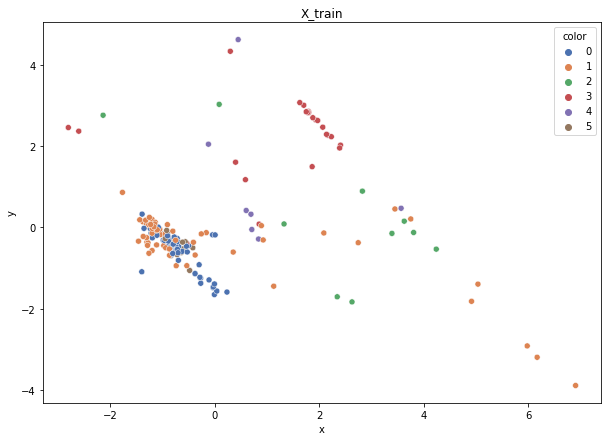

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 3274.12it/s]


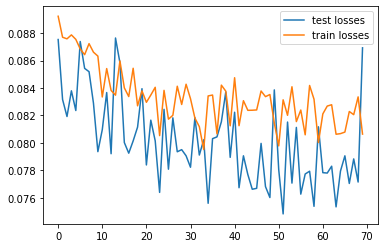

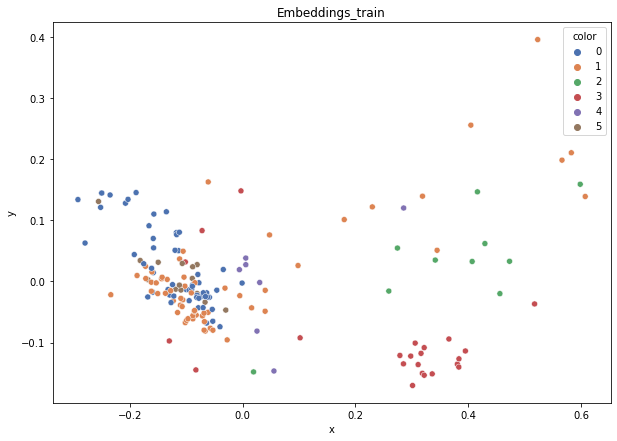

DT-f1-new-features: 0.644
DT-f1-old+new-features: 0.527
DT-f1-old-features: 0.641
DT-gmean-new-features: 0.613
DT-gmean-old+new-features: 0.224
DT-gmean-old-features: 0.681
KNN-f1-new-features: 0.54
KNN-f1-old+new-features: 0.526
KNN-f1-old-features: 0.522
KNN-gmean-new-features: 0.087
KNN-gmean-old+new-features: 0.088
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.655
RF24-f1-old+new-features: 0.739
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.609
RF24-gmean-old+new-features: 0.687
RF24-gmean-old-features: 0.748


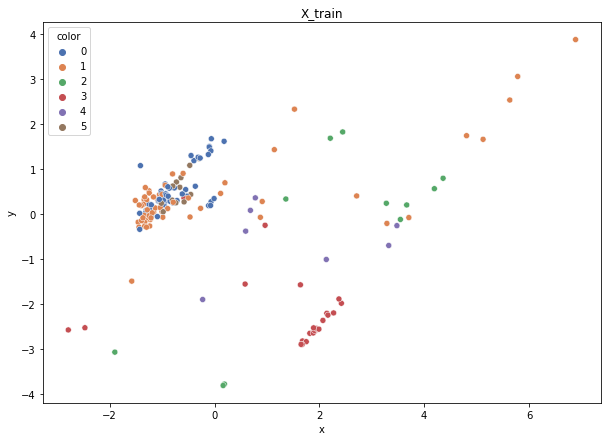

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 11, 4: 7})
Weights: {0: 0.04663368999308034, 5: 0.18653475997232136, 4: 0.3730695199446427, 1: 0.04281125638709015, 3: 0.11354289737445648, 2: 0.237407876328409}


100%|██████████| 42/42 [00:00<00:00, 3299.14it/s]


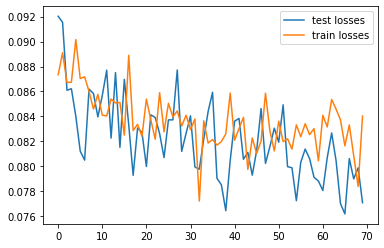

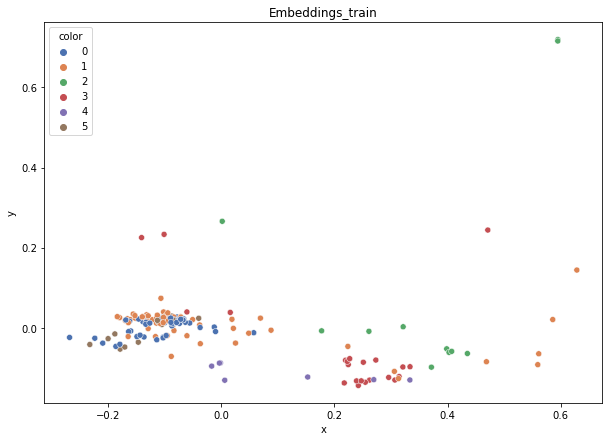

DT-f1-new-features: 0.588
DT-f1-old+new-features: 0.809
DT-f1-old-features: 0.73
DT-gmean-new-features: 0.244
DT-gmean-old+new-features: 0.814
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.736
KNN-f1-old+new-features: 0.705
KNN-f1-old-features: 0.705
KNN-gmean-new-features: 0.693
KNN-gmean-old+new-features: 0.714
KNN-gmean-old-features: 0.714
RF24-f1-new-features: 0.594
RF24-f1-old+new-features: 0.8
RF24-f1-old-features: 0.857
RF24-gmean-new-features: 0.25
RF24-gmean-old+new-features: 0.839
RF24-gmean-old-features: 0.865
new_ecoli


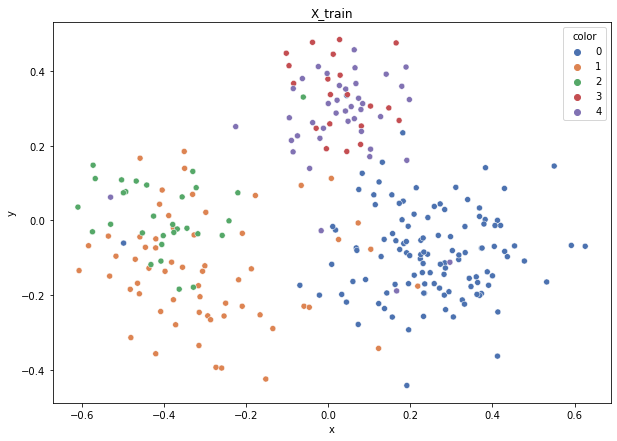

Class cardinalities: Counter({0: 116, 1: 61, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.0649452946471851, 1: 0.1235025275257946, 2: 0.2511218059691157, 3: 0.37668270895367356, 4: 0.183747662904231}


100%|██████████| 68/68 [00:00<00:00, 3370.75it/s]


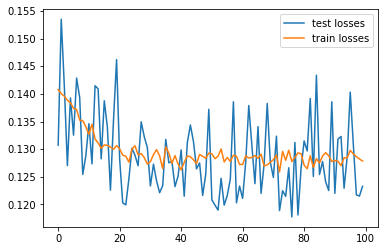

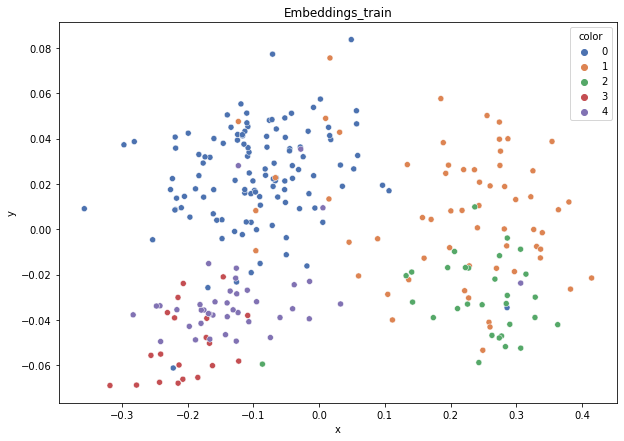

DT-f1-new-features: 0.816
DT-f1-old+new-features: 0.67
DT-f1-old-features: 0.634
DT-gmean-new-features: 0.816
DT-gmean-old+new-features: 0.613
DT-gmean-old-features: 0.537
KNN-f1-new-features: 0.758
KNN-f1-old+new-features: 0.819
KNN-f1-old-features: 0.738
KNN-gmean-new-features: 0.74
KNN-gmean-old+new-features: 0.812
KNN-gmean-old-features: 0.704
RF24-f1-new-features: 0.806
RF24-f1-old+new-features: 0.812
RF24-f1-old-features: 0.812
RF24-gmean-new-features: 0.808
RF24-gmean-old+new-features: 0.808
RF24-gmean-old-features: 0.802


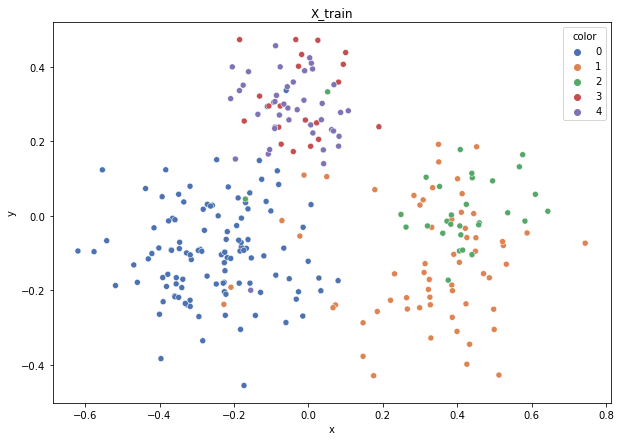

Class cardinalities: Counter({0: 116, 1: 61, 4: 42, 2: 30, 3: 20})
Weights: {0: 0.06523067522150933, 1: 0.12404521845401774, 2: 0.25222527752316937, 3: 0.3783379162847541, 4: 0.18016091251654956}


100%|██████████| 67/67 [00:00<00:00, 3381.32it/s]


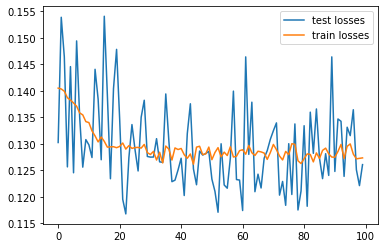

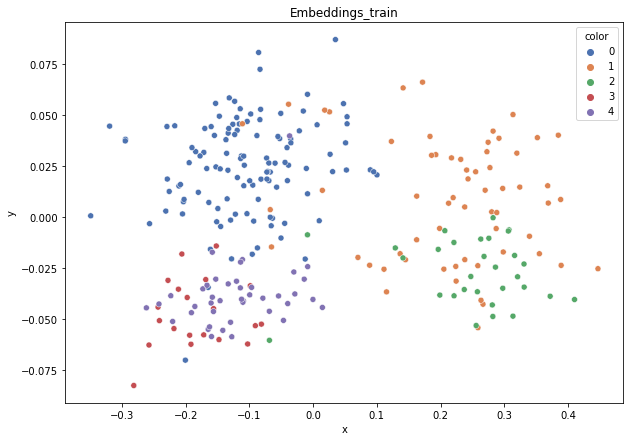

DT-f1-new-features: 0.756
DT-f1-old+new-features: 0.758
DT-f1-old-features: 0.707
DT-gmean-new-features: 0.728
DT-gmean-old+new-features: 0.73
DT-gmean-old-features: 0.688
KNN-f1-new-features: 0.765
KNN-f1-old+new-features: 0.669
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.738
KNN-gmean-old+new-features: 0.644
KNN-gmean-old-features: 0.644
RF24-f1-new-features: 0.79
RF24-f1-old+new-features: 0.826
RF24-f1-old-features: 0.841
RF24-gmean-new-features: 0.775
RF24-gmean-old+new-features: 0.817
RF24-gmean-old-features: 0.829


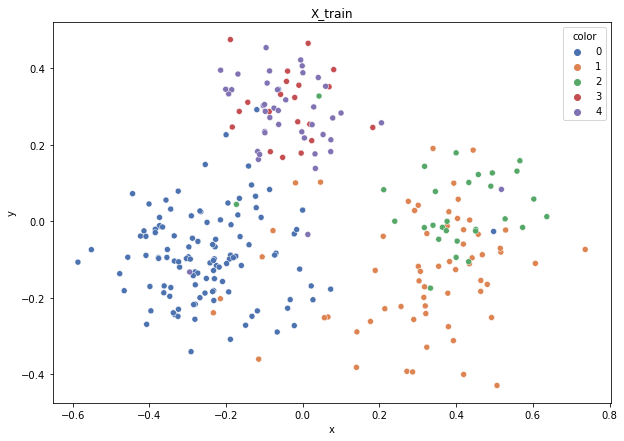

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 3492.73it/s]


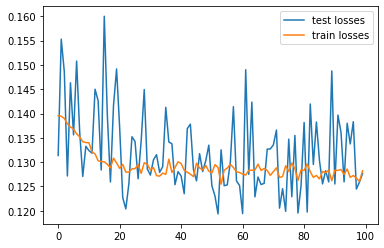

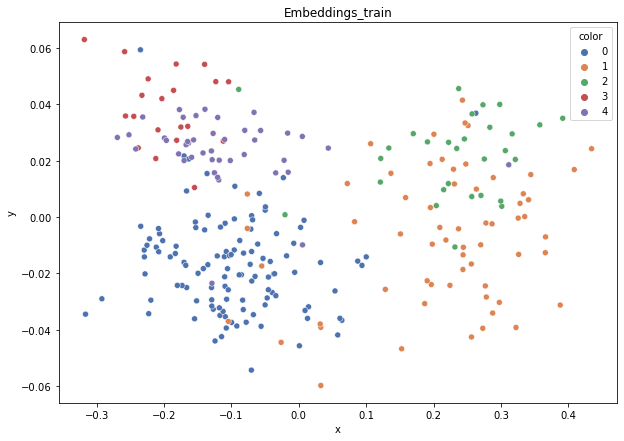

DT-f1-new-features: 0.729
DT-f1-old+new-features: 0.812
DT-f1-old-features: 0.775
DT-gmean-new-features: 0.74
DT-gmean-old+new-features: 0.785
DT-gmean-old-features: 0.765
KNN-f1-new-features: 0.848
KNN-f1-old+new-features: 0.862
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.827
KNN-gmean-old+new-features: 0.815
KNN-gmean-old-features: 0.815
RF24-f1-new-features: 0.792
RF24-f1-old+new-features: 0.907
RF24-f1-old-features: 0.879
RF24-gmean-new-features: 0.806
RF24-gmean-old+new-features: 0.884
RF24-gmean-old-features: 0.846


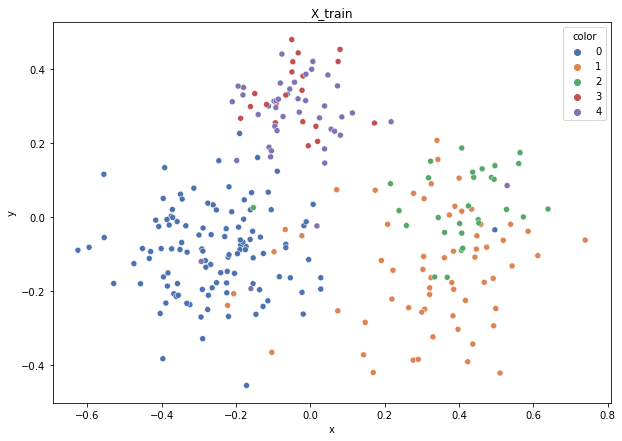

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 3383.03it/s]


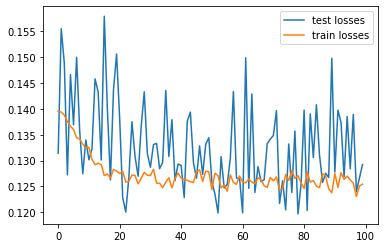

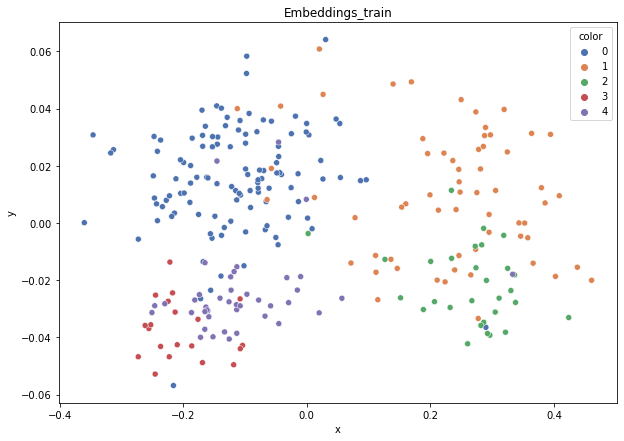

DT-f1-new-features: 0.557
DT-f1-old+new-features: 0.708
DT-f1-old-features: 0.649
DT-gmean-new-features: 0.564
DT-gmean-old+new-features: 0.691
DT-gmean-old-features: 0.606
KNN-f1-new-features: 0.681
KNN-f1-old+new-features: 0.722
KNN-f1-old-features: 0.736
KNN-gmean-new-features: 0.599
KNN-gmean-old+new-features: 0.662
KNN-gmean-old-features: 0.705
RF24-f1-new-features: 0.677
RF24-f1-old+new-features: 0.797
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.658
RF24-gmean-old+new-features: 0.77
RF24-gmean-old-features: 0.719


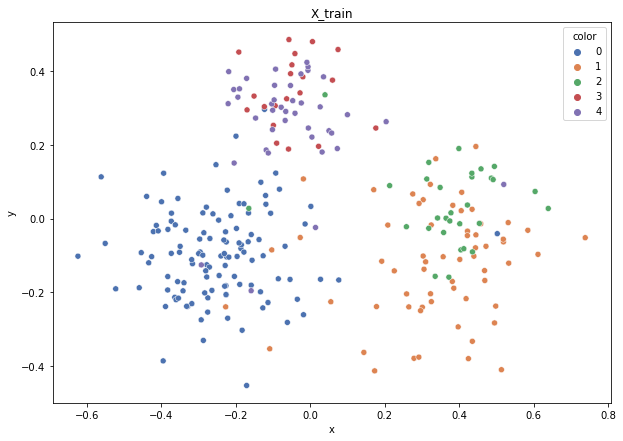

Class cardinalities: Counter({0: 116, 1: 62, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.06507492234699798, 1: 0.12175308052018977, 2: 0.25162303307505884, 3: 0.3774345496125883, 4: 0.18411441444516502}


100%|██████████| 67/67 [00:00<00:00, 3426.01it/s]


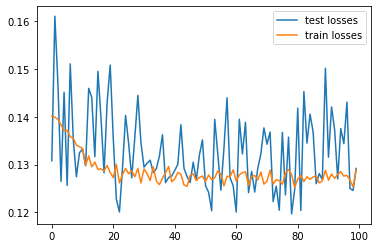

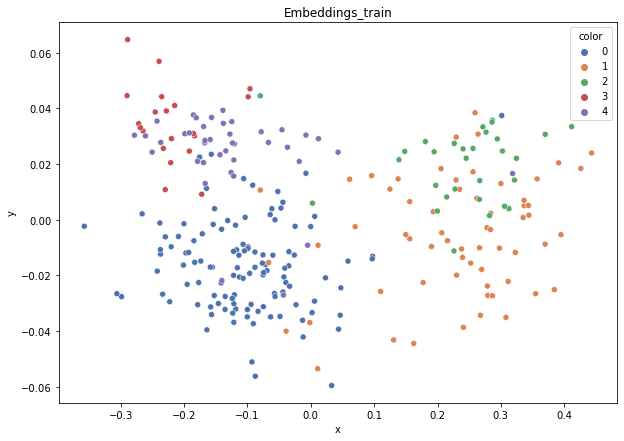

DT-f1-new-features: 0.762
DT-f1-old+new-features: 0.713
DT-f1-old-features: 0.775
DT-gmean-new-features: 0.781
DT-gmean-old+new-features: 0.689
DT-gmean-old-features: 0.807
KNN-f1-new-features: 0.657
KNN-f1-old+new-features: 0.801
KNN-f1-old-features: 0.843
KNN-gmean-new-features: 0.625
KNN-gmean-old+new-features: 0.807
KNN-gmean-old-features: 0.858
RF24-f1-new-features: 0.761
RF24-f1-old+new-features: 0.882
RF24-f1-old-features: 0.887
RF24-gmean-new-features: 0.753
RF24-gmean-old+new-features: 0.896
RF24-gmean-old-features: 0.876
new_led7digit


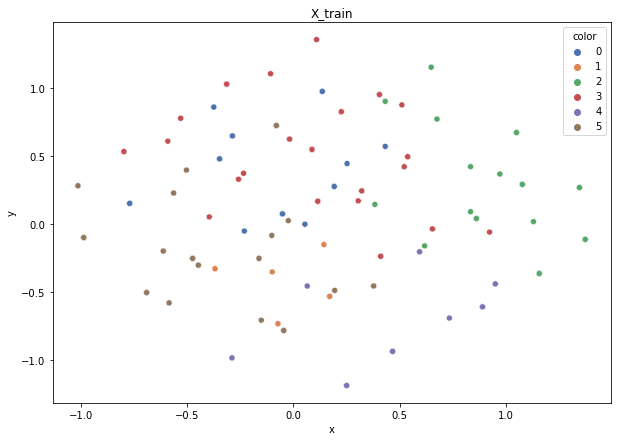

Class cardinalities: Counter({3: 87, 5: 79, 0: 78, 2: 75, 4: 41, 1: 40})
Weights: {0: 0.12859532399632337, 2: 0.1337391369561763, 3: 0.11529235944497956, 4: 0.24464476272471275, 5: 0.1269675350849775, 1: 0.25076088179283057}


100%|██████████| 100/100 [00:00<00:00, 3380.95it/s]


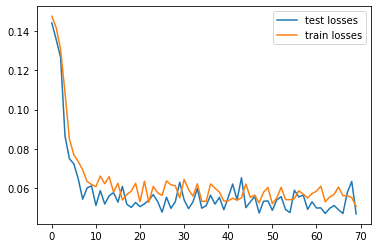

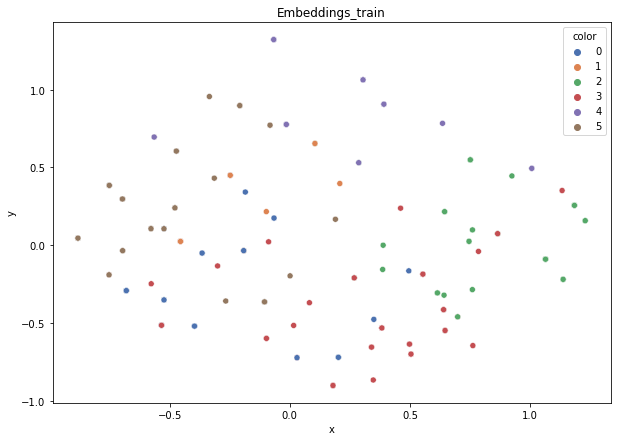

DT-f1-new-features: 0.759
DT-f1-old+new-features: 0.769
DT-f1-old-features: 0.789
DT-gmean-new-features: 0.76
DT-gmean-old+new-features: 0.77
DT-gmean-old-features: 0.797
KNN-f1-new-features: 0.675
KNN-f1-old+new-features: 0.654
KNN-f1-old-features: 0.674
KNN-gmean-new-features: 0.661
KNN-gmean-old+new-features: 0.647
KNN-gmean-old-features: 0.658
RF24-f1-new-features: 0.736
RF24-f1-old+new-features: 0.734
RF24-f1-old-features: 0.796
RF24-gmean-new-features: 0.712
RF24-gmean-old+new-features: 0.712
RF24-gmean-old-features: 0.797


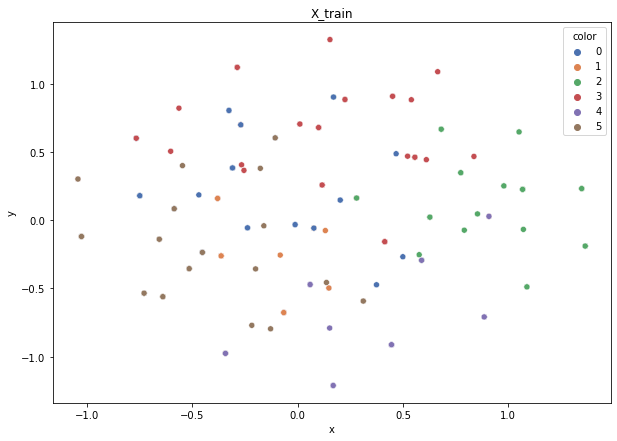

Class cardinalities: Counter({3: 87, 5: 80, 0: 78, 2: 75, 4: 41, 1: 39})
Weights: {0: 0.1279755802357915, 2: 0.13309460344522317, 3: 0.114736727107951, 4: 0.2434657380095546, 5: 0.12477619072989674, 1: 0.255951160471583}


100%|██████████| 100/100 [00:00<00:00, 3563.80it/s]


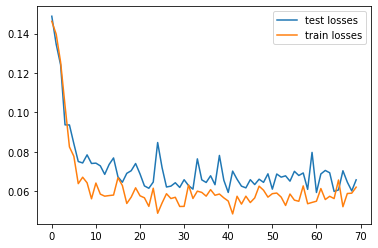

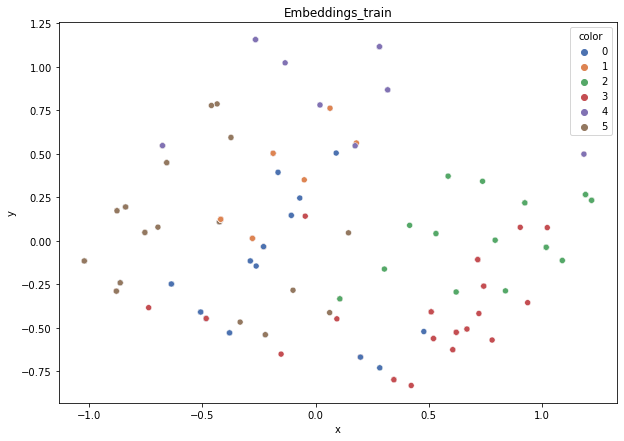

DT-f1-new-features: 0.751
DT-f1-old+new-features: 0.751
DT-f1-old-features: 0.779
DT-gmean-new-features: 0.725
DT-gmean-old+new-features: 0.724
DT-gmean-old-features: 0.755
KNN-f1-new-features: 0.732
KNN-f1-old+new-features: 0.721
KNN-f1-old-features: 0.592
KNN-gmean-new-features: 0.703
KNN-gmean-old+new-features: 0.692
KNN-gmean-old-features: 0.236
RF24-f1-new-features: 0.709
RF24-f1-old+new-features: 0.739
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.671
RF24-gmean-old+new-features: 0.699
RF24-gmean-old-features: 0.735


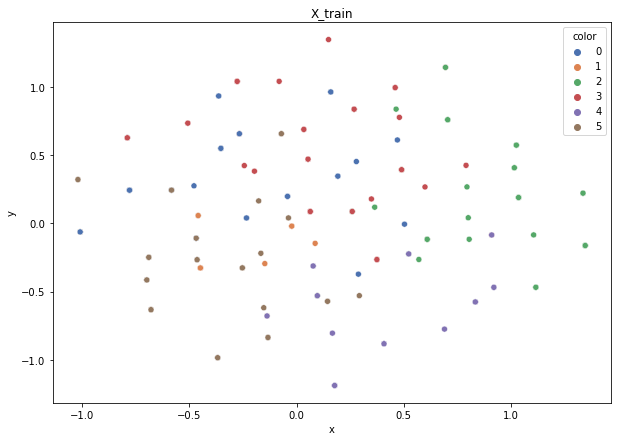

Class cardinalities: Counter({3: 86, 5: 79, 0: 78, 2: 76, 4: 42, 1: 39})
Weights: {0: 0.12857143873483481, 2: 0.1319548976489094, 3: 0.11661130489903622, 4: 0.23877552907897892, 5: 0.12694395216857107, 1: 0.25714287746966963}


100%|██████████| 100/100 [00:00<00:00, 3383.46it/s]


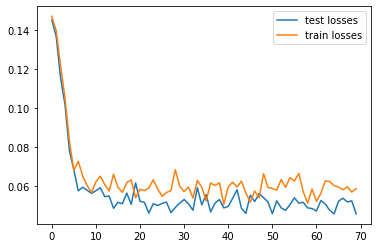

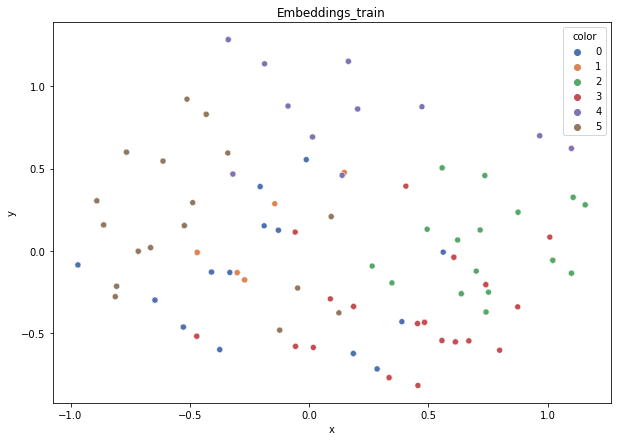

DT-f1-new-features: 0.766
DT-f1-old+new-features: 0.783
DT-f1-old-features: 0.782
DT-gmean-new-features: 0.769
DT-gmean-old+new-features: 0.785
DT-gmean-old-features: 0.783
KNN-f1-new-features: 0.713
KNN-f1-old+new-features: 0.699
KNN-f1-old-features: 0.768
KNN-gmean-new-features: 0.652
KNN-gmean-old+new-features: 0.66
KNN-gmean-old-features: 0.743
RF24-f1-new-features: 0.767
RF24-f1-old+new-features: 0.757
RF24-f1-old-features: 0.793
RF24-gmean-new-features: 0.769
RF24-gmean-old+new-features: 0.752
RF24-gmean-old-features: 0.793


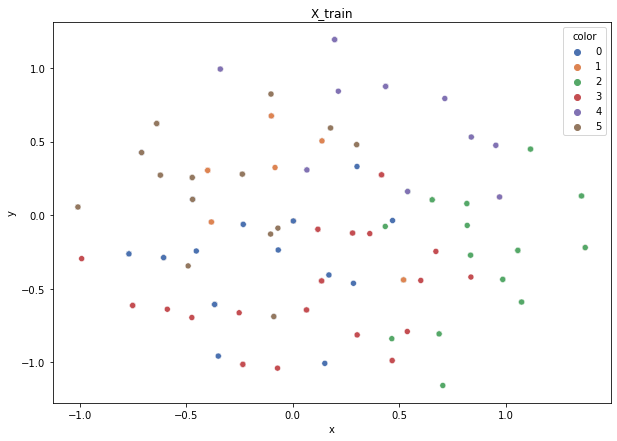

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 3413.00it/s]


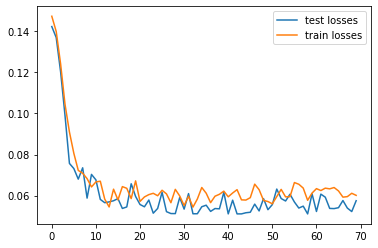

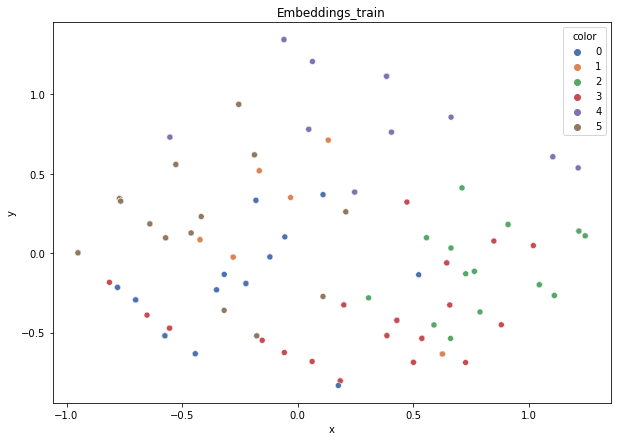

DT-f1-new-features: 0.707
DT-f1-old+new-features: 0.745
DT-f1-old-features: 0.716
DT-gmean-new-features: 0.692
DT-gmean-old+new-features: 0.726
DT-gmean-old-features: 0.698
KNN-f1-new-features: 0.769
KNN-f1-old+new-features: 0.734
KNN-f1-old-features: 0.615
KNN-gmean-new-features: 0.764
KNN-gmean-old+new-features: 0.72
KNN-gmean-old-features: 0.57
RF24-f1-new-features: 0.7
RF24-f1-old+new-features: 0.725
RF24-f1-old-features: 0.763
RF24-gmean-new-features: 0.676
RF24-gmean-old+new-features: 0.703
RF24-gmean-old-features: 0.751


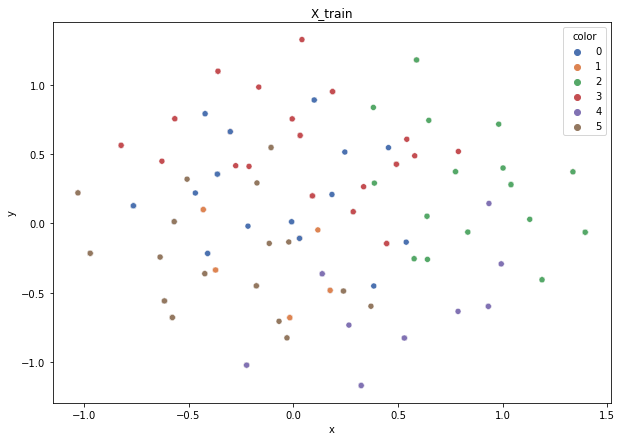

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 3474.00it/s]


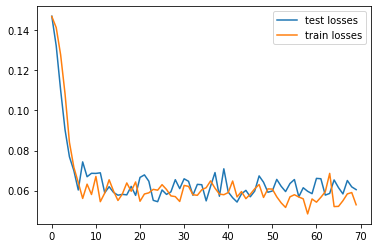

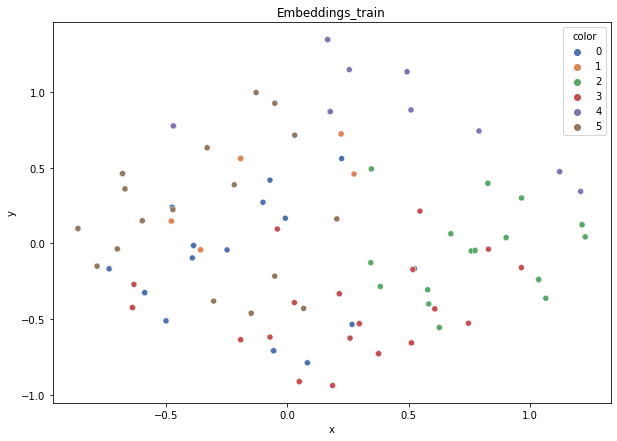

DT-f1-new-features: 0.765
DT-f1-old+new-features: 0.775
DT-f1-old-features: 0.802
DT-gmean-new-features: 0.768
DT-gmean-old+new-features: 0.777
DT-gmean-old-features: 0.806
KNN-f1-new-features: 0.651
KNN-f1-old+new-features: 0.773
KNN-f1-old-features: 0.718
KNN-gmean-new-features: 0.544
KNN-gmean-old+new-features: 0.772
KNN-gmean-old-features: 0.719
RF24-f1-new-features: 0.793
RF24-f1-old+new-features: 0.802
RF24-f1-old-features: 0.802
RF24-gmean-new-features: 0.797
RF24-gmean-old+new-features: 0.806
RF24-gmean-old-features: 0.806
new_winequality-red


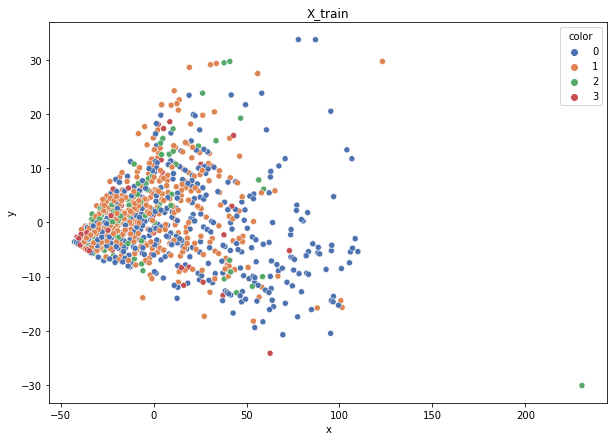

Class cardinalities: Counter({0: 544, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07217510080141348, 1: 0.07683611513888246, 2: 0.246938709660182, 3: 0.6040500743995221}


100%|██████████| 320/320 [00:00<00:00, 3507.75it/s]


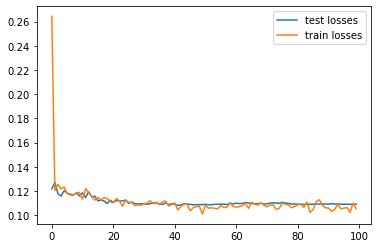

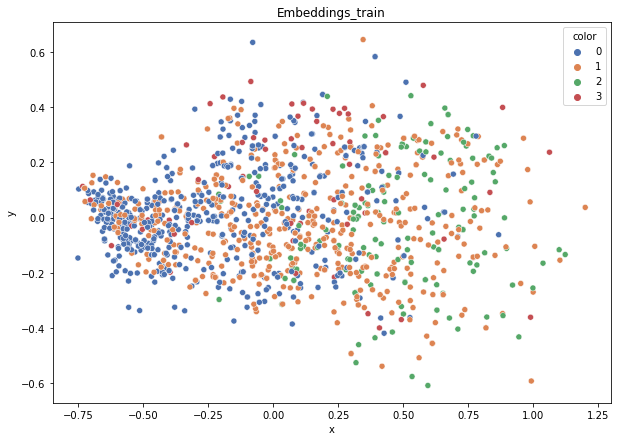

DT-f1-new-features: 0.462
DT-f1-old+new-features: 0.518
DT-f1-old-features: 0.52
DT-gmean-new-features: 0.39
DT-gmean-old+new-features: 0.469
DT-gmean-old-features: 0.438
KNN-f1-new-features: 0.475
KNN-f1-old+new-features: 0.455
KNN-f1-old-features: 0.453
KNN-gmean-new-features: 0.35
KNN-gmean-old+new-features: 0.338
KNN-gmean-old-features: 0.337
RF24-f1-new-features: 0.499
RF24-f1-old+new-features: 0.581
RF24-f1-old-features: 0.584
RF24-gmean-new-features: 0.357
RF24-gmean-old+new-features: 0.4
RF24-gmean-old-features: 0.403


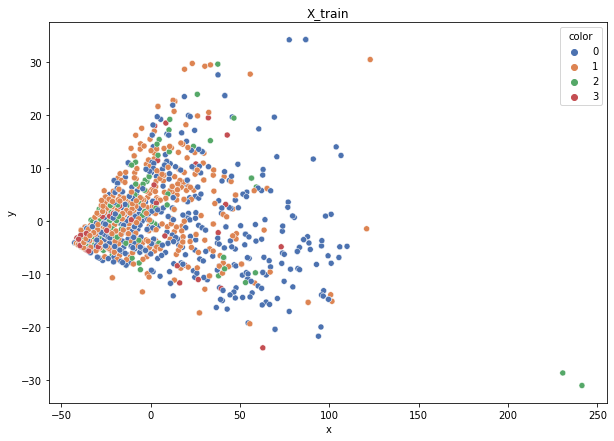

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 3492.27it/s]


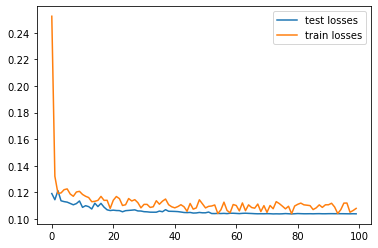

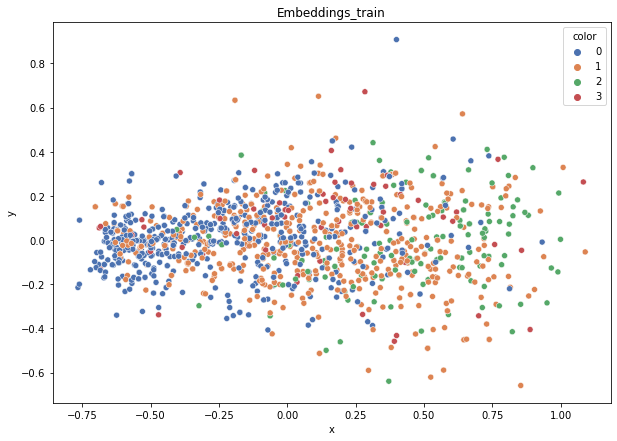

DT-f1-new-features: 0.464
DT-f1-old+new-features: 0.512
DT-f1-old-features: 0.503
DT-gmean-new-features: 0.462
DT-gmean-old+new-features: 0.49
DT-gmean-old-features: 0.479
KNN-f1-new-features: 0.497
KNN-f1-old+new-features: 0.492
KNN-f1-old-features: 0.486
KNN-gmean-new-features: 0.405
KNN-gmean-old+new-features: 0.437
KNN-gmean-old-features: 0.431
RF24-f1-new-features: 0.523
RF24-f1-old+new-features: 0.578
RF24-f1-old-features: 0.556
RF24-gmean-new-features: 0.366
RF24-gmean-old+new-features: 0.449
RF24-gmean-old-features: 0.435


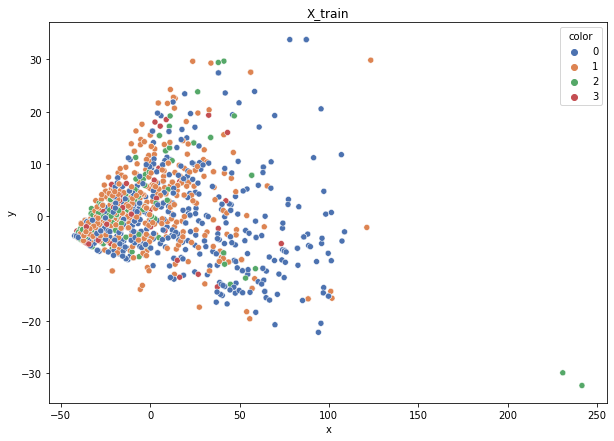

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 3528.80it/s]


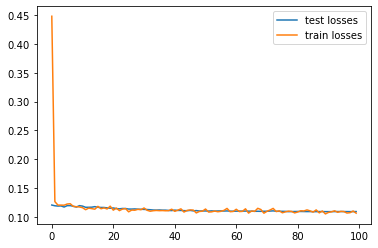

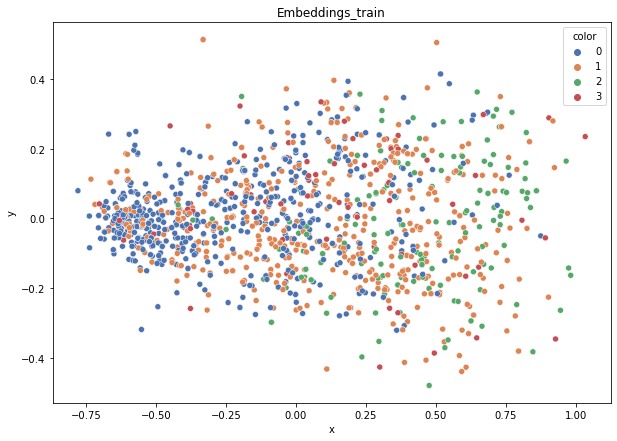

DT-f1-new-features: 0.424
DT-f1-old+new-features: 0.497
DT-f1-old-features: 0.512
DT-gmean-new-features: 0.327
DT-gmean-old+new-features: 0.466
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.478
KNN-f1-old+new-features: 0.491
KNN-f1-old-features: 0.488
KNN-gmean-new-features: 0.409
KNN-gmean-old+new-features: 0.416
KNN-gmean-old-features: 0.415
RF24-f1-new-features: 0.474
RF24-f1-old+new-features: 0.506
RF24-f1-old-features: 0.512
RF24-gmean-new-features: 0.129
RF24-gmean-old+new-features: 0.135
RF24-gmean-old-features: 0.137


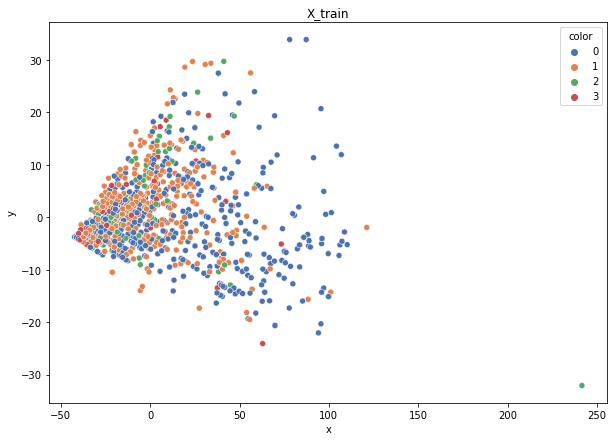

Class cardinalities: Counter({0: 545, 1: 510, 2: 160, 3: 64})
Weights: {0: 0.07147706120661339, 2: 0.24346873973502686, 3: 0.6086718493375671, 1: 0.07638234972079273}


100%|██████████| 320/320 [00:00<00:00, 3503.42it/s]


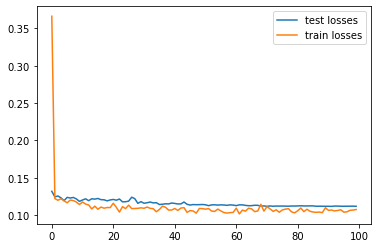

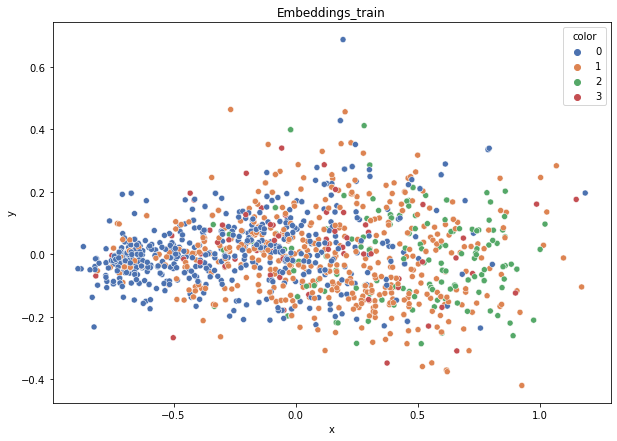

DT-f1-new-features: 0.385
DT-f1-old+new-features: 0.466
DT-f1-old-features: 0.434
DT-gmean-new-features: 0.33
DT-gmean-old+new-features: 0.453
DT-gmean-old-features: 0.398
KNN-f1-new-features: 0.411
KNN-f1-old+new-features: 0.47
KNN-f1-old-features: 0.461
KNN-gmean-new-features: 0.349
KNN-gmean-old+new-features: 0.43
KNN-gmean-old-features: 0.422
RF24-f1-new-features: 0.465
RF24-f1-old+new-features: 0.499
RF24-f1-old-features: 0.511
RF24-gmean-new-features: 0.374
RF24-gmean-old+new-features: 0.39
RF24-gmean-old-features: 0.4


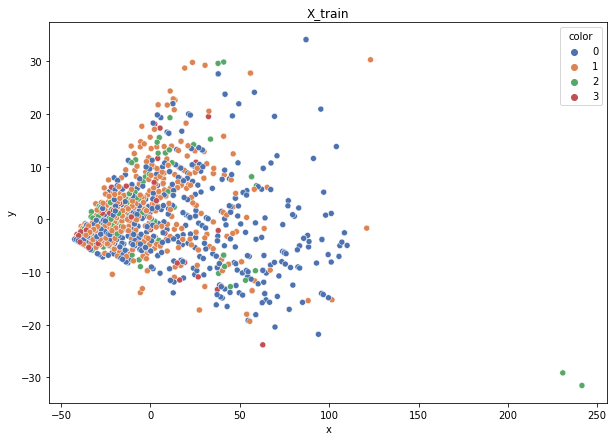

Class cardinalities: Counter({0: 545, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07205221139741194, 1: 0.07684629199919668, 2: 0.24697141642509127, 3: 0.6041300801783002}


100%|██████████| 319/319 [00:00<00:00, 3517.32it/s]


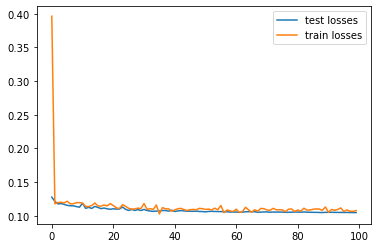

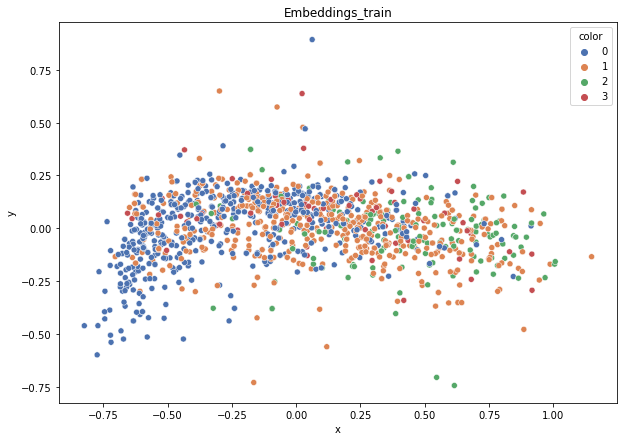

DT-f1-new-features: 0.453
DT-f1-old+new-features: 0.453
DT-f1-old-features: 0.461
DT-gmean-new-features: 0.428
DT-gmean-old+new-features: 0.4
DT-gmean-old-features: 0.398
KNN-f1-new-features: 0.467
KNN-f1-old+new-features: 0.508
KNN-f1-old-features: 0.507
KNN-gmean-new-features: 0.39
KNN-gmean-old+new-features: 0.415
KNN-gmean-old-features: 0.415
RF24-f1-new-features: 0.508
RF24-f1-old+new-features: 0.587
RF24-f1-old-features: 0.614
RF24-gmean-new-features: 0.414
RF24-gmean-old+new-features: 0.496
RF24-gmean-old-features: 0.479
thyroid-newthyroid


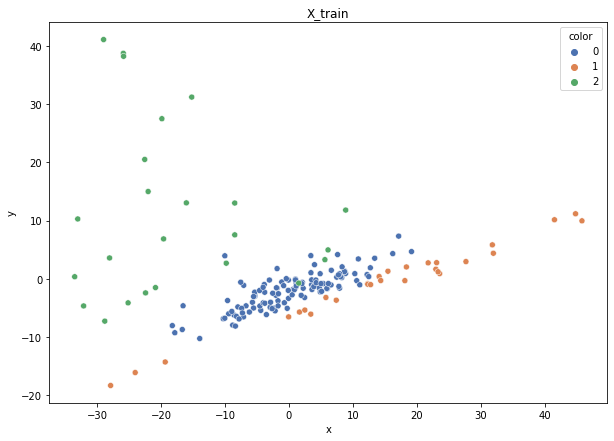

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3380.60it/s]


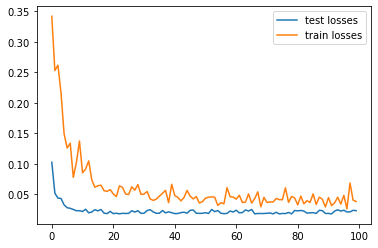

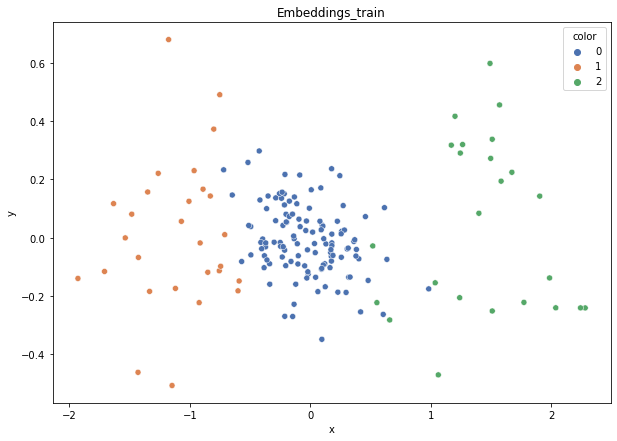

DT-f1-new-features: 0.933
DT-f1-old+new-features: 0.892
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.894
DT-gmean-old+new-features: 0.83
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.933
KNN-f1-old+new-features: 0.933
KNN-f1-old-features: 0.933
KNN-gmean-new-features: 0.894
KNN-gmean-old+new-features: 0.93
KNN-gmean-old-features: 0.93
RF24-f1-new-features: 0.969
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.95
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.894


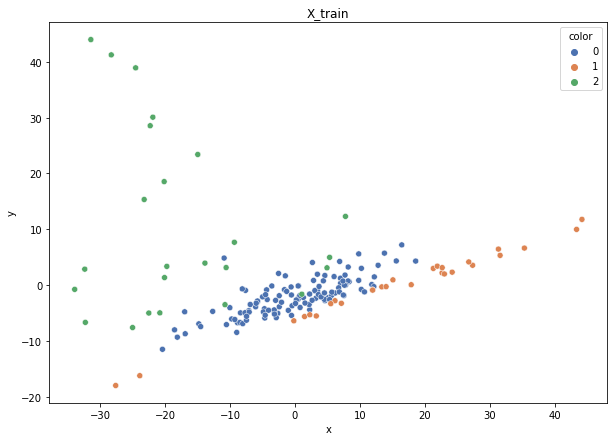

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3308.11it/s]


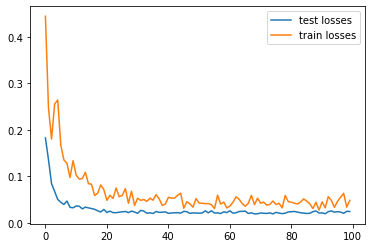

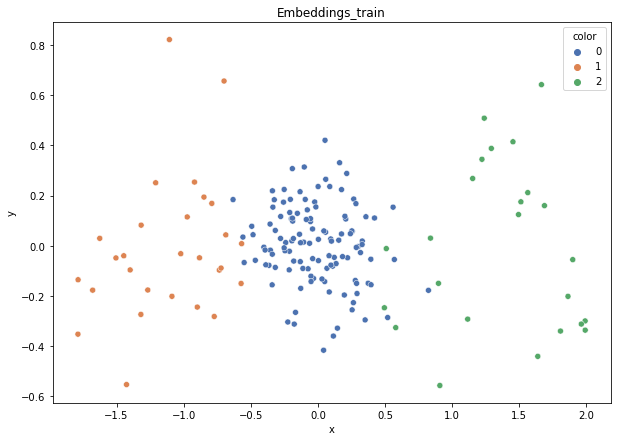

DT-f1-new-features: 0.916
DT-f1-old+new-features: 0.916
DT-f1-old-features: 0.947
DT-gmean-new-features: 0.928
DT-gmean-old+new-features: 0.928
DT-gmean-old-features: 0.977
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 1.0
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 1.0
RF24-f1-new-features: 0.916
RF24-f1-old+new-features: 0.916
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.928
RF24-gmean-old+new-features: 0.928
RF24-gmean-old-features: 0.95


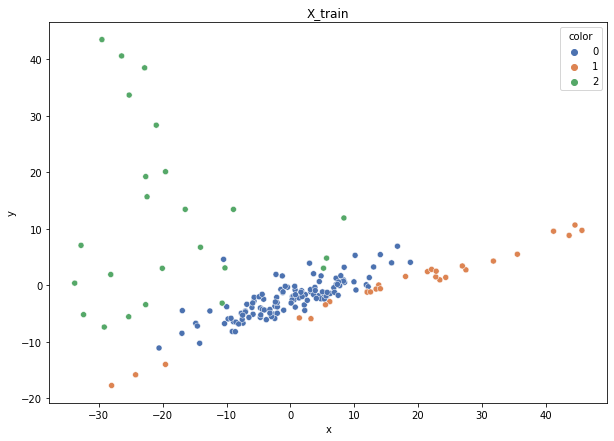

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3336.20it/s]


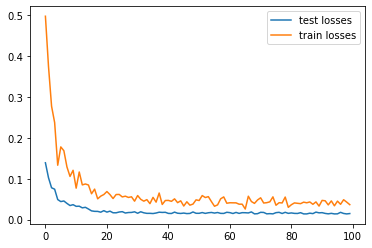

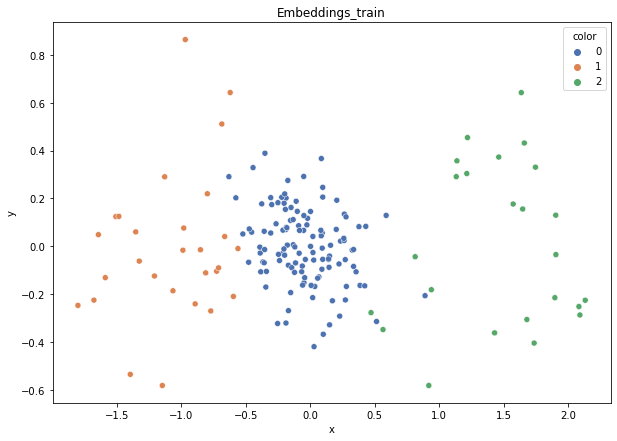

DT-f1-new-features: 0.972
DT-f1-old+new-features: 0.972
DT-f1-old-features: 0.905
DT-gmean-new-features: 0.989
DT-gmean-old+new-features: 0.989
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.964
KNN-f1-old+new-features: 0.893
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.941
KNN-gmean-old+new-features: 0.864
KNN-gmean-old-features: 0.821
RF24-f1-new-features: 0.936
RF24-f1-old+new-features: 0.936
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.93
RF24-gmean-old+new-features: 0.93
RF24-gmean-old-features: 0.894


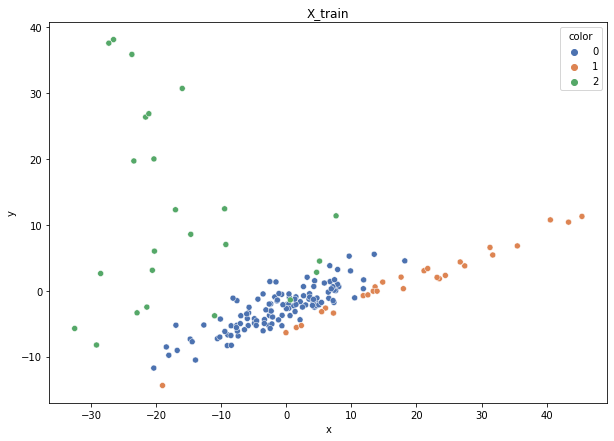

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3402.35it/s]


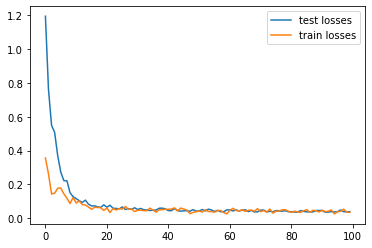

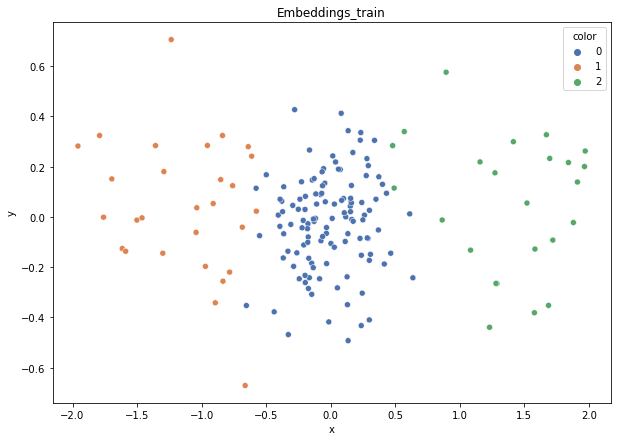

DT-f1-new-features: 0.941
DT-f1-old+new-features: 0.941
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.977
DT-gmean-old+new-features: 0.977
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.941
KNN-f1-old+new-features: 0.906
KNN-f1-old-features: 0.906
KNN-gmean-new-features: 0.977
KNN-gmean-old+new-features: 0.92
KNN-gmean-old-features: 0.92
RF24-f1-new-features: 0.941
RF24-f1-old+new-features: 0.941
RF24-f1-old-features: 0.902
RF24-gmean-new-features: 0.977
RF24-gmean-old+new-features: 0.977
RF24-gmean-old-features: 0.884


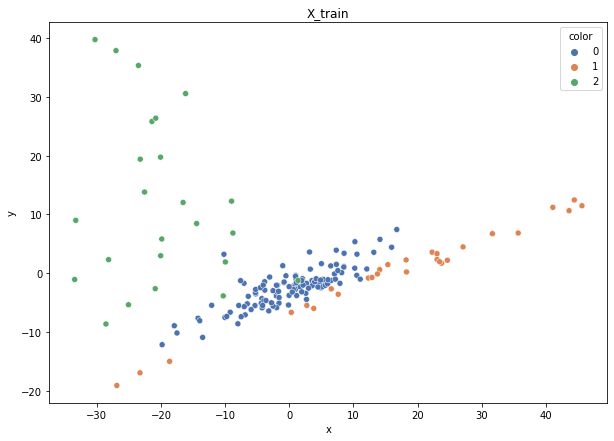

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3356.19it/s]


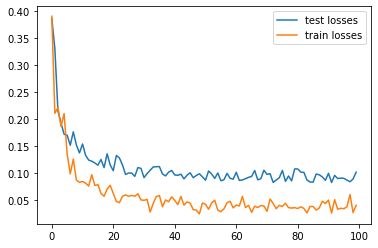

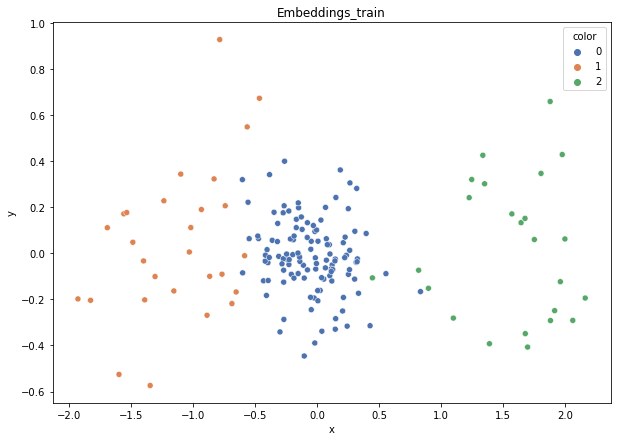

DT-f1-new-features: 0.972
DT-f1-old+new-features: 0.972
DT-f1-old-features: 0.893
DT-gmean-new-features: 0.989
DT-gmean-old+new-features: 0.989
DT-gmean-old-features: 0.864
KNN-f1-new-features: 0.873
KNN-f1-old+new-features: 0.873
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.794
KNN-gmean-old+new-features: 0.794
KNN-gmean-old-features: 0.794
RF24-f1-new-features: 0.895
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.864
RF24-gmean-old+new-features: 0.874
RF24-gmean-old-features: 0.874


In [26]:
result_dict = defaultdict(list)

if test_all_ds:
    ds_names = dt_name_to_cols_to_encode.keys()
else:
    ds_names = [ds_name]
for dataset_name in ds_names:
# for dataset_name in list(datasets.keys()):
    print(dataset_name)
    result_dict["dataset"].append(dataset_name)
    fold_result_dict = defaultdict(list)

    X, y = datasets[dataset_name]['data'], datasets[dataset_name]['target']
    X_encoded, y = datasets[f"{dataset_name}_encoded"]['data'], datasets[f"{dataset_name}_encoded"]['target']
    
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    n_splits = skf.get_n_splits(X, y)
    
    folds = []
    if test_on_all_folds:
        folds = skf.split(X, y)
    else:
        folds = list(skf.split(X, y))[1:2]
        
    for train_index, test_index in folds:
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        X_train_enc, X_test_enc = X_encoded[train_index], X_encoded[test_index]
        
        # PCA X_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(X_train), y_train)
        plt.title("X_train")
        plt.show()
        
        weights = ex.weights_calculation_strategy1(X_train, y_train)
        cfg =  config[dataset_name]
        # pretrain ANN triplets
        embeddings_train, embeddings_test = ex.train_triplets(X_train_enc, y_train, X_test_enc, y_test, weights,cfg)
        
        # PCA embeddings_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(embeddings_train), y_train)
        plt.title("Embeddings_train")
        plt.show()
        
        X_train_new = np.hstack([X_train, embeddings_train])
        X_test_new = np.hstack([X_test, embeddings_test])
        
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train, y_train)
            preds = clf.predict(X_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_new, y_train)
            preds = clf.predict(X_test_new)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old+new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old+new-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(embeddings_train, y_train)
            preds = clf.predict(embeddings_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-new-features"].append(gmean)
        for key in sorted(list(fold_result_dict.keys())):
            print(f"{key}: {np.round(fold_result_dict[key][-1],3)}")
            
    for k in fold_result_dict:
        result_dict[k].append(np.mean(fold_result_dict[k]))

In [27]:
results_df = pd.DataFrame.from_dict(result_dict)

In [28]:
results_df

,dataset,RF24-f1-old-features,RF24-gmean-old-features,DT-f1-old-features,DT-gmean-old-features,KNN-f1-old-features,KNN-gmean-old-features,RF24-f1-old+new-features,RF24-gmean-old+new-features,DT-f1-old+new-features,DT-gmean-old+new-features,KNN-f1-old+new-features,KNN-gmean-old+new-features,RF24-f1-new-features,RF24-gmean-new-features,DT-f1-new-features,DT-gmean-new-features,KNN-f1-new-features,KNN-gmean-new-features
0,cmc,0.516400,0.514937,0.467943,0.470938,0.450639,0.442843,0.516531,0.504863,0.459018,0.454780,0.440091,0.430125,0.471661,0.458745,0.398385,0.400612,0.426615,0.416060
1,dermatology,0.964200,0.962295,0.949703,0.951222,0.874814,0.864271,0.969314,0.964939,0.930043,0.924893,0.870866,0.861493,0.681987,0.642100,0.631863,0.566829,0.647271,0.592509
2,hayes-roth,0.852497,0.841131,0.851208,0.838449,0.703130,0.662881,0.859511,0.849070,0.838355,0.828879,0.854953,0.845644,0.846544,0.833293,0.840116,0.826724,0.862660,0.852766
3,new_vehicle,0.958741,0.963324,0.897836,0.899298,0.873858,0.877222,0.960777,0.964167,0.929065,0.936214,0.873858,0.877222,0.942580,0.947498,0.918678,0.923384,0.933347,0.934696
4,new_yeast,0.562634,0.338190,0.443761,0.284857,0.491575,0.333038,0.546065,0.291013,0.430220,0.316211,0.467910,0.312650,0.461120,0.247228,0.406847,0.304131,0.398908,0.312915
5,1czysty-cut,0.934189,0.938694,0.935490,0.936512,0.946263,0.946186,0.951482,0.947113,0.947258,0.946686,0.946263,0.946186,0.946292,0.951763,0.922565,0.932085,0.949103,0.955834
6,2delikatne-cut,0.761136,0.756883,0.724198,0.737376,0.699865,0.678350,0.772854,0.760473,0.731551,0.734196,0.699865,0.678350,0.764238,0.751189,0.721254,0.724531,0.707015,0.694196
7,3mocniej-cut,0.560931,0.519703,0.504810,0.502048,0.507431,0.457254,0.563792,0.499362,0.526767,0.534882,0.507431,0.457254,0.573790,0.508651,0.505173,0.488147,0.517857,0.470849
8,4delikatne-bezover-cut,0.820201,0.835313,0.796105,0.813035,0.769472,0.763740,0.821673,0.825536,0.782500,0.792294,0.769472,0.763740,0.783804,0.792881,0.746905,0.761501,0.755979,0.746435
9,balance-scale,0.594609,0.092416,0.605016,0.416495,0.567141,0.089341,0.807959,0.876292,0.803415,0.871915,0.642526,0.443670,0.813741,0.884837,0.813785,0.890922,0.808138,0.867498


In [29]:
results_df.filter(regex=("dataset|RF24-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-f1-old-features,RF24-f1-old+new-features,RF24-f1-new-features
0,cmc,0.516400,0.516531,0.471661
1,dermatology,0.964200,0.969314,0.681987
2,hayes-roth,0.852497,0.859511,0.846544
3,new_vehicle,0.958741,0.960777,0.942580
4,new_yeast,0.562634,0.546065,0.461120
5,1czysty-cut,0.934189,0.951482,0.946292
6,2delikatne-cut,0.761136,0.772854,0.764238
7,3mocniej-cut,0.560931,0.563792,0.573790
8,4delikatne-bezover-cut,0.820201,0.821673,0.783804
9,balance-scale,0.594609,0.807959,0.813741


In [30]:
results_df.filter(regex=("dataset|RF24-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-gmean-old-features,RF24-gmean-old+new-features,RF24-gmean-new-features
0,cmc,0.514937,0.504863,0.458745
1,dermatology,0.962295,0.964939,0.642100
2,hayes-roth,0.841131,0.849070,0.833293
3,new_vehicle,0.963324,0.964167,0.947498
4,new_yeast,0.338190,0.291013,0.247228
5,1czysty-cut,0.938694,0.947113,0.951763
6,2delikatne-cut,0.756883,0.760473,0.751189
7,3mocniej-cut,0.519703,0.499362,0.508651
8,4delikatne-bezover-cut,0.835313,0.825536,0.792881
9,balance-scale,0.092416,0.876292,0.884837


In [31]:
results_df.filter(regex=("dataset|DT-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-f1-old-features,DT-f1-old+new-features,DT-f1-new-features
0,cmc,0.467943,0.459018,0.398385
1,dermatology,0.949703,0.930043,0.631863
2,hayes-roth,0.851208,0.838355,0.840116
3,new_vehicle,0.897836,0.929065,0.918678
4,new_yeast,0.443761,0.430220,0.406847
5,1czysty-cut,0.935490,0.947258,0.922565
6,2delikatne-cut,0.724198,0.731551,0.721254
7,3mocniej-cut,0.504810,0.526767,0.505173
8,4delikatne-bezover-cut,0.796105,0.782500,0.746905
9,balance-scale,0.605016,0.803415,0.813785


In [32]:
results_df.filter(regex=("dataset|DT-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-gmean-old-features,DT-gmean-old+new-features,DT-gmean-new-features
0,cmc,0.470938,0.454780,0.400612
1,dermatology,0.951222,0.924893,0.566829
2,hayes-roth,0.838449,0.828879,0.826724
3,new_vehicle,0.899298,0.936214,0.923384
4,new_yeast,0.284857,0.316211,0.304131
5,1czysty-cut,0.936512,0.946686,0.932085
6,2delikatne-cut,0.737376,0.734196,0.724531
7,3mocniej-cut,0.502048,0.534882,0.488147
8,4delikatne-bezover-cut,0.813035,0.792294,0.761501
9,balance-scale,0.416495,0.871915,0.890922


In [33]:
results_df.filter(regex=("dataset|KNN-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-f1-old-features,KNN-f1-old+new-features,KNN-f1-new-features
0,cmc,0.450639,0.440091,0.426615
1,dermatology,0.874814,0.870866,0.647271
2,hayes-roth,0.703130,0.854953,0.862660
3,new_vehicle,0.873858,0.873858,0.933347
4,new_yeast,0.491575,0.467910,0.398908
5,1czysty-cut,0.946263,0.946263,0.949103
6,2delikatne-cut,0.699865,0.699865,0.707015
7,3mocniej-cut,0.507431,0.507431,0.517857
8,4delikatne-bezover-cut,0.769472,0.769472,0.755979
9,balance-scale,0.567141,0.642526,0.808138


In [34]:
results_df.filter(regex=("dataset|KNN-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-gmean-old-features,KNN-gmean-old+new-features,KNN-gmean-new-features
0,cmc,0.442843,0.430125,0.416060
1,dermatology,0.864271,0.861493,0.592509
2,hayes-roth,0.662881,0.845644,0.852766
3,new_vehicle,0.877222,0.877222,0.934696
4,new_yeast,0.333038,0.312650,0.312915
5,1czysty-cut,0.946186,0.946186,0.955834
6,2delikatne-cut,0.678350,0.678350,0.694196
7,3mocniej-cut,0.457254,0.457254,0.470849
8,4delikatne-bezover-cut,0.763740,0.763740,0.746435
9,balance-scale,0.089341,0.443670,0.867498
